<a href="https://colab.research.google.com/github/Joshua-Abok/LSTM-Model-on-Sybil-Attack/blob/main/Copy_of_500K_Under_RL_Attack_LSTM_%5Bfinal%5D_Model_Train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive

import numpy as np #linear algebra 
import pandas as pd #data processing, CSV file (e.g pd.read_csv)

import seaborn as sns #Visualization 
import matplotlib.pyplot as plt #Visualization

import os, sys, glob
from functools import reduce #help reduce an iterable



plt.style.use('seaborn')
drive.mount('/content/drive')

Mounted at /content/drive


### Datasets Used

Attack Free Data

In [ ]:
# Free_WNES = pd.read_csv('/content/drive/MyDrive/Data/RL Attack Data .zip (Unzipped Files)/Attack free data Fiver/Attack free Subject intersec WNES vehicle nums.csv')
# Free_AccWaiting = pd.read_csv('/content/drive/MyDrive/Data/RL Attack Data .zip (Unzipped Files)/twomilllion/Attack free Subject intersec accumulated_waiting_time (1).csv')
# Free_AccWaiting = pd.read_csv("/content/drive/MyDrive/Data/RL Attack Data .zip (Unzipped Files)/fivemillion/Copy of Attack free Subject intersec accumulated_waiting_time.csv")
Free_waiting_time = pd.read_csv('/content/drive/MyDrive/Data/RL Attack Data/Attack free data Fiver/Attack free Subject intersec waiting_time.csv')

In [ ]:
#_500k dataset
# Free_AccWaiting = pd.read_csv("/content/drive/MyDrive/Data/RL Attack Data/Attack free data Fiver/500k_Attack free Subject intersec accumulatedwaitingtime.csv")
#_2m dataset
Free_AccWaiting = pd.read_csv("/content/drive/MyDrive/Data/RL Attack Data/twomilllion/Attack free Subject intersec accumulated_waiting_time (1).csv")

In [ ]:
def zero_and_non_zero(data):
    for i in data.columns[2:10]:
        non_zero = len(data[data[i] > 0])
        zero = len(data[data[i] == 0])
        percent_zero = zero/len(data) * 100

        print(f"{i} \n   non-zero values: {non_zero} \n   zero values: {zero} and {percent_zero:.2f}%")

In [ ]:
zero_and_non_zero(Free_AccWaiting_500k)

West bound thru 
   non-zero values: 99133 
   zero values: 400266 and 80.15%
West bound left 
   non-zero values: 51926 
   zero values: 447473 and 89.60%
North bound thru 
   non-zero values: 143681 
   zero values: 355718 and 71.23%
North bound left 
   non-zero values: 58667 
   zero values: 440732 and 88.25%
East bound thru 
   non-zero values: 183494 
   zero values: 315905 and 63.26%
East bound left 
   non-zero values: 39122 
   zero values: 460277 and 92.17%
South bound thru 
   non-zero values: 44340 
   zero values: 455059 and 91.12%
South bound left 
   non-zero values: 25237 
   zero values: 474162 and 94.95%


In [ ]:
zero_and_non_zero(Free_AccWaiting_2m)

West bound thru 
   non-zero values: 396032 
   zero values: 1603367 and 80.19%
West bound left 
   non-zero values: 207845 
   zero values: 1791554 and 89.60%
North bound thru 
   non-zero values: 575510 
   zero values: 1423889 and 71.22%
North bound left 
   non-zero values: 236194 
   zero values: 1763205 and 88.19%
East bound thru 
   non-zero values: 738456 
   zero values: 1260943 and 63.07%
East bound left 
   non-zero values: 157220 
   zero values: 1842179 and 92.14%
South bound thru 
   non-zero values: 176628 
   zero values: 1822771 and 91.17%
South bound left 
   non-zero values: 101473 
   zero values: 1897926 and 94.92%


In [ ]:
len(Free_AccWaiting[Free_AccWaiting['North bound left'] > 0])

236194

In [ ]:
len(Free_AccWaiting)    #450,000   -> 0.000      data cleaning -> null 90

1999399

In [ ]:

(58667 / 499399) * 100

11.747520519664636

In [ ]:
Free_AccWaiting['North bound left'].sample(10)

294288     0.0
800115     0.0
1792860    0.0
1287043    0.0
165394     0.0
486764     0.0
1832077    0.0
1557462    0.0
1211057    0.0
226243     0.0
Name: North bound left, dtype: float64

New RL Attack Data

In [ ]:
RL_Attack_WNES = pd.read_csv('/content/drive/MyDrive/Data/RL Attack Data/UNDER_ATTACK_DATASET 1 & 2/UNDER_RL_ATTACK_DATASET 1/under RL attack [new reward with fake remove] Subject intersec WNES vehicle nums.csv')
RL_Attack_AccWaiting = pd.read_csv('/content/drive/MyDrive/Data/RL Attack Data/UNDER_ATTACK_DATASET 1 & 2/UNDER_RL_ATTACK_DATASET 1/under RL attack [new reward with fake remove] Subject intersec accumulated_waiting_time.csv')
RL_Attack_waiting_time = pd.read_csv('/content/drive/MyDrive/Data/RL Attack Data/UNDER_ATTACK_DATASET 1 & 2/UNDER_RL_ATTACK_DATASET 1/under RL attack [new reward with fake remove] Subject intersec waiting_time.csv')

In [ ]:
# Free_WNES# RL_Attack_waiting_time.info()25999
# Free_waiting_time.info() 54399
# all_dfs['North bound left_accTime'][2599:23400]

Free_wt = Free_waiting_time.iloc[2599:25999, :]

In [ ]:
RL_Attack_waiting_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25999 entries, 0 to 25998
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        25999 non-null  int64  
 1   time              25999 non-null  float64
 2   West bound thru   25999 non-null  float64
 3   West bound left   25999 non-null  float64
 4   North bound thru  25999 non-null  float64
 5   North bound left  25999 non-null  float64
 6   East bound thru   25999 non-null  float64
 7   East bound left   25999 non-null  float64
 8   South bound thru  25999 non-null  float64
 9   South bound left  25999 non-null  float64
 10  current phase     25999 non-null  int64  
 11  set phase         25999 non-null  int64  
dtypes: float64(9), int64(3)
memory usage: 2.4 MB


In [ ]:
RL_Free_wt = reduce(lambda left, right: pd.merge(left,right, left_index=True, right_index=True, how='left', suffixes=('_free', '_rl'), copy=False), [Free_wt, RL_Attack_waiting_time])

In [ ]:
RL_Free_wt[['time_free', 'time_rl']]

,time_free,time_rl
2599,3200.0,5799.0
2600,3201.0,5801.0
2601,3202.0,5803.0
2602,3203.0,5805.0
2603,3204.0,5807.0
...,...,...
25994,26595.0,52589.0
25995,26596.0,52591.0
25996,26597.0,52593.0
25997,26598.0,52595.0


In [ ]:
RL_Free_wt.head(15)

,Unnamed: 0_free,time_free,West bound thru_free,West bound left_free,North bound thru_free,North bound left_free,East bound thru_free,East bound left_free,South bound thru_free,South bound left_free,...,West bound thru_rl,West bound left_rl,North bound thru_rl,North bound left_rl,East bound thru_rl,East bound left_rl,South bound thru_rl,South bound left_rl,current phase_rl,set phase_rl
2599,2599,3200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,112.250,98.105263,24.767175,20.75,102.55,101.000000,26.703283,24.5,3,2
2600,2600,3201.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,113.250,100.105263,26.513387,22.75,103.55,103.000000,28.866162,26.5,3,2
2601,2601,3202.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,99.875,102.105263,28.329404,24.75,104.55,105.000000,30.775253,28.5,3,4
2602,2602,3203.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,100.750,104.105263,30.238495,26.75,105.55,107.000000,33.111616,30.5,3,4
2603,2603,3204.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,101.625,106.105263,32.336439,28.75,106.55,109.000000,35.061616,32.5,3,4
2604,2604,3205.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,117.250,108.105263,34.312629,30.75,107.55,111.000000,37.011616,34.5,3,2
2605,2605,3206.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,118.250,110.105263,36.312629,32.75,108.55,113.000000,38.961616,36.5,3,2
2606,2606,3207.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,119.250,112.105263,38.312629,34.75,109.55,115.000000,40.911616,38.5,3,2
2607,2607,3208.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,120.250,114.105263,40.068041,36.75,110.55,117.000000,42.861616,40.5,3,2
2608,2608,3209.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,121.250,116.105263,42.045313,38.75,111.55,119.000000,44.811616,42.5,3,2


In [ ]:
# RL_Free_wt.columns[RL_Free_wt.loc[0].gt(100)].tolist()

In [ ]:
len(RL_Free_wt.columns)

24

In [ ]:
westdf = RL_Free_wt[['West bound thru_free', 'West bound thru_rl']]
west_leftdf = RL_Free_wt[['West bound left_free', 'West bound left_rl']]
eastdf = RL_Free_wt[['East bound thru_free', 'East bound thru_rl']]
east_leftdf = RL_Free_wt[['East bound left_free', 'East bound left_rl']]
southdf = RL_Free_wt[['South bound thru_free', 'South bound thru_rl']]
south_leftdf = RL_Free_wt[['South bound left_free', 'South bound left_rl']]
northdf = RL_Free_wt[['North bound thru_free', 'North bound thru_rl']]
north_leftdf = RL_Free_wt[['North bound left_free', 'North bound left_rl']]


In [ ]:
def f(row, free_bound, rl_bound, val):
  # if ((row[free_bound] > RL_Free_wt[free_bound].mean() and row[rl_bound] > RL_Free_wt[rl_bound].mean())): 
  if (row[rl_bound] < (RL_Free_wt[rl_bound].mean() + val)):
    
    val = "Normal"
  else: 
    val = 'Anomaly'
  return val


In [ ]:
#create a new column labels for the various bounds
westdf['labels'] =  westdf.apply(lambda row: f(row, 'West bound thru_free', 'West bound thru_rl', 40), axis=1)
west_leftdf['labels'] =  west_leftdf.apply(lambda row: f(row, 'West bound left_free', 'West bound left_rl', 110), axis=1)
eastdf['labels'] =  eastdf.apply(lambda row: f(row, 'East bound thru_free', 'East bound thru_rl', 50), axis=1)
east_leftdf['labels'] =  east_leftdf.apply(lambda row: f(row, 'East bound left_free', 'East bound left_rl', 110), axis=1)
southdf['labels'] =  southdf.apply(lambda row: f(row, 'South bound thru_free', 'South bound thru_rl', 50), axis=1)
south_leftdf['labels'] =  south_leftdf.apply(lambda row: f(row, 'South bound left_free', 'South bound left_rl', 100), axis=1)
northdf['labels'] =  northdf.apply(lambda row: f(row, 'North bound thru_free', 'North bound thru_rl', 200), axis=1)
north_leftdf['labels'] =  north_leftdf.apply(lambda row: f(row, 'North bound left_free', 'North bound left_rl', 110), axis=1)


<ipython-input-238-52e9e29baaf5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  westdf['labels'] =  westdf.apply(lambda row: f(row, 'West bound thru_free', 'West bound thru_rl', 40), axis=1)
<ipython-input-238-52e9e29baaf5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  west_leftdf['labels'] =  west_leftdf.apply(lambda row: f(row, 'West bound left_free', 'West bound left_rl', 110), axis=1)
<ipython-input-238-52e9e29baaf5>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from 

In [ ]:
westdf.sample(30)

,West bound thru_free,West bound thru_rl,labels
19873,0.0000,0.000000,Normal
11063,0.0000,123.100000,Anomaly
7435,0.0000,0.000000,Normal
12330,0.0000,0.000000,Normal
24456,0.0000,15.312500,Normal
8028,0.0000,128.450000,Anomaly
25730,0.0000,28.083333,Normal
20430,0.0000,48.975000,Normal
21738,0.0000,0.000000,Normal
6587,0.0000,102.906250,Anomaly


In [ ]:
south_leftdf.groupby('labels').describe()

South bound left_free                                               \
                        count      mean       std  min  25%  50%  75%  max   
labels                                                                       
Anomaly                4825.0  0.033990  0.394937  0.0  0.0  0.0  0.0  8.0   
Normal                18575.0  0.027079  0.343013  0.0  0.0  0.0  0.0  8.0   

        South bound left_rl                                                   \
                      count        mean        std    min         25%    50%   
labels                                                                         
Anomaly              4825.0  244.317181  27.695544  198.6  220.666667  242.8   
Normal              18575.0   60.740119  64.986677    0.0    0.000000   38.0   

                            
                75%    max  
labels                      
Anomaly  267.400000  300.0  
Normal   115.666667  198.5



*   Now need to put it on a predicted value + very specific thresholds

*   
*   


*   



In [ ]:
# RL_Attack_AccWaiting['labels'] = RL_Free_wt['labels']

In [ ]:
RL_Attack_AccWaiting

,Unnamed: 0,time,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left,current phase,set phase
0,0,601.0,74.821429,219.333333,20.333333,259.428571,101.150000,215.500000,15.916667,128.333333,1,6
1,1,603.0,75.500000,221.000000,20.666667,261.142857,101.987500,217.166667,16.250000,129.666667,1,6
2,2,605.0,76.178571,222.666667,21.000000,262.857143,102.825000,218.833333,16.583333,131.000000,1,6
3,3,607.0,76.857143,224.333333,21.333333,264.571429,103.662500,220.500000,16.916667,132.333333,1,6
4,4,609.0,77.535714,226.000000,21.666667,266.285714,104.500000,190.428571,17.250000,133.666667,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...
25994,25994,52589.0,156.472222,486.571429,8509.610577,8563.866667,314.700321,619.727273,8955.833000,7801.666667,1,4
25995,25995,52591.0,157.166667,488.000000,8509.729968,8564.000000,315.620192,621.545455,8955.959341,7801.666667,1,4
25996,25996,52593.0,157.861111,489.428571,8509.869391,8564.133333,316.540064,623.363636,8956.095116,7801.666667,1,4
25997,25997,52595.0,158.555556,528.615385,8509.999199,8564.266667,317.459936,625.181818,8956.216370,7801.666667,1,4


In [ ]:
# Save dataframe as csv file in the current folder
# RL_Attack_AccWaiting.to_csv(r'/content/drive/MyDrive/Data/RL Attack Data .zip (Unzipped Files)/RL Attack Accumulated waiting time.csv', index = False, encoding='utf-8') # False: not include index

### Exploratory Data Analysis (EDA)

Free_WNES

In [ ]:
Free_WNES.head()

,Unnamed: 0,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
0,0,7,5,3,2,13,1,1,7
1,1,7,5,3,2,13,1,1,7
2,2,7,5,3,2,13,1,1,7
3,3,6,5,3,2,11,0,1,6
4,4,6,5,3,3,12,0,1,6


In [ ]:
Free_WNES.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54399 entries, 0 to 54398
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Unnamed: 0        54399 non-null  int64
 1   West bound thru   54399 non-null  int64
 2   West bound left   54399 non-null  int64
 3   North bound thru  54399 non-null  int64
 4   North bound left  54399 non-null  int64
 5   East bound thru   54399 non-null  int64
 6   East bound left   54399 non-null  int64
 7   South bound thru  54399 non-null  int64
 8   South bound left  54399 non-null  int64
dtypes: int64(9)
memory usage: 3.7 MB


In [ ]:
Free_WNES.describe()

,Unnamed: 0,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
count,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000
mean,27199.000000,0.824445,0.192779,2.237909,0.140370,1.199452,0.049964,0.653652,0.227688
std,15703.782984,1.871293,0.630857,3.862106,0.531623,2.128427,0.217873,1.559520,0.555131
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,13599.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,27199.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,40798.500000,0.000000,0.000000,3.000000,0.000000,2.000000,0.000000,0.000000,0.000000
max,54398.000000,7.000000,5.000000,16.000000,4.000000,13.000000,1.000000,5.000000,7.000000


Free_AccWaiting

In [ ]:
Free_AccWaiting.head()

,Unnamed: 0,time,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left,current phase,set phase
0,0,601.0,74.750000,208.166667,36.416667,247.375000,132.300000,316.333333,15.875,62.5,1,6
1,1,602.0,75.089286,209.000000,36.708333,248.250000,132.666667,317.000000,16.000,63.0,1,6
2,2,603.0,75.428571,209.833333,37.000000,249.125000,133.033333,317.666667,16.125,63.5,8,6
3,3,604.0,66.458333,210.666667,37.291667,216.571429,131.275000,318.333333,16.250,0.0,6,6
4,4,605.0,66.750000,211.500000,37.583333,217.285714,118.291667,252.250000,16.375,0.0,6,6


In [ ]:
Free_AccWaiting.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499399 entries, 0 to 499398
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        499399 non-null  int64  
 1   time              499399 non-null  float64
 2   West bound thru   499399 non-null  float64
 3   West bound left   499399 non-null  float64
 4   North bound thru  499399 non-null  float64
 5   North bound left  499399 non-null  float64
 6   East bound thru   499399 non-null  float64
 7   East bound left   499399 non-null  float64
 8   South bound thru  499399 non-null  float64
 9   South bound left  499399 non-null  float64
 10  current phase     499399 non-null  int64  
 11  set phase         499399 non-null  int64  
dtypes: float64(9), int64(3)
memory usage: 45.7 MB


In [ ]:
Free_AccWaiting.describe()

,Unnamed: 0,time,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left,current phase,set phase
count,499399.000000,499399.000000,499399.000000,499399.000000,499399.000000,499399.000000,499399.000000,499399.000000,499399.000000,499399.000000,499399.000000,499399.000000
mean,249699.000000,250300.000000,2.550985,3.225104,3.083673,1.321863,3.570382,2.302248,0.721929,0.761013,1.199125,0.662893
std,144164.217879,144164.217879,5.593990,9.765894,6.046563,4.783068,6.051970,8.158605,2.507690,3.335001,2.290195,1.514868
min,0.000000,601.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,124849.500000,125450.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,249699.000000,250300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,374548.500000,375149.500000,0.000000,0.000000,1.150000,0.000000,5.375000,0.000000,0.000000,0.000000,2.000000,0.000000
max,499398.000000,499999.000000,75.428571,216.500000,39.333333,249.125000,133.033333,318.333333,19.125000,63.500000,8.000000,6.000000


Free_waiting_time

In [ ]:
Free_waiting_time.head()

,Unnamed: 0,time,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left,current phase,set phase
0,0,601.0,40.208333,90.2,43.375,149.142857,117.000,128.500000,23.50,95.0,1,6
1,1,602.0,40.708333,91.2,43.875,150.142857,117.500,129.500000,23.75,96.0,1,6
2,2,603.0,41.208333,92.2,44.375,151.142857,118.000,130.500000,24.00,97.0,8,6
3,3,604.0,40.400000,93.2,44.875,144.333333,118.500,131.500000,24.25,0.0,6,6
4,4,605.0,34.650000,94.2,45.375,112.333333,100.625,88.333333,24.50,0.0,6,6


In [ ]:
Free_waiting_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54399 entries, 0 to 54398
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        54399 non-null  int64  
 1   time              54399 non-null  float64
 2   West bound thru   54399 non-null  float64
 3   West bound left   54399 non-null  float64
 4   North bound thru  54399 non-null  float64
 5   North bound left  54399 non-null  float64
 6   East bound thru   54399 non-null  float64
 7   East bound left   54399 non-null  float64
 8   South bound thru  54399 non-null  float64
 9   South bound left  54399 non-null  float64
 10  current phase     54399 non-null  int64  
 11  set phase         54399 non-null  int64  
dtypes: float64(9), int64(3)
memory usage: 5.0 MB


In [ ]:
Free_waiting_time.describe()

,Unnamed: 0,time,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left,current phase,set phase
count,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000,54399.000000
mean,27199.000000,27800.000000,0.115514,0.187610,0.169483,0.139726,0.149726,0.108830,0.068341,0.037335,1.210794,0.664939
std,15703.782984,15703.782984,0.741537,1.728607,1.051684,1.649568,1.794078,1.615398,0.733205,0.811323,2.301903,1.519436
min,0.000000,601.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,13599.500000,14200.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,27199.000000,27800.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,40798.500000,41399.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000
max,54398.000000,54999.000000,41.208333,100.200000,48.750000,151.142857,118.500000,131.500000,30.000000,97.000000,8.000000,6.000000


#### Under RL Attack

RL_Attack_WNES

In [ ]:
RL_Attack_WNES.head()

,Unnamed: 0,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
0,0,7,5,3,2,13,1,1,7
1,1,7,5,3,2,11,2,1,7
2,2,7,5,3,3,13,2,1,7
3,3,7,5,3,3,13,2,1,8
4,4,7,5,3,4,12,3,1,8


In [ ]:
RL_Attack_WNES.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25999 entries, 0 to 25998
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Unnamed: 0        25999 non-null  int64
 1   West bound thru   25999 non-null  int64
 2   West bound left   25999 non-null  int64
 3   North bound thru  25999 non-null  int64
 4   North bound left  25999 non-null  int64
 5   East bound thru   25999 non-null  int64
 6   East bound left   25999 non-null  int64
 7   South bound thru  25999 non-null  int64
 8   South bound left  25999 non-null  int64
dtypes: int64(9)
memory usage: 1.8 MB


In [ ]:
RL_Attack_WNES.describe()

,Unnamed: 0,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
count,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000
mean,12999.000000,7.763952,6.316474,142.299050,4.444171,14.583561,1.503327,20.184353,7.043156
std,7505.409161,3.598527,4.562125,23.583652,3.253163,6.251223,0.975456,7.692978,5.583533
min,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6499.500000,5.000000,3.000000,148.000000,2.000000,10.000000,1.000000,14.000000,2.000000
50%,12999.000000,8.000000,6.000000,149.000000,4.000000,15.000000,1.000000,20.000000,7.000000
75%,19498.500000,10.000000,10.000000,150.000000,7.000000,19.000000,2.000000,26.000000,11.000000
max,25998.000000,21.000000,16.000000,151.000000,11.000000,37.000000,6.000000,44.000000,23.000000


RL_Attack_AccWaiting

In [ ]:
RL_Attack_AccWaiting.head()

,Unnamed: 0,time,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left,current phase,set phase
0,0,601.0,75.107143,208.833333,36.125000,247.875000,133.270833,317.333333,16.00,63.000000,1,6
1,1,603.0,75.785714,210.500000,36.708333,249.625000,131.687500,318.666667,16.25,42.666667,1,6
2,2,605.0,76.464286,212.166667,37.291667,251.375000,106.217262,252.750000,16.50,43.333333,1,6
3,3,607.0,77.142857,213.833333,37.875000,225.000000,106.836310,253.750000,16.75,44.000000,1,6
4,4,609.0,77.821429,215.500000,38.458333,226.555556,96.125000,213.200000,17.00,33.500000,1,6


In [ ]:
RL_Attack_AccWaiting.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25999 entries, 0 to 25998
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        25999 non-null  int64  
 1   time              25999 non-null  float64
 2   West bound thru   25999 non-null  float64
 3   West bound left   25999 non-null  float64
 4   North bound thru  25999 non-null  float64
 5   North bound left  25999 non-null  float64
 6   East bound thru   25999 non-null  float64
 7   East bound left   25999 non-null  float64
 8   South bound thru  25999 non-null  float64
 9   South bound left  25999 non-null  float64
 10  current phase     25999 non-null  int64  
 11  set phase         25999 non-null  int64  
dtypes: float64(9), int64(3)
memory usage: 2.4 MB


In [ ]:
RL_Attack_waiting_time.describe()

,Unnamed: 0,time,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left,current phase,set phase
count,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000
mean,12999.000000,26599.000000,34.989340,100.215192,296.719938,91.701097,52.638676,96.655747,66.964272,64.856984,4.133659,1.610985
std,7505.409161,15010.818321,33.733903,86.180402,181.410159,90.311570,40.061545,87.595050,38.373637,78.350824,1.961085,2.376235
min,0.000000,601.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6499.500000,13600.000000,1.285714,10.000000,159.222778,0.309524,15.647917,0.250000,36.430195,0.000000,2.000000,0.000000
50%,12999.000000,26599.000000,26.875000,89.428571,264.680811,71.000000,52.170635,83.857143,66.947917,35.750000,4.000000,0.000000
75%,19498.500000,39598.000000,60.875000,173.000000,399.861018,159.000000,81.964286,169.000000,95.020982,104.500000,6.000000,4.000000
max,25998.000000,52597.000000,148.083333,298.666667,918.265050,639.727273,200.954545,298.000000,206.950000,300.000000,8.000000,6.000000


RL_Attack_waiting_time

In [ ]:
RL_Attack_waiting_time.head()

,Unnamed: 0,time,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left,current phase,set phase
0,0,601.0,40.708333,91.2,43.875,150.142857,117.500000,129.500000,23.75,96.000000,1,6
1,1,603.0,41.708333,93.2,44.875,152.142857,118.500000,131.500000,24.25,49.000000,1,6
2,2,605.0,42.708333,95.2,45.875,154.142857,88.791667,89.000000,24.75,50.000000,1,6
3,3,607.0,43.708333,97.2,46.875,136.625000,89.625000,90.333333,25.25,51.000000,1,6
4,4,609.0,44.708333,99.2,47.875,138.375000,81.589286,68.750000,25.75,34.666667,1,6


In [ ]:
RL_Attack_waiting_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25999 entries, 0 to 25998
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        25999 non-null  int64  
 1   time              25999 non-null  float64
 2   West bound thru   25999 non-null  float64
 3   West bound left   25999 non-null  float64
 4   North bound thru  25999 non-null  float64
 5   North bound left  25999 non-null  float64
 6   East bound thru   25999 non-null  float64
 7   East bound left   25999 non-null  float64
 8   South bound thru  25999 non-null  float64
 9   South bound left  25999 non-null  float64
 10  current phase     25999 non-null  int64  
 11  set phase         25999 non-null  int64  
dtypes: float64(9), int64(3)
memory usage: 2.4 MB


In [ ]:
RL_Attack_waiting_time.describe()

,Unnamed: 0,time,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left,current phase,set phase
count,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000,25999.000000
mean,12999.000000,26599.000000,34.989340,100.215192,296.719938,91.701097,52.638676,96.655747,66.964272,64.856984,4.133659,1.610985
std,7505.409161,15010.818321,33.733903,86.180402,181.410159,90.311570,40.061545,87.595050,38.373637,78.350824,1.961085,2.376235
min,0.000000,601.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6499.500000,13600.000000,1.285714,10.000000,159.222778,0.309524,15.647917,0.250000,36.430195,0.000000,2.000000,0.000000
50%,12999.000000,26599.000000,26.875000,89.428571,264.680811,71.000000,52.170635,83.857143,66.947917,35.750000,4.000000,0.000000
75%,19498.500000,39598.000000,60.875000,173.000000,399.861018,159.000000,81.964286,169.000000,95.020982,104.500000,6.000000,4.000000
max,25998.000000,52597.000000,148.083333,298.666667,918.265050,639.727273,200.954545,298.000000,206.950000,300.000000,8.000000,6.000000


In [ ]:

RL_Attack_waiting_time.columns

Index(['Unnamed: 0', 'time', 'West bound thru', 'West bound left',
       'North bound thru', 'North bound left', 'East bound thru',
       'East bound left', 'South bound thru', 'South bound left',
       'current phase', 'set phase'],
      dtype='object')

In [ ]:
RL_Attack_AccWaiting.columns

Index(['Unnamed: 0', 'time', 'West bound thru', 'West bound left',
       'North bound thru', 'North bound left', 'East bound thru',
       'East bound left', 'South bound thru', 'South bound left',
       'current phase', 'set phase'],
      dtype='object')

In [ ]:
RL_Attack_WNES.columns

Index(['Unnamed: 0', 'West bound thru', 'West bound left', 'North bound thru',
       'North bound left', 'East bound thru', 'East bound left',
       'South bound thru', 'South bound left'],
      dtype='object')

#### Plotting the Attack Free and the RL Attack data

**WNES - RL attack and attack Free data**

In [ ]:
Free_WNES.head()

,Unnamed: 0,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
0,0,7,5,3,2,13,1,1,7
1,1,7,5,3,2,13,1,1,7
2,2,7,5,3,2,13,1,1,7
3,3,6,5,3,2,11,0,1,6
4,4,6,5,3,3,12,0,1,6


In [ ]:
len(Free_WNES.columns)

9

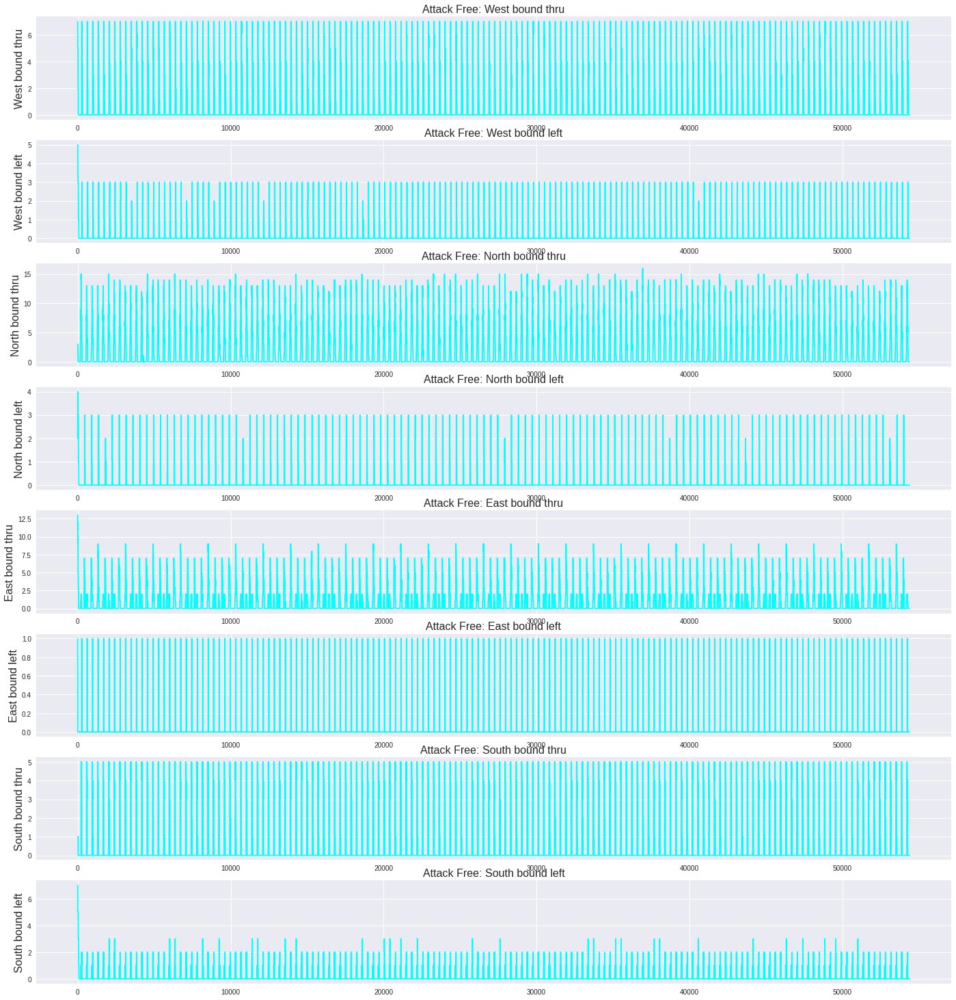

In [ ]:

f, ax = plt.subplots(nrows=8, ncols=1, figsize=(24,26))

for i, col in enumerate(Free_WNES.drop('Unnamed: 0', axis=1).columns):

  sns.lineplot(x=Free_WNES.index, y=Free_WNES[col], ax=ax[i], color = "cyan")
  ax[i].set_title('Attack Free: {}'.format(col), fontsize=16)
  ax[i].set_ylabel(ylabel=col, fontsize=16)


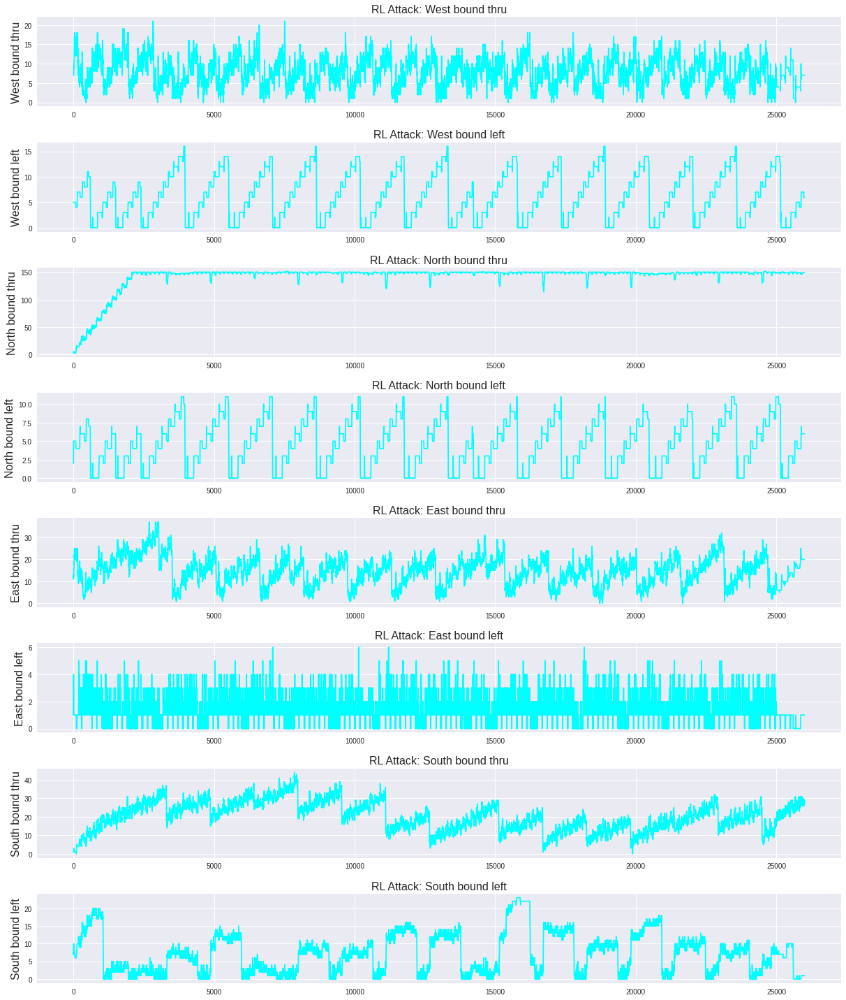

In [ ]:
f, ax = plt.subplots(nrows=8, ncols=1, figsize=(20,24))

for i, col in enumerate(RL_Attack_WNES.drop('Unnamed: 0', axis=1).columns):
  sns.lineplot(x=RL_Attack_WNES.index, y=RL_Attack_WNES[col], ax=ax[i], color="cyan")
  ax[i].set_title("RL Attack: {}".format(col), fontsize=16)
  ax[i].set_ylabel(ylabel=col, fontsize=16)

  plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

**Now merging our RL attack data**


We are merging on the time column having in mind all these data were generated within the same time interval. 

The particular timelines are very inline that the other columns seemlessly connect with the time interval

In [ ]:
"""
Reading all the files together (that is the 3 csv files under RL Attack) and getting to join them using the reduce function.
At this point we want to join 3 files so we can easily analyze and visualize them together. 
"""

files_combined = os.path.join("/content/drive/MyDrive/Data/RL Attack Data/UNDER_ATTACK_DATASET 1 & 2/UNDER_RL_ATTACK_DATASET 1/", "*waiting_time.csv")

#list of merged files returned 
files_combined = glob.glob(files_combined)
print("CSV files after joining the CSV files on the time column")

list_files = map(pd.read_csv, files_combined)

#Now joining files with map, reduce and read_csv

all_df = reduce(lambda left, right: pd.merge(left,right, on=['Unnamed: 0', 'time'], how='left', suffixes=('_accTime', '_time'), copy=False), list_files)

CSV files after joining the CSV files on the time column


In [ ]:
files_combined

['/content/drive/MyDrive/Data/RL Attack Data/UNDER_ATTACK_DATASET 1 & 2/UNDER_RL_ATTACK_DATASET 1/under RL attack [new reward with fake remove] Subject intersec waiting_time.csv',
 '/content/drive/MyDrive/Data/RL Attack Data/UNDER_ATTACK_DATASET 1 & 2/UNDER_RL_ATTACK_DATASET 1/under RL attack [new reward with fake remove] Subject intersec accumulated_waiting_time.csv']

In [ ]:
all_df.head()

,Unnamed: 0,time,West bound thru_accTime,West bound left_accTime,North bound thru_accTime,North bound left_accTime,East bound thru_accTime,East bound left_accTime,South bound thru_accTime,South bound left_accTime,...,West bound thru_time,West bound left_time,North bound thru_time,North bound left_time,East bound thru_time,East bound left_time,South bound thru_time,South bound left_time,current phase_time,set phase_time
0,0,601.0,58.0,98.4,23.5,148.666667,85.598214,92.8,23.875,123.5,...,74.821429,219.333333,20.333333,259.428571,101.1500,215.500000,15.916667,128.333333,1,6
1,1,603.0,59.0,100.4,24.0,150.666667,86.598214,94.8,24.375,125.5,...,75.500000,221.000000,20.666667,261.142857,101.9875,217.166667,16.250000,129.666667,1,6
2,2,605.0,60.0,102.4,24.5,152.666667,87.598214,96.8,24.875,127.5,...,76.178571,222.666667,21.000000,262.857143,102.8250,218.833333,16.583333,131.000000,1,6
3,3,607.0,61.0,104.4,25.0,154.666667,88.598214,98.8,25.375,129.5,...,76.857143,224.333333,21.333333,264.571429,103.6625,220.500000,16.916667,132.333333,1,6
4,4,609.0,62.0,106.4,25.5,156.666667,89.598214,84.0,25.875,131.5,...,77.535714,226.000000,21.666667,266.285714,104.5000,190.428571,17.250000,133.666667,1,6


In [ ]:
all_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25999 entries, 0 to 25998
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                25999 non-null  int64  
 1   time                      25999 non-null  float64
 2   West bound thru_accTime   25999 non-null  float64
 3   West bound left_accTime   25999 non-null  float64
 4   North bound thru_accTime  25999 non-null  float64
 5   North bound left_accTime  25999 non-null  float64
 6   East bound thru_accTime   25999 non-null  float64
 7   East bound left_accTime   25999 non-null  float64
 8   South bound thru_accTime  25999 non-null  float64
 9   South bound left_accTime  25999 non-null  float64
 10  current phase_accTime     25999 non-null  int64  
 11  set phase_accTime         25999 non-null  int64  
 12  West bound thru_time      25999 non-null  float64
 13  West bound left_time      25999 non-null  float64
 14  North 

In [ ]:
all_dfs = reduce(lambda left, right: pd.merge(left,right, left_index=True, right_index=True, how='left', copy=False), [all_df, RL_Attack_WNES])
all_dfs.head()


,Unnamed: 0_x,time,West bound thru_accTime,West bound left_accTime,North bound thru_accTime,North bound left_accTime,East bound thru_accTime,East bound left_accTime,South bound thru_accTime,South bound left_accTime,...,set phase_time,Unnamed: 0_y,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
0,0,601.0,58.0,98.4,23.5,148.666667,85.598214,92.8,23.875,123.5,...,6,0,7,5,2,5,11,2,2,6
1,1,603.0,59.0,100.4,24.0,150.666667,86.598214,94.8,24.375,125.5,...,6,1,7,5,2,5,11,2,2,6
2,2,605.0,60.0,102.4,24.5,152.666667,87.598214,96.8,24.875,127.5,...,6,2,7,5,2,5,11,2,2,6
3,3,607.0,61.0,104.4,25.0,154.666667,88.598214,98.8,25.375,129.5,...,6,3,7,5,3,5,11,2,3,6
4,4,609.0,62.0,106.4,25.5,156.666667,89.598214,84.0,25.875,131.5,...,6,4,7,5,3,6,11,2,3,6


Dropping the Unnamed columns

In [ ]:
all_dfs = all_dfs.drop(['Unnamed: 0_x', 'Unnamed: 0_y'], axis=1)


In [ ]:
all_dfs.head()

,time,West bound thru_accTime,West bound left_accTime,North bound thru_accTime,North bound left_accTime,East bound thru_accTime,East bound left_accTime,South bound thru_accTime,South bound left_accTime,current phase_accTime,...,current phase_time,set phase_time,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
0,601.0,58.0,98.4,23.5,148.666667,85.598214,92.8,23.875,123.5,1,...,1,6,7,5,2,5,11,2,2,6
1,603.0,59.0,100.4,24.0,150.666667,86.598214,94.8,24.375,125.5,1,...,1,6,7,5,2,5,11,2,2,6
2,605.0,60.0,102.4,24.5,152.666667,87.598214,96.8,24.875,127.5,1,...,1,6,7,5,2,5,11,2,2,6
3,607.0,61.0,104.4,25.0,154.666667,88.598214,98.8,25.375,129.5,1,...,1,6,7,5,3,5,11,2,3,6
4,609.0,62.0,106.4,25.5,156.666667,89.598214,84.0,25.875,131.5,1,...,1,6,7,5,3,6,11,2,3,6


In [ ]:
all_dfs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25999 entries, 0 to 25998
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   time                      25999 non-null  float64
 1   West bound thru_accTime   25999 non-null  float64
 2   West bound left_accTime   25999 non-null  float64
 3   North bound thru_accTime  25999 non-null  float64
 4   North bound left_accTime  25999 non-null  float64
 5   East bound thru_accTime   25999 non-null  float64
 6   East bound left_accTime   25999 non-null  float64
 7   South bound thru_accTime  25999 non-null  float64
 8   South bound left_accTime  25999 non-null  float64
 9   current phase_accTime     25999 non-null  int64  
 10  set phase_accTime         25999 non-null  int64  
 11  West bound thru_time      25999 non-null  float64
 12  West bound left_time      25999 non-null  float64
 13  North bound thru_time     25999 non-null  float64
 14  North 

In [ ]:

# We focus on the 'time' column since it is a TimeSeries problem
all_dfs.head().style.set_properties(subset=['time'], **{'background-color': 'dodgerblue'})

,time,West bound thru_accTime,West bound left_accTime,North bound thru_accTime,North bound left_accTime,East bound thru_accTime,East bound left_accTime,South bound thru_accTime,South bound left_accTime,current phase_accTime,set phase_accTime,West bound thru_time,West bound left_time,North bound thru_time,North bound left_time,East bound thru_time,East bound left_time,South bound thru_time,South bound left_time,current phase_time,set phase_time,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
0,601.000000,40.708333,91.200000,43.875000,150.142857,117.500000,129.500000,23.750000,96.000000,1,6,75.107143,208.833333,36.125000,247.875000,133.270833,317.333333,16.000000,63.000000,1,6,7,5,3,2,13,1,1,7
1,603.000000,41.708333,93.200000,44.875000,152.142857,118.500000,131.500000,24.250000,49.000000,1,6,75.785714,210.500000,36.708333,249.625000,131.687500,318.666667,16.250000,42.666667,1,6,7,5,3,2,11,2,1,7
2,605.000000,42.708333,95.200000,45.875000,154.142857,88.791667,89.000000,24.750000,50.000000,1,6,76.464286,212.166667,37.291667,251.375000,106.217262,252.750000,16.500000,43.333333,1,6,7,5,3,3,13,2,1,7
3,607.000000,43.708333,97.200000,46.875000,136.625000,89.625000,90.333333,25.250000,51.000000,1,6,77.142857,213.833333,37.875000,225.000000,106.836310,253.750000,16.750000,44.000000,1,6,7,5,3,3,13,2,1,8
4,609.000000,44.708333,99.200000,47.875000,138.375000,81.589286,68.750000,25.750000,34.666667,1,6,77.821429,215.500000,38.458333,226.555556,96.125000,213.200000,17.000000,33.500000,1,6,7,5,3,4,12,3,1,8


In [ ]:
all_dfs = all_dfs.sort_values(by='time')

# time intervals in seconds
all_dfs['sec_interval'] = all_dfs['time'] - all_dfs['time'].shift(1)

all_dfs[['time', 'sec_interval']].head()

,time,sec_interval
0,601.0,NaN
1,603.0,2.0
2,605.0,2.0
3,607.0,2.0
4,609.0,2.0


In [ ]:
# there is a sequential order in the time interval (that is 2 seconds)
all_dfs['sec_interval'].sample(30)

8713     2.0
8733     2.0
25497    2.0
5650     2.0
25368    2.0
20311    2.0
12612    2.0
20075    2.0
15445    2.0
4226     2.0
15886    2.0
23987    2.0
12       2.0
7897     2.0
16588    2.0
5541     2.0
15392    2.0
6234     2.0
1821     2.0
522      2.0
1724     2.0
8711     2.0
12806    2.0
22867    2.0
25404    2.0
11648    2.0
17627    2.0
13527    2.0
25536    2.0
7590     2.0
Name: sec_interval, dtype: float64

In [ ]:
all_dfs.isna().sum()

time                  0
West bound thru_x     0
West bound left_x     0
North bound thru_x    0
North bound left_x    0
East bound thru_x     0
East bound left_x     0
South bound thru_x    0
South bound left_x    0
current phase_x       0
set phase_x           0
West bound thru_y     0
West bound left_y     0
North bound thru_y    0
North bound left_y    0
East bound thru_y     0
East bound left_y     0
South bound thru_y    0
South bound left_y    0
current phase_y       0
set phase_y           0
West bound thru       0
West bound left       0
North bound thru      0
North bound left      0
East bound thru       0
East bound left       0
South bound thru      0
South bound left      0
sec_interval          1
dtype: int64

In [ ]:
all_dfs = all_dfs.drop('sec_interval', axis=1)

#### Data Preprocessing
**Downsampling**

Using the resample() function we can be able to reduce the number of records to minutes or hours.
It will easily allow to give useful information when reduced. 

In [ ]:
time_test = all_dfs

In [ ]:
import time

time_test['time'] = time_test['time'].apply(lambda seconds: time.strftime("%H:%M:%S", time.gmtime(seconds)))
time_test.head().style.set_properties(subset=['time'], **{'background-color': 'dodgerblue'})

,time,West bound thru_x,West bound left_x,North bound thru_x,North bound left_x,East bound thru_x,East bound left_x,South bound thru_x,South bound left_x,current phase_x,set phase_x,West bound thru_y,West bound left_y,North bound thru_y,North bound left_y,East bound thru_y,East bound left_y,South bound thru_y,South bound left_y,current phase_y,set phase_y,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
0,00:10:01,75.107143,208.833333,36.125000,247.875000,133.270833,317.333333,16.000000,63.000000,1,6,40.708333,91.200000,43.875000,150.142857,117.500000,129.500000,23.750000,96.000000,1,6,7,5,3,2,13,1,1,7
1,00:10:03,75.785714,210.500000,36.708333,249.625000,131.687500,318.666667,16.250000,42.666667,1,6,41.708333,93.200000,44.875000,152.142857,118.500000,131.500000,24.250000,49.000000,1,6,7,5,3,2,11,2,1,7
2,00:10:05,76.464286,212.166667,37.291667,251.375000,106.217262,252.750000,16.500000,43.333333,1,6,42.708333,95.200000,45.875000,154.142857,88.791667,89.000000,24.750000,50.000000,1,6,7,5,3,3,13,2,1,7
3,00:10:07,77.142857,213.833333,37.875000,225.000000,106.836310,253.750000,16.750000,44.000000,1,6,43.708333,97.200000,46.875000,136.625000,89.625000,90.333333,25.250000,51.000000,1,6,7,5,3,3,13,2,1,8
4,00:10:09,77.821429,215.500000,38.458333,226.555556,96.125000,213.200000,17.000000,33.500000,1,6,44.708333,99.200000,47.875000,138.375000,81.589286,68.750000,25.750000,34.666667,1,6,7,5,3,4,12,3,1,8


In [ ]:
time_test.columns

Index(['time', 'West bound thru_x', 'West bound left_x', 'North bound thru_x',
       'North bound left_x', 'East bound thru_x', 'East bound left_x',
       'South bound thru_x', 'South bound left_x', 'current phase_x',
       'set phase_x', 'West bound thru_y', 'West bound left_y',
       'North bound thru_y', 'North bound left_y', 'East bound thru_y',
       'East bound left_y', 'South bound thru_y', 'South bound left_y',
       'current phase_y', 'set phase_y', 'West bound thru', 'West bound left',
       'North bound thru', 'North bound left', 'East bound thru',
       'East bound left', 'South bound thru', 'South bound left'],
      dtype='object')

In [ ]:
time_test['time'] = pd.to_timedelta(time_test['time'])

In [ ]:
time_test.head(30)

,time,West bound thru_x,West bound left_x,North bound thru_x,North bound left_x,East bound thru_x,East bound left_x,South bound thru_x,South bound left_x,current phase_x,...,current phase_y,set phase_y,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
0,0 days 00:10:01,75.107143,208.833333,36.125000,247.875000,133.270833,317.333333,16.00,63.000000,1,...,1,6,7,5,3,2,13,1,1,7
1,0 days 00:10:03,75.785714,210.500000,36.708333,249.625000,131.687500,318.666667,16.25,42.666667,1,...,1,6,7,5,3,2,11,2,1,7
2,0 days 00:10:05,76.464286,212.166667,37.291667,251.375000,106.217262,252.750000,16.50,43.333333,1,...,1,6,7,5,3,3,13,2,1,7
3,0 days 00:10:07,77.142857,213.833333,37.875000,225.000000,106.836310,253.750000,16.75,44.000000,1,...,1,6,7,5,3,3,13,2,1,8
4,0 days 00:10:09,77.821429,215.500000,38.458333,226.555556,96.125000,213.200000,17.00,33.500000,1,...,1,6,7,5,3,4,12,3,1,8
5,0 days 00:10:11,78.500000,217.166667,39.041667,228.111111,100.446429,214.000000,17.25,34.000000,1,...,1,6,7,5,3,4,13,3,1,8
6,0 days 00:10:13,79.178571,218.833333,39.625000,229.666667,85.312500,186.333333,17.50,27.600000,1,...,1,6,7,5,3,5,12,4,1,8
7,0 days 00:10:15,79.857143,220.500000,40.208333,208.100000,85.812500,187.000000,17.75,35.000000,1,...,1,6,7,5,3,5,12,3,1,9
8,0 days 00:10:17,80.535714,222.166667,40.791667,232.777778,86.437500,187.833333,18.00,35.500000,1,...,1,6,7,5,3,5,13,3,1,8
9,0 days 00:10:19,81.214286,223.833333,41.375000,210.900000,87.125000,188.833333,18.25,36.000000,1,...,1,6,7,5,3,5,13,3,1,9


In [ ]:
# time_test.resample('T', label='right', closed='right').sum()

df_downsample = time_test[time_test.columns].resample('T', label='right', closed='right', on='time').sum().reset_index(drop=False)

In [ ]:
df_downsample.head()

,time,West bound thru_x,West bound left_x,North bound thru_x,North bound left_x,East bound thru_x,East bound left_x,South bound thru_x,South bound left_x,current phase_x,...,current phase_y,set phase_y,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
0,0 days 00:10:01,2507.361607,6990.000000,1307.833333,7227.214394,2853.915972,6420.533333,588.750000,1970.6,30,...,30,180,261,150,120,138,468,49,50,244
1,0 days 00:11:01,2655.888393,8490.000000,1854.875000,9396.698413,3155.884722,7400.000000,813.750000,3225.0,30,...,30,180,478,150,91,150,672,30,30,204
2,0 days 00:12:01,3232.250099,9567.433333,2387.500000,10097.142857,3483.215278,8624.266667,1038.750000,4125.0,30,...,30,180,428,143,95,146,649,30,30,180
3,0 days 00:13:01,3319.257738,9594.000000,1811.414881,10479.898810,3717.050316,8232.000000,679.708333,2067.0,30,...,30,174,460,120,350,120,672,13,74,205
4,0 days 00:14:01,2766.078075,9531.079762,939.422024,9097.318182,4062.147926,9672.000000,524.625000,436.5,30,...,30,180,487,156,426,120,662,24,124,291


In [ ]:
"""
Reading all the files together (that is the 3 csv files under RL Attack) and getting to join them using the reduce function.
At this point we want to join 3 files so we can easily analyze and visualize them together. 
"""
files_combined = os.path.join('/content/drive/MyDrive/Data/RL Attack Data .zip (Unzipped Files)/Attack free data Fiver/', "*waiting_time.csv")

#list of merged files returned 
files_combined = glob.glob(files_combined)
print("CSV files after joining the CSV files on the time column")

list_files = map(pd.read_csv, files_combined)

#Now joining files with map, reduce and read_csv

attack_free = reduce(lambda left, right: pd.merge(left,right, on=['Unnamed: 0', 'time'], how='left', copy=False), list_files)

CSV files after joining the CSV files on the time column


In [ ]:
attack_free.head()

,Unnamed: 0,time,West bound thru_x,West bound left_x,North bound thru_x,North bound left_x,East bound thru_x,East bound left_x,South bound thru_x,South bound left_x,...,West bound thru_y,West bound left_y,North bound thru_y,North bound left_y,East bound thru_y,East bound left_y,South bound thru_y,South bound left_y,current phase_y,set phase_y
0,0,601.0,40.208333,90.2,43.375,149.142857,117.000,128.500000,23.50,95.0,...,74.767857,208.000000,35.833333,247.000000,132.904167,316.666667,15.875,62.5,1,6
1,1,602.0,40.708333,91.2,43.875,150.142857,117.500,129.500000,23.75,96.0,...,75.107143,208.833333,36.125000,247.875000,133.270833,317.333333,16.000,63.0,1,6
2,2,603.0,41.208333,92.2,44.375,151.142857,118.000,130.500000,24.00,97.0,...,75.446429,209.666667,36.416667,248.750000,133.637500,318.000000,16.125,63.5,8,6
3,3,604.0,40.400000,93.2,44.875,144.333333,118.500,131.500000,24.25,0.0,...,66.500000,210.500000,36.708333,216.000000,131.687500,318.666667,16.250,0.0,6,6
4,4,605.0,34.650000,94.2,45.375,112.333333,100.625,88.333333,24.50,0.0,...,66.791667,211.333333,37.000000,216.714286,118.645833,252.250000,16.375,0.0,6,6


In [ ]:
attack_free = reduce(lambda left, right: pd.merge(left,right, left_index=True, right_index=True, how='left', copy=False), [attack_free, Free_WNES])

attack_free = attack_free.drop(['Unnamed: 0_x', 'Unnamed: 0_y' ], axis=1)

attack_free['time'] = attack_free['time'].apply(lambda seconds: time.strftime("%H:%M:%S", time.gmtime(seconds)))
attack_free.head().style.set_properties(subset=['time'], **{'background-color': 'dodgerblue'})

attack_free['time'] = pd.to_timedelta(attack_free['time'])

attack_free_ds = attack_free[attack_free.columns].resample('T', label='right', closed='right', on='time').sum().reset_index(drop=False)

In [ ]:
attack_free_ds.head()

,time,West bound thru_x,West bound left_x,North bound thru_x,North bound left_x,East bound thru_x,East bound left_x,South bound thru_x,South bound left_x,current phase_x,...,current phase_y,set phase_y,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
0,0 days 00:10:01,504.866667,1561.783333,932.125000,1332.278571,1864.264286,1407.916667,722.250000,288.0,254,...,254,232,143,174,52,150,354,3,27,261
1,0 days 00:11:01,0.000000,91.000000,0.000000,44.000000,0.000000,84.000000,0.000000,0.0,136,...,136,76,0,7,0,7,0,0,0,17
2,0 days 00:12:01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0,...,0,0,0,0,9,0,0,0,0,0
3,0 days 00:13:01,0.000000,0.000000,2.270833,10.000000,0.000000,0.000000,0.000000,0.0,62,...,62,24,0,0,524,0,76,0,119,30
4,0 days 00:14:01,3.937500,4.833333,26.275000,45.000000,9.500000,0.000000,8.208333,6.0,196,...,196,128,256,56,245,0,36,19,112,56


### PLOTS

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


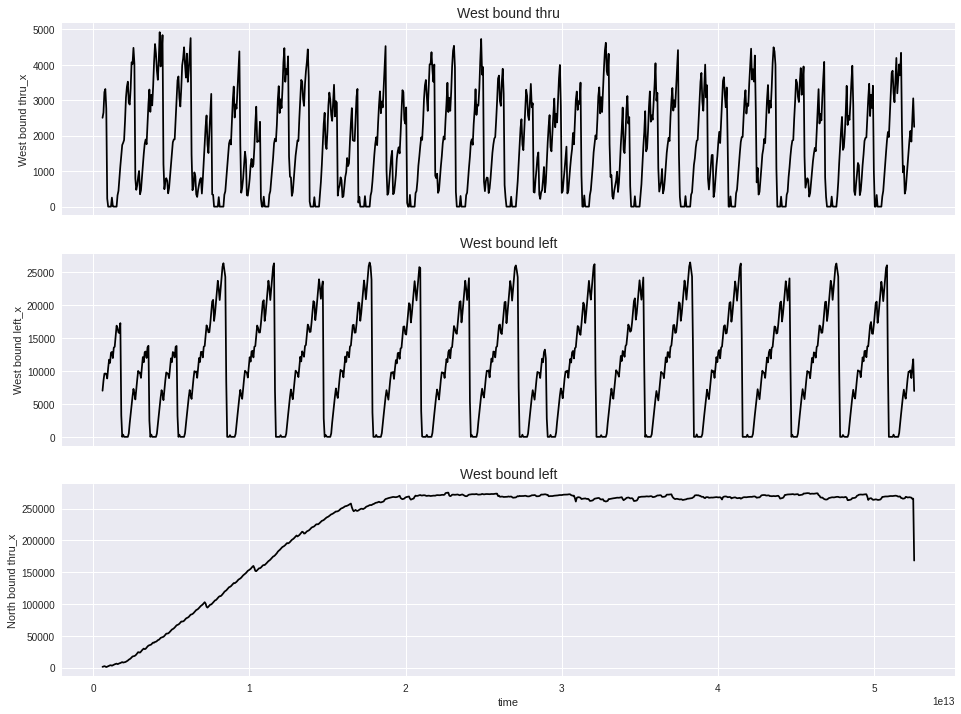

In [ ]:
fig, ax = plt.subplots(ncols=1, nrows=3, sharex=True, figsize=(16,12))

sns.lineplot(df_downsample['time'], df_downsample['West bound thru_x'], color='black', ax=ax[0])
ax[0].set_title('West bound thru', fontsize=14)

sns.lineplot(df_downsample['time'], df_downsample['West bound left_x'], color='black', ax=ax[1])
ax[1].set_title('West bound left', fontsize=14)

sns.lineplot(df_downsample['time'], df_downsample['North bound thru_x'], color='black', ax=ax[2])
ax[2].set_title('West bound left', fontsize=14)

plt.show()

In [ ]:
#Try to plot time against the other columns we have 

def plot_data(df, col_range, descr, nrows, clr):
  f, ax = plt.subplots(nrows, ncols=1, figsize=(18, 24 ))

  for i, column in enumerate(col_range):
    sns.lineplot(x=df['time'], y=df[column], ax=ax[i], color = clr)
    ax[i].set_title(descr.format(column.split("_")[0]), fontsize=14)
    ax[i].set_ylabel(ylabel=column.split("_")[0], fontsize=14)
    ax[i].ticklabel_format(useOffset=False)

    plt.subplots_adjust(left=0.1,
                      bottom=0.1, 
                      right=0.9, 
                      top=0.9, 
                      wspace=0.4, 
                      hspace=0.4)
  
  return f
  

In [ ]:
df_downsample.head()

,time,West bound thru_x,West bound left_x,North bound thru_x,North bound left_x,East bound thru_x,East bound left_x,South bound thru_x,South bound left_x,current phase_x,...,current phase_y,set phase_y,West bound thru,West bound left,North bound thru,North bound left,East bound thru,East bound left,South bound thru,South bound left
0,0 days 00:10:01,2507.361607,6990.000000,1307.833333,7227.214394,2853.915972,6420.533333,588.750000,1970.6,30,...,30,180,261,150,120,138,468,49,50,244
1,0 days 00:11:01,2655.888393,8490.000000,1854.875000,9396.698413,3155.884722,7400.000000,813.750000,3225.0,30,...,30,180,478,150,91,150,672,30,30,204
2,0 days 00:12:01,3232.250099,9567.433333,2387.500000,10097.142857,3483.215278,8624.266667,1038.750000,4125.0,30,...,30,180,428,143,95,146,649,30,30,180
3,0 days 00:13:01,3319.257738,9594.000000,1811.414881,10479.898810,3717.050316,8232.000000,679.708333,2067.0,30,...,30,174,460,120,350,120,672,13,74,205
4,0 days 00:14:01,2766.078075,9531.079762,939.422024,9097.318182,4062.147926,9672.000000,524.625000,436.5,30,...,30,180,487,156,426,120,662,24,124,291


#### RL Attack

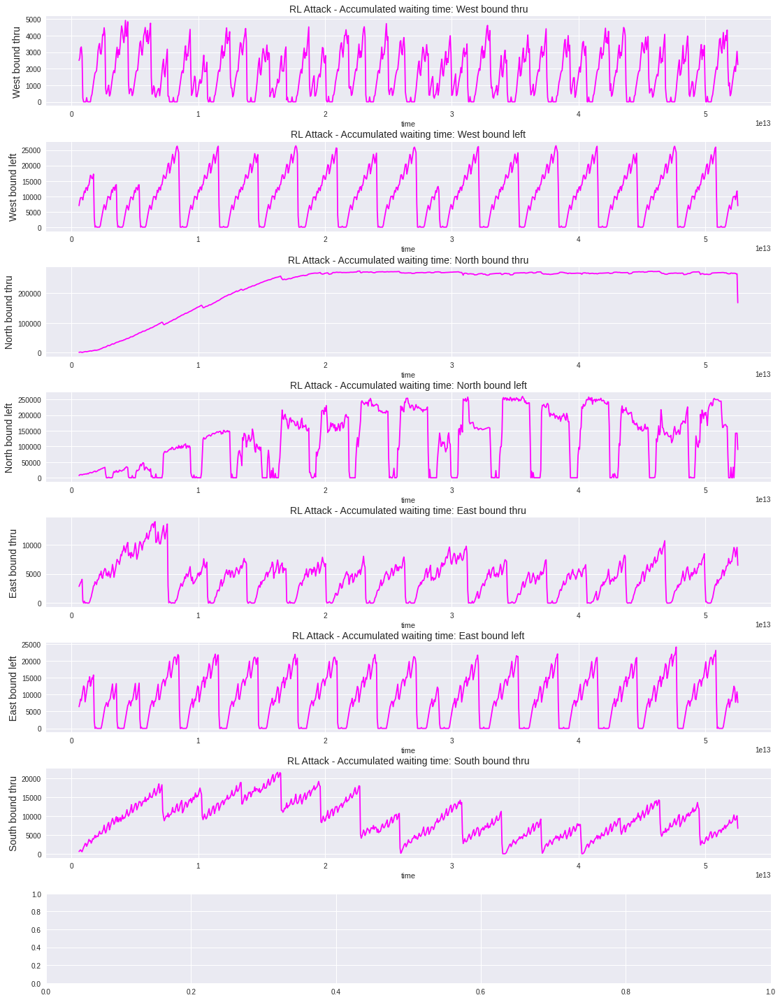

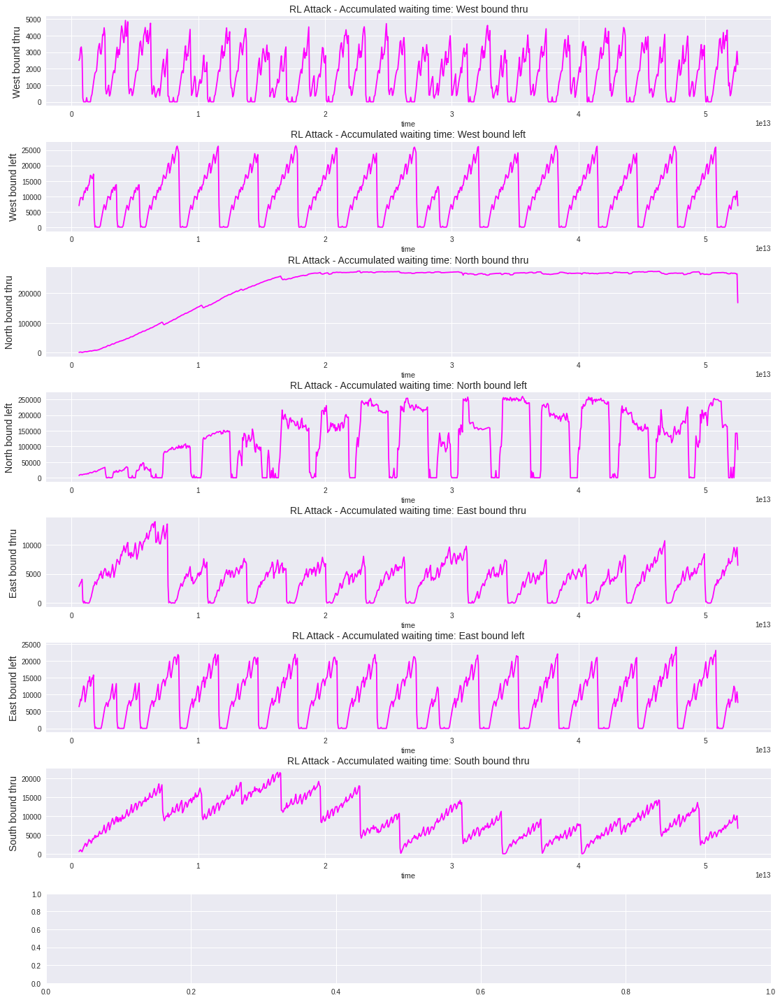

In [ ]:
plot_data(df_downsample, df_downsample.columns[1:8], "RL Attack - Accumulated waiting time: {}", 8, "magenta")

plot RL Attack waiting time

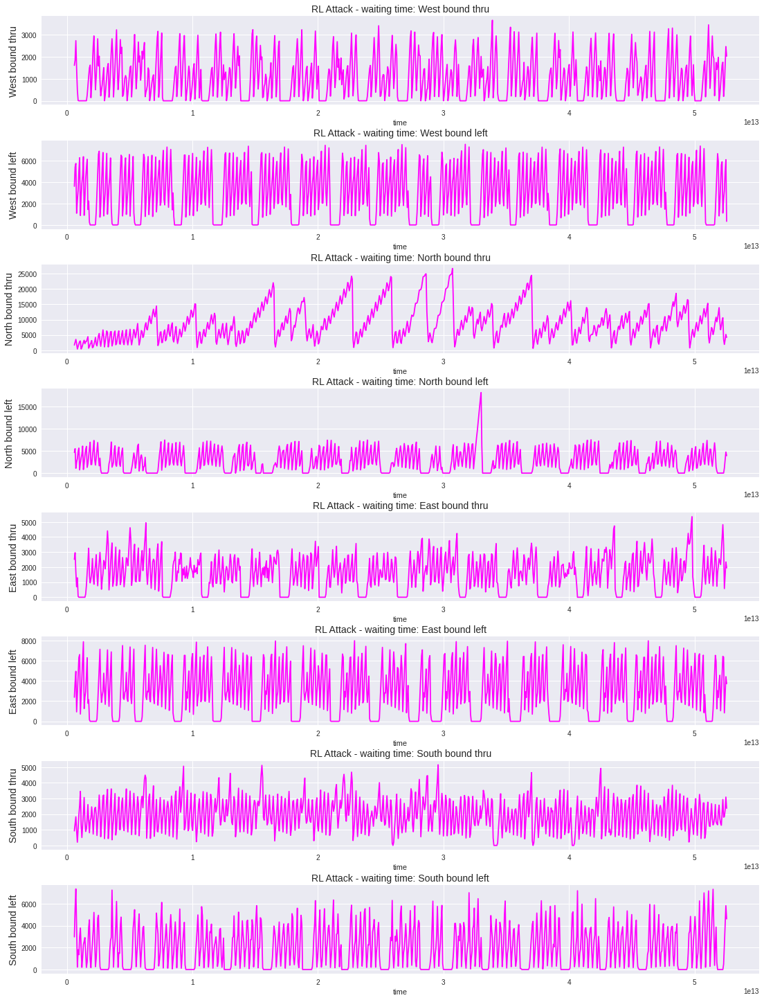

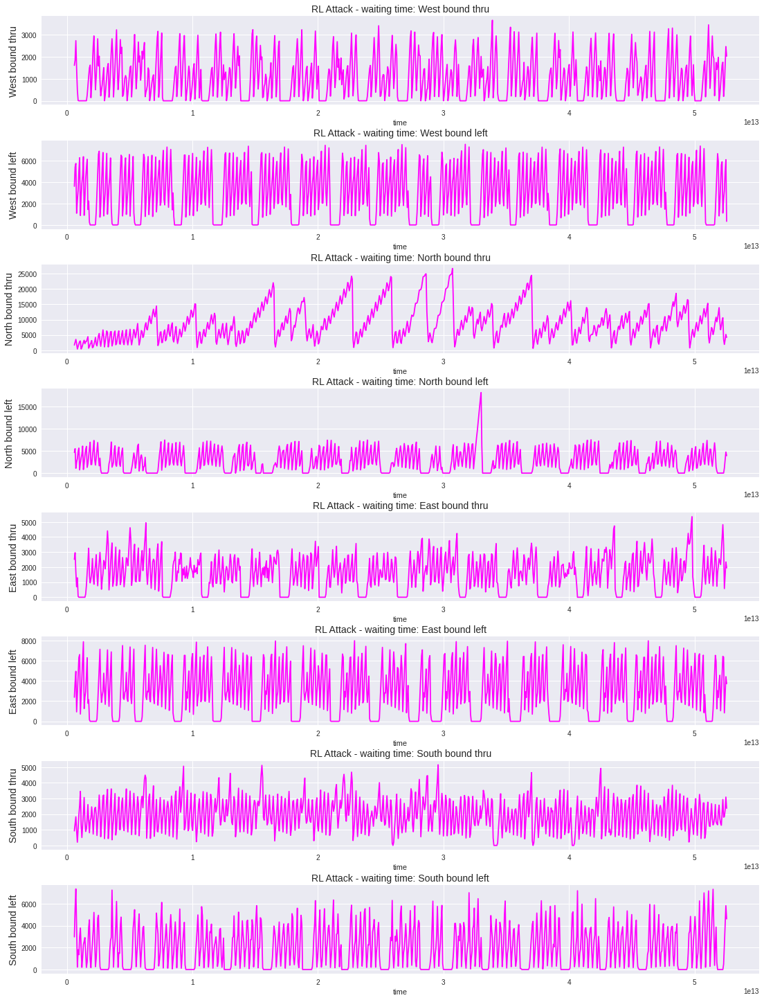

In [ ]:
plot_data(df_downsample, df_downsample.columns[11:19], "RL Attack - waiting time: {}", 8, "magenta")

RL Attack WNES

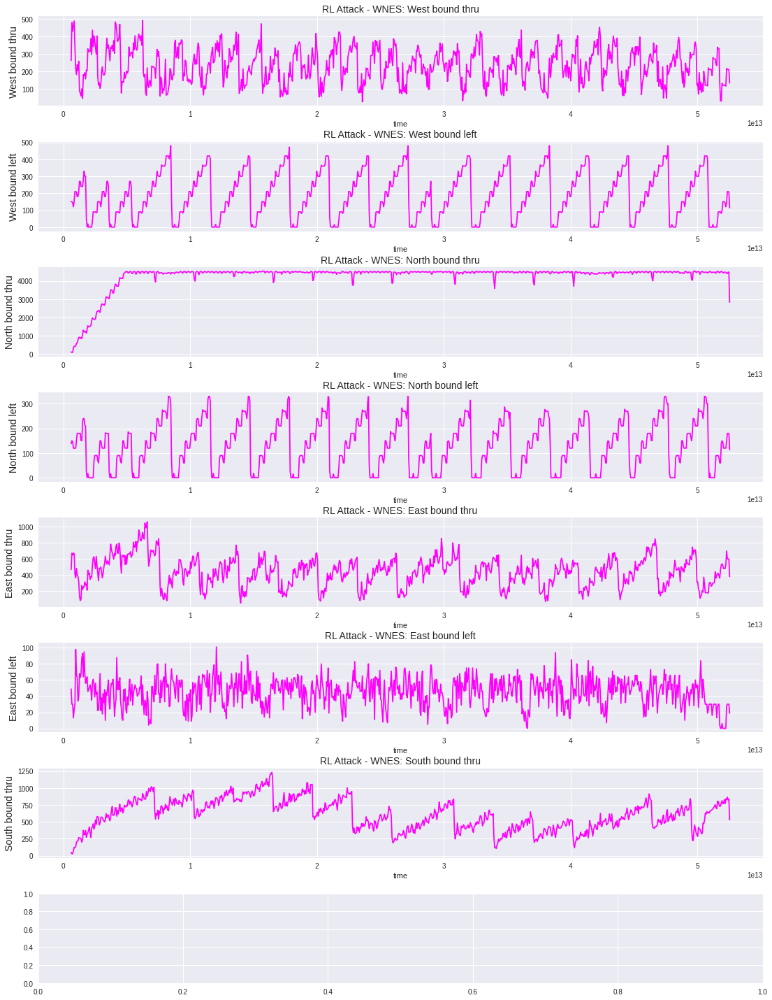

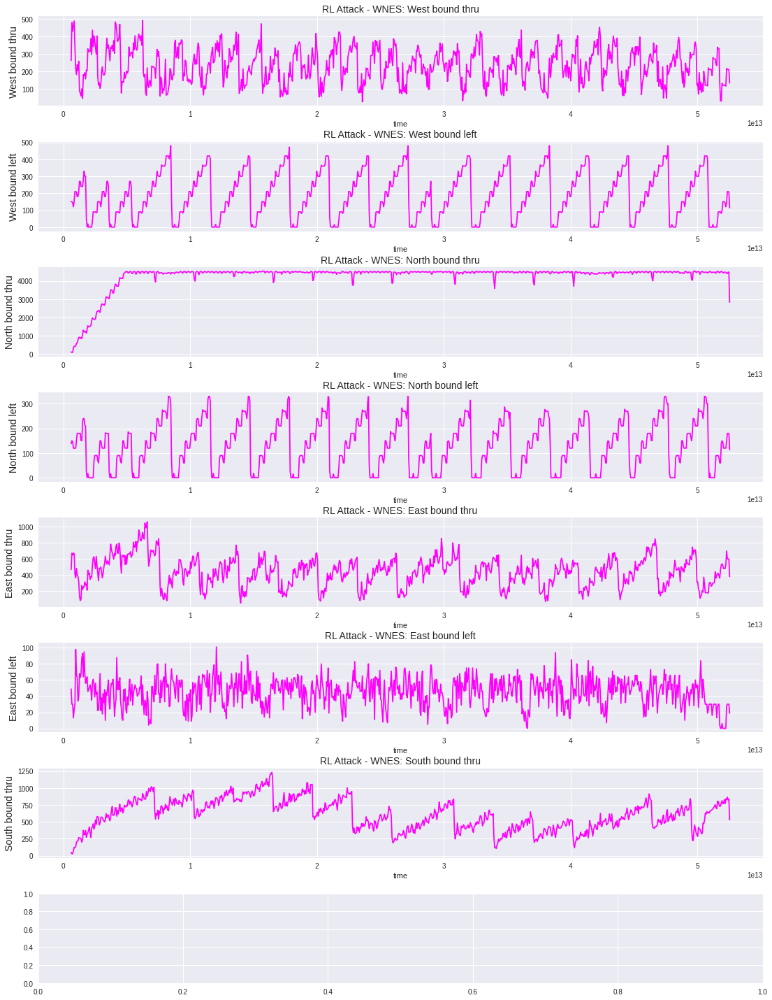

In [ ]:

plot_data(df_downsample, df_downsample.columns[21:-1], "RL Attack - WNES: {}", 8, "magenta")

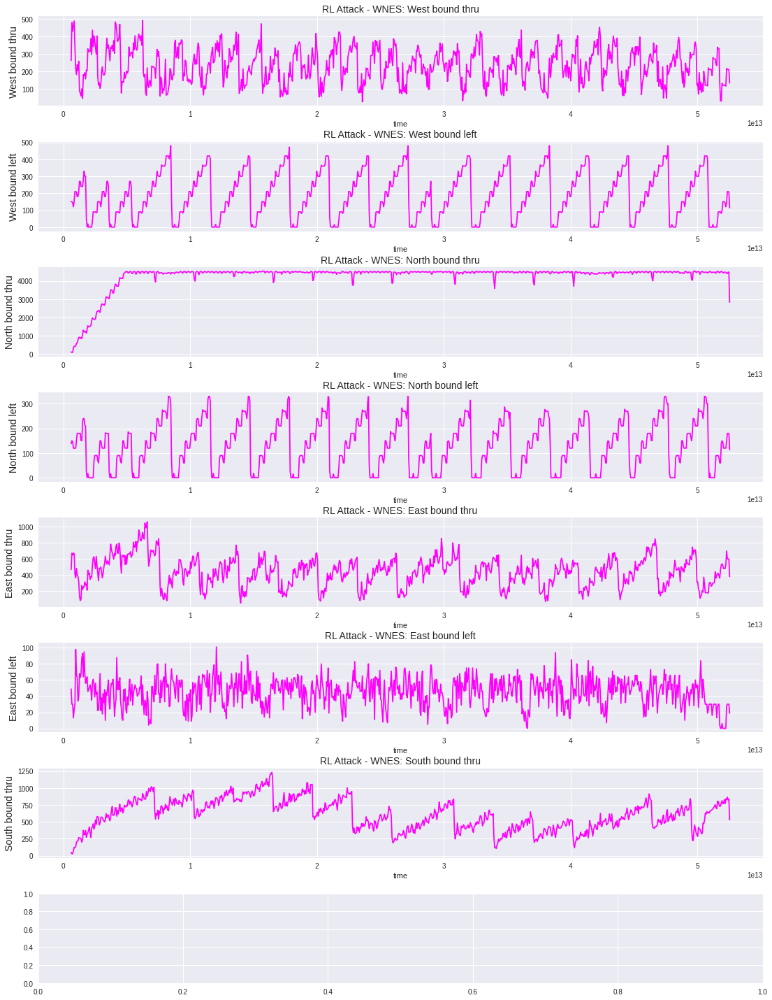

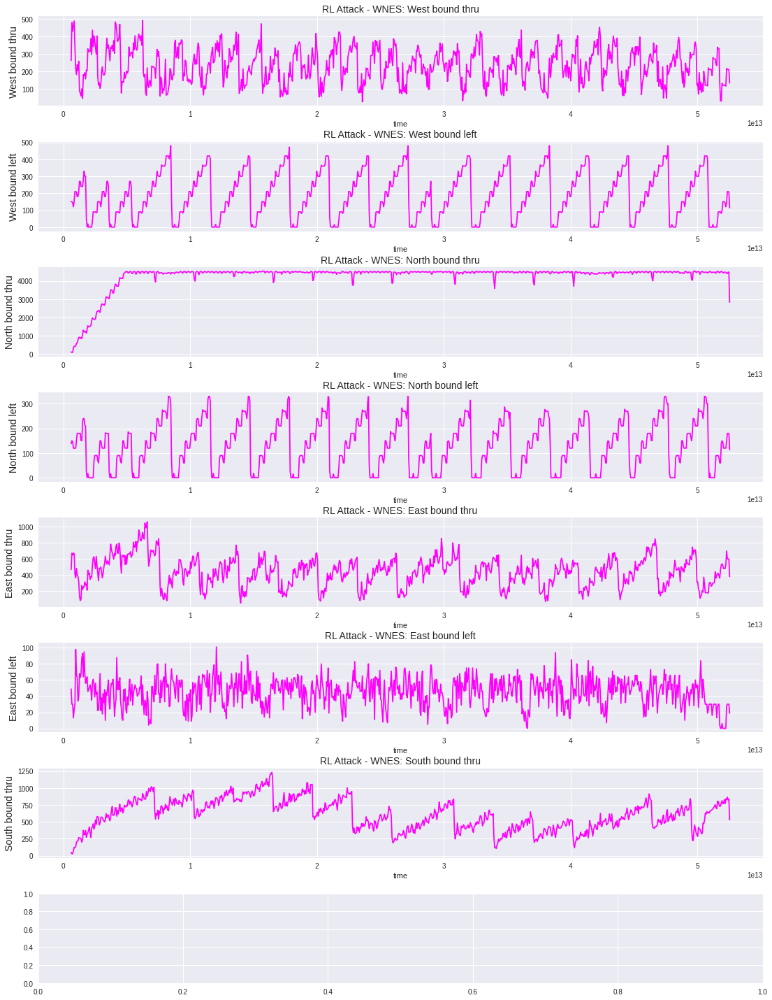

In [ ]:

plot_data(df_downsample, df_downsample.columns[21:-1], "RL Attack - WNES: {}", 8, "magenta")

#### Attack free 

Attack Free waiting time

In [ ]:
attack_free_ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 907 entries, 0 to 906
Data columns (total 29 columns):
 #   Column              Non-Null Count  Dtype          
---  ------              --------------  -----          
 0   time                907 non-null    timedelta64[ns]
 1   West bound thru_x   907 non-null    float64        
 2   West bound left_x   907 non-null    float64        
 3   North bound thru_x  907 non-null    float64        
 4   North bound left_x  907 non-null    float64        
 5   East bound thru_x   907 non-null    float64        
 6   East bound left_x   907 non-null    float64        
 7   South bound thru_x  907 non-null    float64        
 8   South bound left_x  907 non-null    float64        
 9   current phase_x     907 non-null    int64          
 10  set phase_x         907 non-null    int64          
 11  West bound thru_y   907 non-null    float64        
 12  West bound left_y   907 non-null    float64        
 13  North bound thru_y  907 non-null   

In [ ]:
# import datetime
# test_free = attack_free_ds
# # attack_free_ds.time = datetime.timedelta(attack_free_ds)
# # attack_free_ds.set_index('time')

# # Create a date

# today = datetime.date(2022, 5, 24)

 

# # # Increase a time duration of hours

# # attack_free_ds['time'] = attack_free_ds['time'].apply(lambda today: today+attack_free_ds['time'])

# # oneAM       = today+timeDelta

 

# # print("Date : %s"%(today))

# # print("Date + 1 hour : %s"%(oneAM))
# checking_ = attack_free_ds['time']

# # attack_free_ds['time'] = attack_free_ds['time'].apply(lambda i, checking_: today+i)

# """
# for i in checking_:
#   f = lambda i: today+i

# # time_test['time'] = time_test['time'].apply(lambda seconds: time.strftime("%H:%M:%S", time.gmtime(seconds)))


# """
# checking_ = checking_.apply(lambda x: datetime.timedelta(today+ x) if x else np.nan)
#  '''
#  Our next implementation is to have the minutes concatenated with the 
#  date 
#  -> problem running into 
#     attack_free_ds["time"][0].strip("")[2] -> 'Timedelta' object has no attribute 'strip'
#  '''

#     # lambda row: np.nan  if np.isnan(row['anom_value']) else row['tqr values'],


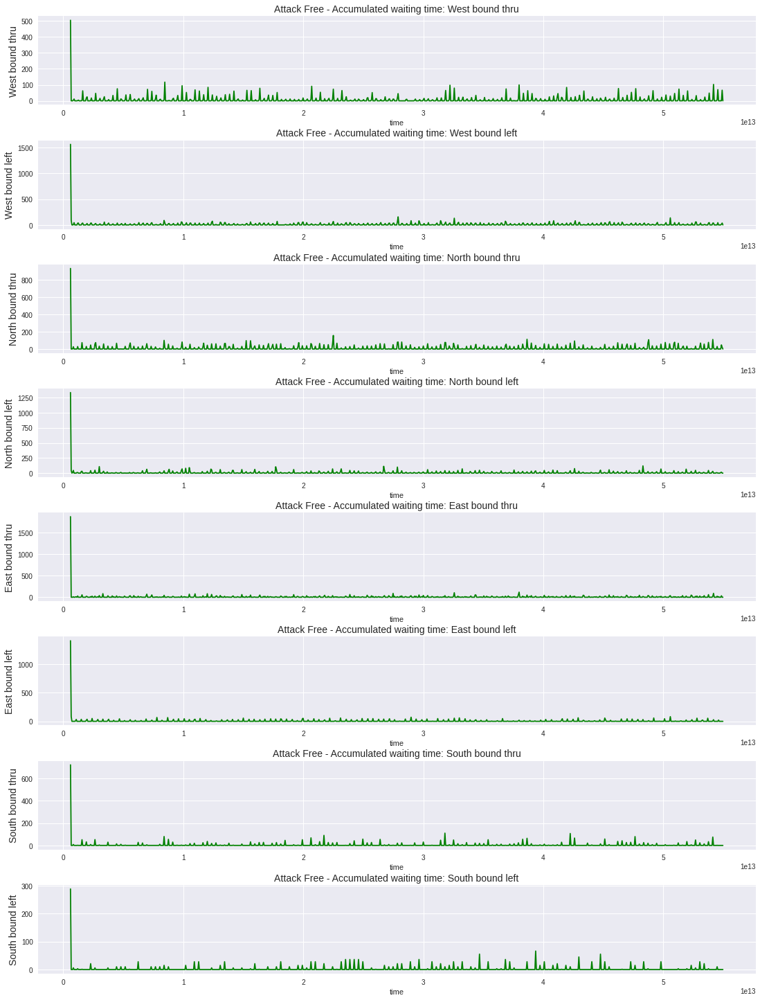

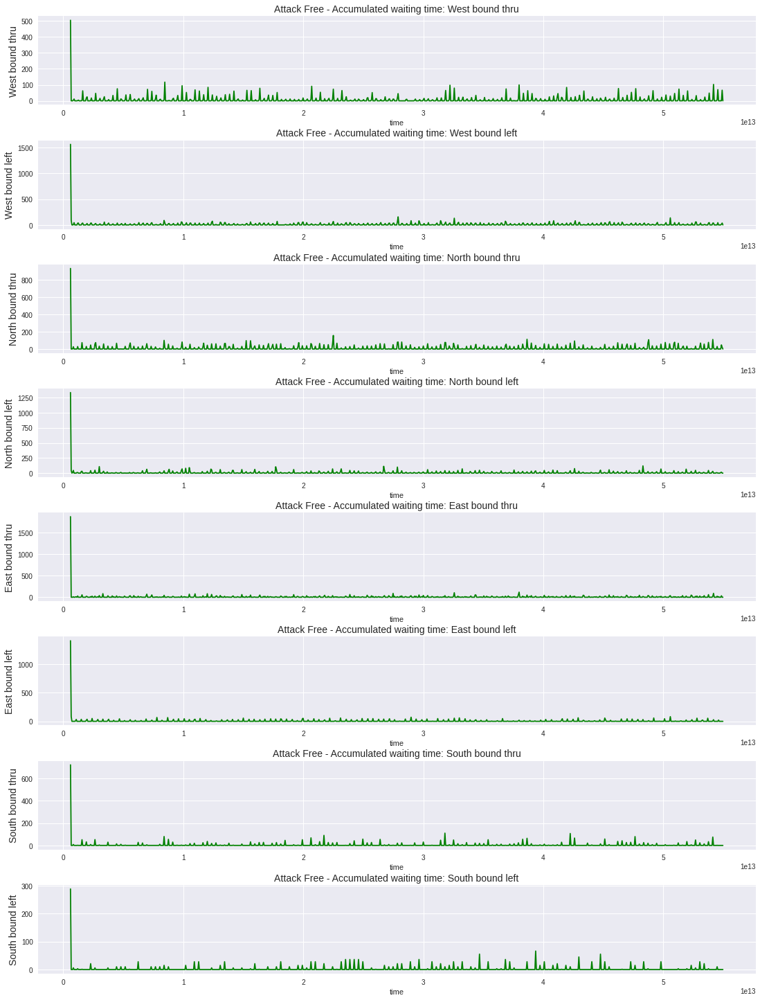

In [ ]:
plot_data(attack_free_ds, attack_free_ds.columns[1:9], "Attack Free - Accumulated waiting time: {}", 8, "green")


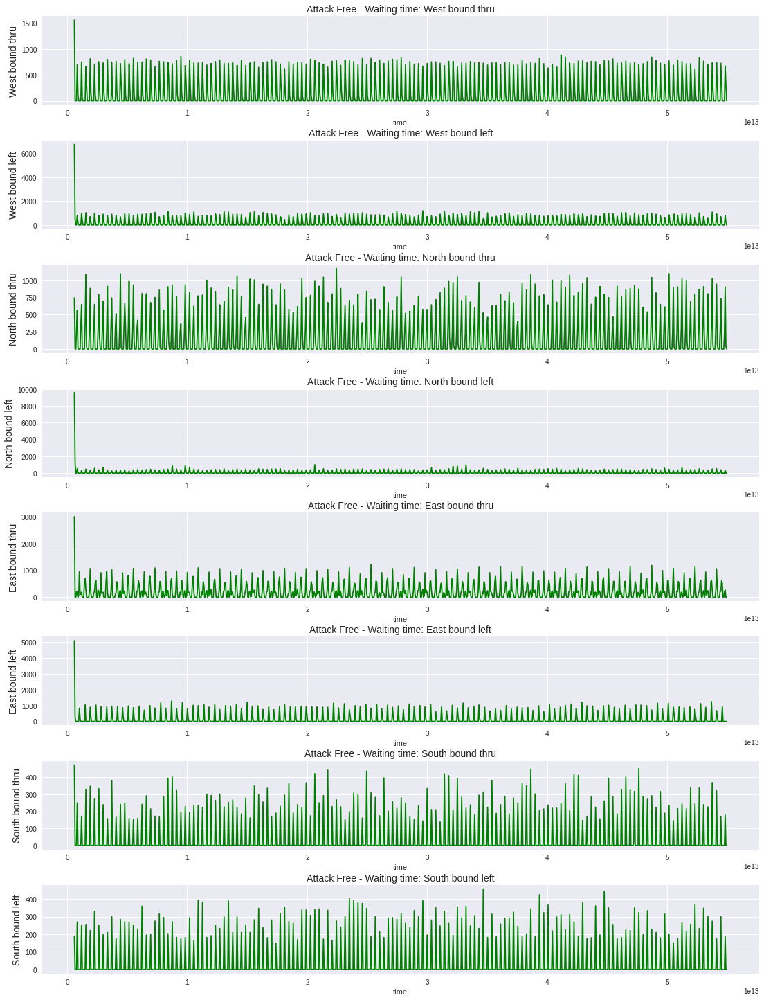

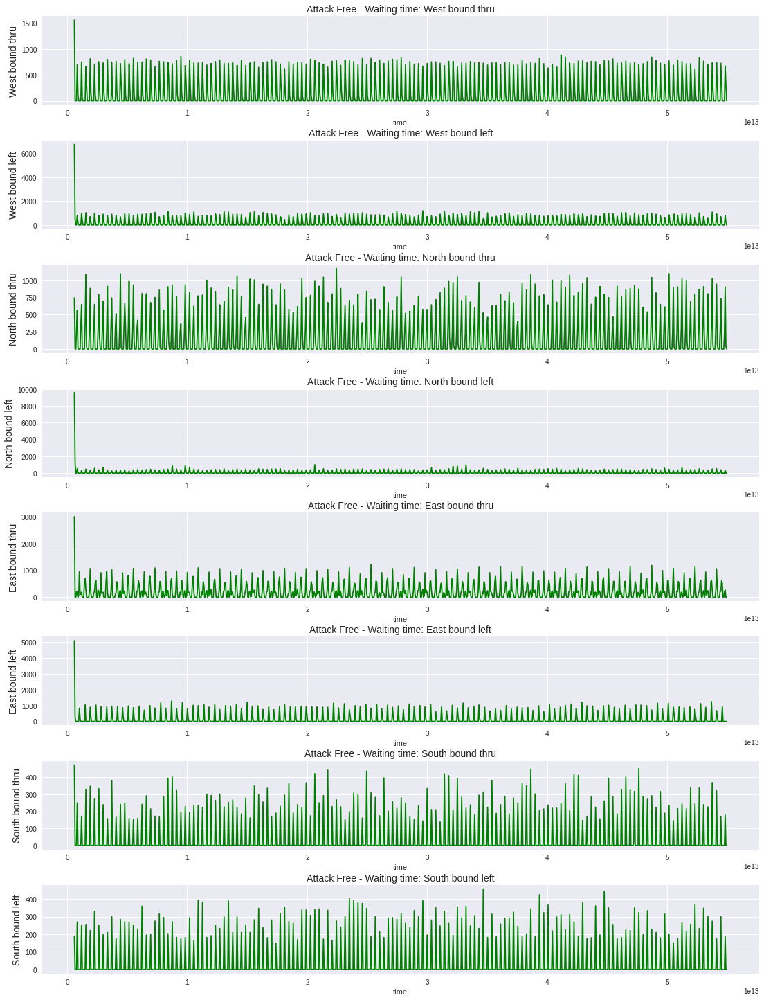

In [ ]:
plot_data(attack_free_ds, attack_free_ds.columns[11:19], "Attack Free - Waiting time: {}", 8, "green")


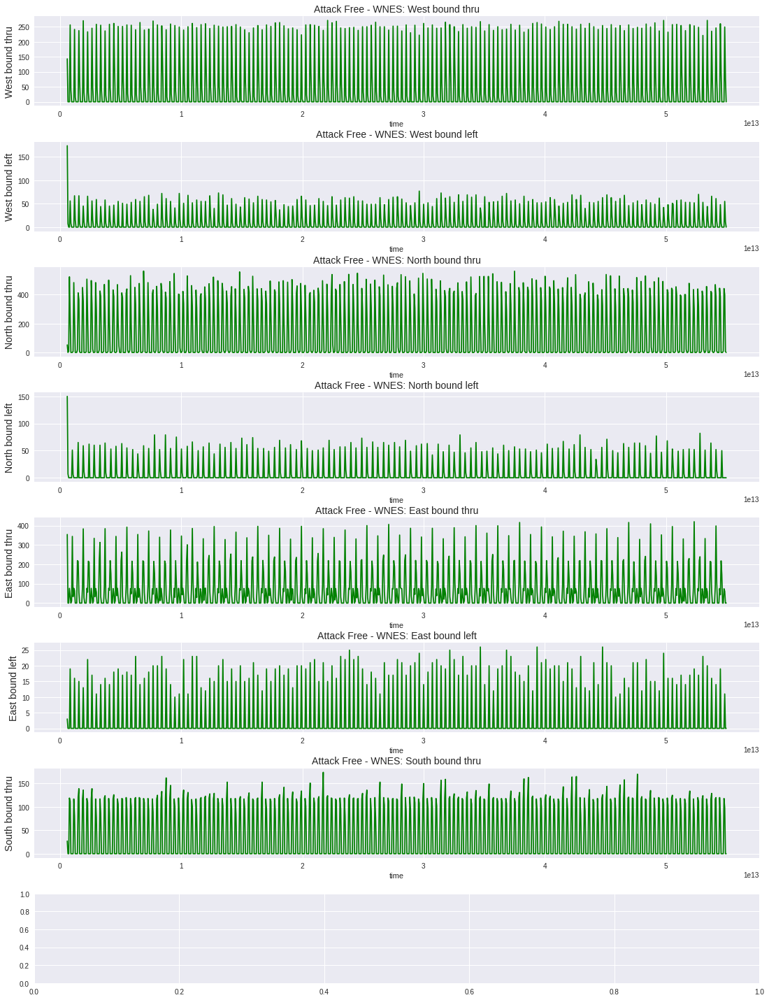

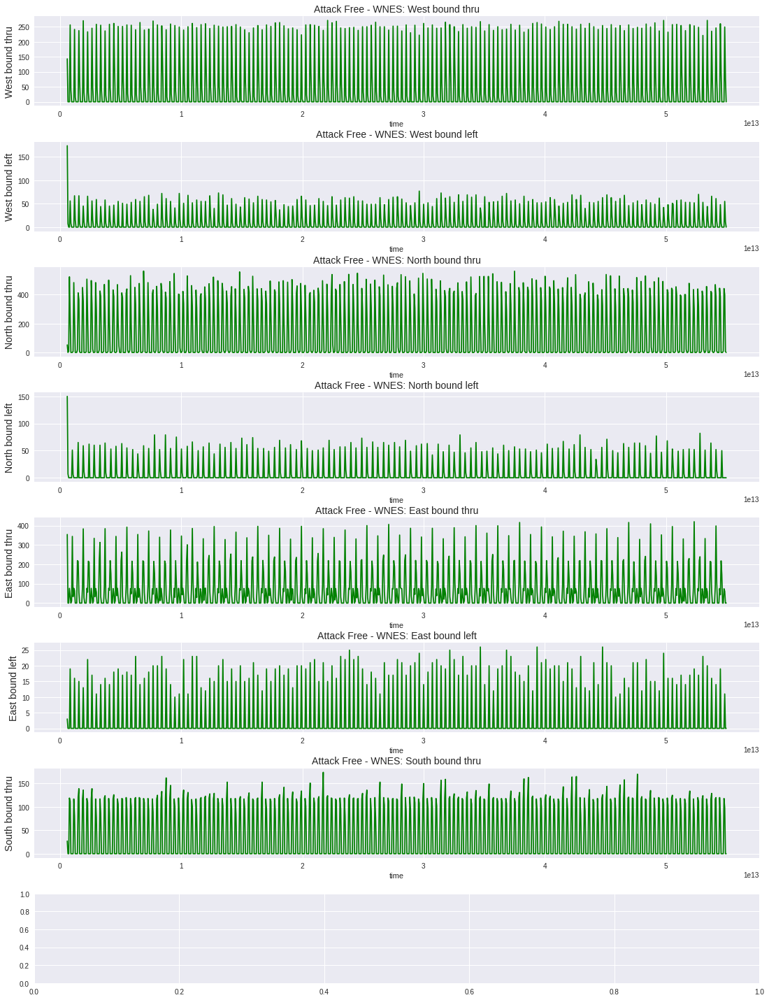

In [ ]:
plot_data(attack_free_ds, attack_free_ds.columns[21:-1], "Attack Free - WNES: {}", 8, "green")


### Backtest method - TimeSerieSplit

In [ ]:
val_df = Free_AccWaiting.iloc[:, :9]

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)
for train_index, test_index in tscv.split(val_df):
  print('TRAIN:', train_index, '\n \n TEST:', test_index) 
  X_train, X_test = val_df['time'][train_index], val_df['time'][test_index]
  y_train, y_test = val_df['West bound left'][train_index], val_df['West bound left'][test_index]

TRAIN: [    0     1     2 ... 83231 83232 83233] 
 
 TEST: [ 83234  83235  83236 ... 166464 166465 166466]
TRAIN: [     0      1      2 ... 166464 166465 166466] 
 
 TEST: [166467 166468 166469 ... 249697 249698 249699]
TRAIN: [     0      1      2 ... 249697 249698 249699] 
 
 TEST: [249700 249701 249702 ... 332930 332931 332932]
TRAIN: [     0      1      2 ... 332930 332931 332932] 
 
 TEST: [332933 332934 332935 ... 416163 416164 416165]
TRAIN: [     0      1      2 ... 416163 416164 416165] 
 
 TEST: [416166 416167 416168 ... 499396 499397 499398]


In [ ]:
#Splitting according to the above description
train1, test1 = val_df.iloc[:83233, :], val_df.iloc[83233:166466, :]
train2, test2 = val_df.iloc[:166466, :], val_df.iloc[166466:249699, :]
train3, test3 = val_df.iloc[:249699, :], val_df.iloc[249699:332932, :]
train4, test4 = val_df.iloc[:332932, :], val_df.iloc[332932:416165, :]
train5, test5 = val_df.iloc[:416165, :], val_df.iloc[416165:499398, :]

In [ ]:
train5.shape

(416165, 9)

In [ ]:
from sklearn.preprocessing import MinMaxScaler

def scaling(validation_data):
  data_val = validation_data.filter(['West bound thru', 'West bound left', 'North bound thru',
        'North bound left', 'East bound thru', 'East bound left',
        'South bound thru', 'South bound left'])  #remain with y values

  #convert the dataframe to a numpy array
  dataset_val = data_val.values

  scaler = MinMaxScaler(feature_range=(0,1))
  scaled_data_val = scaler.fit_transform(dataset_val)
  return scaled_data_val

In [ ]:
train1 = scaling(train1) 
test1 = scaling(test1) 
train2 = scaling(train2) 
test2 = scaling(test2)
train3 = scaling(train3) 
test3 = scaling(test3)
train4 = scaling(train4) 
test4 = scaling(test4)
train5 = scaling(train5) 
test5 = scaling(test5)

In [ ]:
train1[:, 0]

array([0.99100379, 0.99550189, 1.        , ..., 0.        , 0.        ,
       0.        ])

In [ ]:
train1.shape

(83233, 8)

In [ ]:

# Defines the rolling window
window_len = 30

#train and test sets after splitting using the TimeSeriesSplit() method
                      #train values                  test values
                      #  train1                           test1

def create_dataset(df, window_size=7):
  df_as_np = np.array(df)
  X = []
  y = []
  for i in range(len(df_as_np)-window_size):
    row = [r for r in df_as_np[i:i+window_size]]
    X.append(row)
    label = df_as_np[i+window_size][0:9]          # df_as_np[i+window_size][1]]
    y.append(label)
  return np.array(X), np.array(y)




#creating rolling windows for the dataset and reshaping of the data
#data in rolling windows
x_train1, y_train1 = create_dataset(train1, window_len)
x_test1, y_test1 = create_dataset(test1, window_len)

x_train2, y_train2 = create_dataset(train2, window_len)
x_test2, y_test2 = create_dataset(test2, window_len)

x_train3, y_train3 = create_dataset(train3, window_len)
x_test3, y_test3 = create_dataset(test3, window_len)

x_train4, y_train4 = create_dataset(train4, window_len)
x_test4, y_test4 = create_dataset(test4, window_len)

x_train5, y_train5 = create_dataset(train5, window_len)
x_test5, y_test5 = create_dataset(test5, window_len)

#reshape input to be [samples, time steps, features]
x_train1 = np.reshape(x_train1, (x_train1.shape[0], 8, x_train1.shape[1]))
x_test1 = np.reshape(x_test1, (x_test1.shape[0], 8, x_test1.shape[1]))

x_train2 = np.reshape(x_train2, (x_train2.shape[0], 8, x_train2.shape[1]))
x_test2 = np.reshape(x_test2, (x_test2.shape[0], 8, x_test2.shape[1]))

x_train3 = np.reshape(x_train3, (x_train3.shape[0], 8, x_train3.shape[1]))
x_test3 = np.reshape(x_test3, (x_test3.shape[0], 8, x_test3.shape[1]))

x_train4 = np.reshape(x_train4, (x_train4.shape[0], 8, x_train4.shape[1]))
x_test4 = np.reshape(x_test4, (x_test4.shape[0], 8, x_test4.shape[1]))

x_train5 = np.reshape(x_train5, (x_train5.shape[0], 8, x_train5.shape[1]))
x_test5 = np.reshape(x_test5, (x_test5.shape[0], 8, x_test5.shape[1]))



In [ ]:
x_train2.shape

(166436, 8, 30)

In [ ]:
x_train1.shape


(83203, 8, 30)

#### lstm

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM

from sklearn.metrics import mean_absolute_error, mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler


#Build the LSTM model 2
model = Sequential()
model.add(LSTM(128, input_shape=(x_train1.shape[1], x_train1.shape[2]), return_sequences=True,))
model.add(Dropout(0.2))

model.add(LSTM(128))

model.add(Dense(x_train1.shape[1], activation="relu"))


model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 8, 128)            81408     
                                                                 
 dropout_2 (Dropout)         (None, 8, 128)            0         
                                                                 
 lstm_5 (LSTM)               (None, 128)               131584    
                                                                 
 dense_2 (Dense)             (None, 8)                 1032      
                                                                 
Total params: 214,024
Trainable params: 214,024
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(optimizer=Adam(learning_rate=0.001), loss = "mae", metrics = ["acc"])  #loss=MeanSquaredError()   metrics=[RootMeanSquaredError()]

# using early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor = 'val_loss', mode = 'min', verbose = 0, patience = 3)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint('model/', verbose = 0, save_best_only=True)

In [ ]:

#training the data
model1= model.fit(x_train1, y_train1, validation_data=(x_test1, y_test1), epochs=100, callbacks=[checkpointer, earlystopping], verbose=0)
pred1 = model1.model.predict(x_test1)
MSE1=round(mean_squared_error(y_test1, pred1),2)


model2 = model.fit(x_train2, y_train2, validation_data=(x_test2, y_test2), epochs=100, callbacks=[checkpointer, earlystopping], verbose=0)
pred2 = model2.model.predict(x_test2)
MSE2=round(mean_squared_error(y_test2, pred2),2)

model3 = model.fit(x_train3, y_train3, validation_data=(x_test3, y_test3), epochs=100, callbacks=[checkpointer, earlystopping], verbose=0)
pred3 = model3.model.predict(x_test3)
MSE3=round(mean_squared_error(y_test3, pred3),2)

model4 = model.fit(x_train4, y_train4, validation_data=(x_test4, y_test4), epochs=100, callbacks=[checkpointer, earlystopping], verbose=0)
pred4 = model4.model.predict(x_test4)
MSE4=round(mean_squared_error(y_test4, pred4),2)

model5 = model.fit(x_train5, y_train5, validation_data=(x_test5, y_test5), epochs=100, callbacks=[checkpointer, earlystopping], verbose=0)
pred5 = model5.model.predict(x_test5)
MSE5=round(mean_squared_error(y_test5, pred5),2)


In [ ]:
# # Save the entire model as a SavedModel.
# !mkdir -p saved_model
# model1.model.save('/content/drive/MyDrive/Data/RL Attack Data .zip (Unzipped Files)/saved_model/model1')
# model2.model.save('/content/drive/MyDrive/Data/RL Attack Data .zip (Unzipped Files)/saved_model/model2')
# model3.model.save('/content/drive/MyDrive/Data/RL Attack Data .zip (Unzipped Files)/saved_model/model3')
# model4.model.save('/content/drive/MyDrive/Data/RL Attack Data .zip (Unzipped Files)/saved_model/model4')
# model5.model.save('/content/drive/MyDrive/Data/RL Attack Data .zip (Unzipped Files)/saved_model/model5')

In [ ]:
print("MSE1: {} \n MSE2: {} \n MSE3: {} \n MSE4: {} \n MSE5: {}".format(
      MSE1,MSE2,MSE3,MSE4,MSE5
))

MSE1: 0.04 
 MSE2: 0.04 
 MSE3: 0.04 
 MSE4: 0.04 
 MSE5: 0.04


In [ ]:
Overall_MSE=round((MSE1+MSE2+MSE3+MSE4+MSE5)/5,2)
print ("Overall MSE:", Overall_MSE) 

Overall MSE: 0.04


loading a model

In [ ]:
import tensorflow

cv_model4 = tensorflow.keras.models.load_model('/content/drive/MyDrive/Data/RL Attack Data .zip (Unzipped Files)/saved_model/model4')

# Check its architecture
cv_model4.summary()

# Evaluate the restored model
loss, acc = cv_model4.evaluate(x_test4, y_test4, verbose=2)
print('Restored model, accuracy: {:5.2f}%'.format(100 * acc))

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 8, 128)            81408     
                                                                 
 dropout_2 (Dropout)         (None, 8, 128)            0         
                                                                 
 lstm_5 (LSTM)               (None, 128)               131584    
                                                                 
 dense_2 (Dense)             (None, 8)                 1032      
                                                                 
Total params: 214,024
Trainable params: 214,024
Non-trainable params: 0
_________________________________________________________________
2601/2601 - 17s - loss: 0.0705 - acc: 0.5728 - 17s/epoch - 7ms/step
Restored model, accuracy: 57.28%


In [ ]:
# #plotting validation and train accuracies and losses
# plt.plot(cv_model4.history.history['val_loss'], 'r', cv_model4.history.history['val_loss'], 'b', 
# model3.history.history['val_loss'], 'g')

### LSTM MODEL TRAINING

In [ ]:
len(Free_AccWaiting)

1999399

In [ ]:
from sklearn.model_selection import TimeSeriesSplit

N_SPLITS = 3

X = Free_AccWaiting['time']
y = Free_AccWaiting.iloc[:, 1:9]   #accumulated waiting time features
# attack_free_ds.columns[1:9]

folds = TimeSeriesSplit(n_splits= N_SPLITS)

In [ ]:
y.columns  

Index(['time', 'West bound thru', 'West bound left', 'North bound thru',
       'North bound left', 'East bound thru', 'East bound left',
       'South bound thru'],
      dtype='object')

In [ ]:
# f, ax = plt.subplots(nrows=N_SPLITS, ncols=10, figsize=(16,14))

# for i, (train_index, valid_index) in enumerate(folds.split(X)):
#   X_train, X_valid = X[train_index], X[valid_index]
#   y_train, y_valid = y[train_index], y[valid_index]

#   sns.lineplot(x=X_train, y=y_train, ax=ax[i, 0], color='dodgerblue', label='train')
#   sns.lineplot(x=X_train[len(X_train) - len(X_valid):(len(X_train) - len(X_valid) + len(X_valid))], 
#                y=y_train[len(X_train) - len(X_valid):(len(X_train) - len(X_valid) + len(X_valid))],
#                ax=ax[i, 1],
#                color='dodgerblue', 
#                label='train')
  
#   for j in range(2):
#     sns.lineplot(x= X_valid, y=y_valid, ax=ax[i, j], color='darkorange', label='validation')
#   ax[i, 0].set_title(f"Rolling window with adjusting training sizw (Split {i+1})", fontsize=16)
#   ax[i, 1].set_title(f"Rolling Window with constant training size (Split {i+1})", fontsize=14)



# plt.tight_layout()
# plt.show()


In [ ]:



train_size = int(0.95 * len(Free_AccWaiting))
test_size = len(Free_AccWaiting) - train_size

west_df = Free_AccWaiting[['time', 'West bound thru', 'West bound left', 'North bound thru',
       'North bound left', 'East bound thru', 'East bound left',
       'South bound thru', 'South bound left']].copy()


# train = west_df.iloc[:train_size, :]
#                                  #x_train -> time col                      y_train -> West bound thru_x - south bound left_x
# x_train, y_train = pd.DataFrame(west_df.iloc[:train_size, 0]), pd.DataFrame(west_df.iloc[:train_size, 1:9]) 
# x_valid, y_valid = pd.DataFrame(west_df.iloc[train_size:, 0]), pd.DataFrame(west_df.iloc[train_size:, 1:9])

# print(len(train), len(x_valid))


Normalize features

In [ ]:
from sklearn.preprocessing import MinMaxScaler

data = west_df.filter(['West bound thru', 'West bound left', 'North bound thru',
       'North bound left', 'East bound thru', 'East bound left',
       'South bound thru', 'South bound left'])  #remain with y values

#convert the dataframe to a numpy array
dataset = data.values

scaler = MinMaxScaler(feature_range=(0,1))

scaled_data = scaler.fit_transform(dataset)

scaled_data[:10]

array([[0.99100379, 0.96150885, 0.92584746, 0.99297541, 0.9944876 ,
        0.99371728, 0.82467532, 0.98425197],
       [0.99550189, 0.96535797, 0.93326271, 0.99648771, 0.9972438 ,
        0.99581152, 0.83116883, 0.99212598],
       [1.        , 0.96920708, 0.94067797, 1.        , 1.        ,
        0.99790576, 0.83766234, 1.        ],
       [0.88107639, 0.9730562 , 0.94809322, 0.86932836, 0.98678276,
        1.        , 0.84415584, 0.        ],
       [0.88494318, 0.97690531, 0.95550847, 0.87219554, 0.88918817,
        0.79240838, 0.85064935, 0.        ],
       [0.88825758, 0.98075443, 0.96292373, 0.87448928, 0.80113291,
        0.79397906, 0.85714286, 0.        ],
       [0.72585227, 0.98460354, 0.97033898, 0.69242348, 0.80345957,
        0.79554974, 0.86363636, 0.        ],
       [0.72817235, 0.98845266, 0.97775424, 0.6937615 , 0.7967033 ,
        0.79712042, 0.87012987, 0.        ],
       [0.72982955, 0.99230177, 0.98516949, 0.69443051, 0.79902996,
        0.66848168, 0.876623

In [ ]:
train_size

NameError: ignored

In [ ]:
len(scaled_data)

1999399

In [ ]:

# Defines the rolling window
window_len = 30      # time_steps

#split into train and test sets
                       #train values                  test values
train, test = scaled_data[:train_size-window_len, :], scaled_data[train_size-window_len:, :]


def create_dataset(df, window_size=7):
  df_as_np = df
  X = []
  y = []
  for i in range(len(df_as_np)-window_size):
    row = [r for r in df_as_np[i:i+window_size]]
    X.append(row)
    label = df_as_np[i+window_size][0:9]          #, df_as_np[i+window_size][1]]
    y.append(label)
  return np.array(X), np.array(y)


x_train, y_train = create_dataset(train, window_len)
x_test, y_test = create_dataset(test, window_len)

#reshape input to be [samples, time steps, features]
x_train = np.reshape(x_train, (x_train.shape[0], 8, x_train.shape[1]))
x_test = np.reshape(x_test, (x_test.shape[0], 8, x_test.shape[1]))


print(len(x_train), len(x_test))


In [ ]:
x_train.shape

(1899401, 8, 14)

In [ ]:
x_test.shape

(99970, 8, 14)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM

from sklearn.metrics import mean_absolute_error, mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler


# #Build the LSTM model
# model = Sequential()
# model.add(LSTM(128, activation="relu", input_shape=(x_train.shape[1], x_train.shape[2]), return_sequences=True,))
# model.add(LSTM(64, return_sequences=False))
# model.add(Dense(25))
# model.add(Dense(x_train.shape[1]))

# # Compile the model
# model.compile(optimizer='adam', loss='mean_squared_error')

# model.summary()


# #Build the LSTM model
# model = Sequential()
# model.add(LSTM(128, input_shape=(x_train.shape[1], x_train.shape[2]), return_sequences=True,))
# model.add(LSTM(64, return_sequences=False))
# model.add(Dense(25,  activation="relu"))
# model.add(Dense(x_train.shape[1]))

# # Compile the model
# model.compile(optimizer='adam', loss='mean_squared_error')

# model.summary()


'''
#Build the LSTM model 2
model = Sequential()
model.add(LSTM(128, input_shape=(x_train.shape[1], x_train.shape[2]), return_sequences=True,))
model.add(Dropout(0.2))

model.add(LSTM(128))

# model.add(Dense(32,  activation="relu"))
model.add(Dense(x_train.shape[1], activation="relu"))


model.summary()

'''

"""
#another test model -> final1 model

#Build the LSTM model 3
model = Sequential()
model.add(LSTM(256, input_shape=(x_train.shape[1], x_train.shape[2]), return_sequences=True,))
model.add(Dropout(0.2))

model.add(LSTM(256))

# model.add(Dense(32,  activation="relu"))
model.add(Dense(x_train.shape[1], activation="relu"))


model.summary()
"""


"""
#another test model -> final2 model

#Build the LSTM model 3
model = Sequential()
model.add(LSTM(256, input_shape=(x_train.shape[1], x_train.shape[2]), return_sequences=True,))
model.add(Dropout(0.1))

model.add(LSTM(256))

# model.add(Dense(32,  activation="relu"))
model.add(Dense(x_train.shape[1], activation="relu"))


model.summary()                           #-> bs - 256   ts - 10 

"""

#another test model -> final3 model

#Build the LSTM model 3
model = Sequential()
model.add(LSTM(256, input_shape=(x_train.shape[1], x_train.shape[2]), return_sequences=True,))
model.add(Dropout(0.1))

model.add(LSTM(256))

# model.add(Dense(32,  activation="relu"))
model.add(Dense(x_train.shape[1], activation="relu"))


model.summary()                                  #-> bs - 128   ts - 30



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 8, 256)            277504    
                                                                 
 dropout (Dropout)           (None, 8, 256)            0         
                                                                 
 lstm_1 (LSTM)               (None, 256)               525312    
                                                                 
 dense (Dense)               (None, 8)                 2056      
                                                                 
Total params: 804,872
Trainable params: 804,872
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(optimizer=Adam(learning_rate=0.001), loss = "mae", metrics = ["acc"])  #loss=MeanSquaredError()   metrics=[RootMeanSquaredError()]


In [ ]:
# using early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor = 'val_loss', mode = 'min', verbose = 1, patience = 5)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint('model/', verbose = 1, save_best_only=True)

In [ ]:
# Train the model
# history = model.fit(x_train, y_train, batch_size=1, epochs=2, validation_data=(x_test, y_test))

history = model.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=200, batch_size=64, callbacks=[checkpointer, earlystopping])

Epoch 1/200
29679/29679 [==============================] - ETA: 0s - loss: 0.0087 - acc: 0.8969
Epoch 1: val_loss improved from inf to 0.00832, saving model to model/


29679/29679 [==============================] - 216s 7ms/step - loss: 0.0087 - acc: 0.8969 - val_loss: 0.0083 - val_acc: 0.9290
Epoch 2/200
29675/29679 [============================>.] - ETA: 0s - loss: 0.0062 - acc: 0.9330
Epoch 2: val_loss improved from 0.00832 to 0.00409, saving model to model/


29679/29679 [==============================] - 208s 7ms/step - loss: 0.0062 - acc: 0.9330 - val_loss: 0.0041 - val_acc: 0.9606
Epoch 3/200
29674/29679 [============================>.] - ETA: 0s - loss: 0.0041 - acc: 0.9532
Epoch 3: val_loss improved from 0.00409 to 0.00395, saving model to model/


29679/29679 [==============================] - 214s 7ms/step - loss: 0.0041 - acc: 0.9532 - val_loss: 0.0039 - val_acc: 0.9635
Epoch 4/200
29677/29679 [============================>.] - ETA: 0s - loss: 0.0041 - acc: 0.9562
Epoch 4: val_loss did not improve from 0.00395
29679/29679 [==============================] - 214s 7ms/step - loss: 0.0041 - acc: 0.9562 - val_loss: 0.0040 - val_acc: 0.9631
Epoch 5/200
29678/29679 [============================>.] - ETA: 0s - loss: 0.0037 - acc: 0.9574
Epoch 5: val_loss improved from 0.00395 to 0.00334, saving model to model/


29679/29679 [==============================] - 214s 7ms/step - loss: 0.0037 - acc: 0.9574 - val_loss: 0.0033 - val_acc: 0.9644
Epoch 6/200
29679/29679 [==============================] - ETA: 0s - loss: 0.0034 - acc: 0.9591
Epoch 6: val_loss improved from 0.00334 to 0.00325, saving model to model/


29679/29679 [==============================] - 214s 7ms/step - loss: 0.0034 - acc: 0.9591 - val_loss: 0.0033 - val_acc: 0.9633
Epoch 7/200
29678/29679 [============================>.] - ETA: 0s - loss: 0.0034 - acc: 0.9603
Epoch 7: val_loss improved from 0.00325 to 0.00322, saving model to model/


29679/29679 [==============================] - 213s 7ms/step - loss: 0.0034 - acc: 0.9603 - val_loss: 0.0032 - val_acc: 0.9652
Epoch 8/200
29676/29679 [============================>.] - ETA: 0s - loss: 0.0033 - acc: 0.9614
Epoch 8: val_loss did not improve from 0.00322
29679/29679 [==============================] - 199s 7ms/step - loss: 0.0033 - acc: 0.9614 - val_loss: 0.0033 - val_acc: 0.9643
Epoch 9/200
29675/29679 [============================>.] - ETA: 0s - loss: 0.0033 - acc: 0.9624
Epoch 9: val_loss improved from 0.00322 to 0.00319, saving model to model/


29679/29679 [==============================] - 206s 7ms/step - loss: 0.0033 - acc: 0.9624 - val_loss: 0.0032 - val_acc: 0.9666
Epoch 10/200
29676/29679 [============================>.] - ETA: 0s - loss: 0.0033 - acc: 0.9633
Epoch 10: val_loss improved from 0.00319 to 0.00317, saving model to model/


29679/29679 [==============================] - 202s 7ms/step - loss: 0.0033 - acc: 0.9633 - val_loss: 0.0032 - val_acc: 0.9668
Epoch 11/200
29678/29679 [============================>.] - ETA: 0s - loss: 0.0033 - acc: 0.9639
Epoch 11: val_loss improved from 0.00317 to 0.00315, saving model to model/


29679/29679 [==============================] - 202s 7ms/step - loss: 0.0033 - acc: 0.9639 - val_loss: 0.0032 - val_acc: 0.9682
Epoch 12/200
29677/29679 [============================>.] - ETA: 0s - loss: 0.0032 - acc: 0.9643
Epoch 12: val_loss did not improve from 0.00315
29679/29679 [==============================] - 196s 7ms/step - loss: 0.0032 - acc: 0.9643 - val_loss: 0.0032 - val_acc: 0.9673
Epoch 13/200
29677/29679 [============================>.] - ETA: 0s - loss: 0.0032 - acc: 0.9646
Epoch 13: val_loss improved from 0.00315 to 0.00309, saving model to model/


29679/29679 [==============================] - 203s 7ms/step - loss: 0.0032 - acc: 0.9646 - val_loss: 0.0031 - val_acc: 0.9682
Epoch 14/200
29672/29679 [============================>.] - ETA: 0s - loss: 0.0032 - acc: 0.9651
Epoch 14: val_loss did not improve from 0.00309
29679/29679 [==============================] - 196s 7ms/step - loss: 0.0032 - acc: 0.9651 - val_loss: 0.0031 - val_acc: 0.9692
Epoch 15/200
29678/29679 [============================>.] - ETA: 0s - loss: 0.0032 - acc: 0.9654
Epoch 15: val_loss did not improve from 0.00309
29679/29679 [==============================] - 200s 7ms/step - loss: 0.0032 - acc: 0.9654 - val_loss: 0.0031 - val_acc: 0.9684
Epoch 16/200
29678/29679 [============================>.] - ETA: 0s - loss: 0.0032 - acc: 0.9658
Epoch 16: val_loss did not improve from 0.00309
29679/29679 [==============================] - 201s 7ms/step - loss: 0.0032 - acc: 0.9658 - val_loss: 0.0031 - val_acc: 0.9681
Epoch 17/200
29677/29679 [============================>.]

29679/29679 [==============================] - 208s 7ms/step - loss: 0.0032 - acc: 0.9664 - val_loss: 0.0031 - val_acc: 0.9701
Epoch 19/200
29674/29679 [============================>.] - ETA: 0s - loss: 0.0032 - acc: 0.9666
Epoch 19: val_loss did not improve from 0.00307
29679/29679 [==============================] - 197s 7ms/step - loss: 0.0032 - acc: 0.9666 - val_loss: 0.0031 - val_acc: 0.9675
Epoch 20/200
29679/29679 [==============================] - ETA: 0s - loss: 0.0032 - acc: 0.9668
Epoch 20: val_loss improved from 0.00307 to 0.00306, saving model to model/


29679/29679 [==============================] - 205s 7ms/step - loss: 0.0032 - acc: 0.9668 - val_loss: 0.0031 - val_acc: 0.9690
Epoch 21/200
29678/29679 [============================>.] - ETA: 0s - loss: 0.0031 - acc: 0.9669
Epoch 21: val_loss did not improve from 0.00306
29679/29679 [==============================] - 201s 7ms/step - loss: 0.0031 - acc: 0.9669 - val_loss: 0.0031 - val_acc: 0.9690
Epoch 22/200
29676/29679 [============================>.] - ETA: 0s - loss: 0.0031 - acc: 0.9671
Epoch 22: val_loss did not improve from 0.00306
29679/29679 [==============================] - 202s 7ms/step - loss: 0.0031 - acc: 0.9671 - val_loss: 0.0031 - val_acc: 0.9692
Epoch 23/200
29673/29679 [============================>.] - ETA: 0s - loss: 0.0031 - acc: 0.9674
Epoch 23: val_loss did not improve from 0.00306
29679/29679 [==============================] - 201s 7ms/step - loss: 0.0031 - acc: 0.9674 - val_loss: 0.0031 - val_acc: 0.9694
Epoch 24/200
29679/29679 [==============================]

29679/29679 [==============================] - 210s 7ms/step - loss: 0.0031 - acc: 0.9676 - val_loss: 0.0031 - val_acc: 0.9699
Epoch 26/200
29677/29679 [============================>.] - ETA: 0s - loss: 0.0031 - acc: 0.9678
Epoch 26: val_loss did not improve from 0.00306
29679/29679 [==============================] - 204s 7ms/step - loss: 0.0031 - acc: 0.9678 - val_loss: 0.0031 - val_acc: 0.9682
Epoch 27/200
29673/29679 [============================>.] - ETA: 0s - loss: 0.0031 - acc: 0.9680
Epoch 27: val_loss improved from 0.00306 to 0.00306, saving model to model/


29679/29679 [==============================] - 208s 7ms/step - loss: 0.0031 - acc: 0.9680 - val_loss: 0.0031 - val_acc: 0.9690
Epoch 28/200
29676/29679 [============================>.] - ETA: 0s - loss: 0.0031 - acc: 0.9680
Epoch 28: val_loss did not improve from 0.00306
29679/29679 [==============================] - 199s 7ms/step - loss: 0.0031 - acc: 0.9680 - val_loss: 0.0031 - val_acc: 0.9697
Epoch 29/200
29677/29679 [============================>.] - ETA: 0s - loss: 0.0031 - acc: 0.9682
Epoch 29: val_loss did not improve from 0.00306
29679/29679 [==============================] - 198s 7ms/step - loss: 0.0031 - acc: 0.9682 - val_loss: 0.0031 - val_acc: 0.9703
Epoch 30/200
29673/29679 [============================>.] - ETA: 0s - loss: 0.0031 - acc: 0.9682
Epoch 30: val_loss did not improve from 0.00306
29679/29679 [==============================] - 202s 7ms/step - loss: 0.0031 - acc: 0.9682 - val_loss: 0.0031 - val_acc: 0.9704
Epoch 31/200
29672/29679 [============================>.]

In [ ]:


# Save the entire model as a SavedModel.
                                                                                                                #30_256_.2_64
model.save('/content/drive/MyDrive/Data/RL Attack Data .zip (Unzipped Files)/saved_model/2m_trainTestSplit_model_14_256_.1_64')

In [ ]:
# Save the entire model as a SavedModel.
# model.save('/content/drive/MyDrive/Data/SUMO data/saved_model/train_testSplit_model_final1_confirming')

# final2 model
# model.save('/content/drive/MyDrive/Data/SUMO data/saved_model/train_testSplit_model_final_2')

# final3 model
# model.save('/content/drive/MyDrive/Data/SUMO data/saved_model/train_testSplit_model_final_3')



loading a model

In [ ]:
import tensorflow

train_testSplit_model = tensorflow.keras.models.load_model('/content/drive/MyDrive/Data/RL Attack Data/saved_model/train_testSplit_model')

# Check its architecture
train_testSplit_model.summary()

# Evaluate the restored model
loss, acc = train_testSplit_model.evaluate(x_test, y_test, verbose=2)
print('Restored model, accuracy: {:5.2f}%'.format(100 * acc))

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 8, 128)            73216     
                                                                 
 dropout_3 (Dropout)         (None, 8, 128)            0         
                                                                 
 lstm_7 (LSTM)               (None, 128)               131584    
                                                                 
 dense_3 (Dense)             (None, 8)                 1032      
                                                                 
Total params: 205,832
Trainable params: 205,832
Non-trainable params: 0
_________________________________________________________________
3125/3125 - 26s - loss: 0.0034 - acc: 0.9635 - 26s/epoch - 8ms/step
Restored model, accuracy: 96.35%


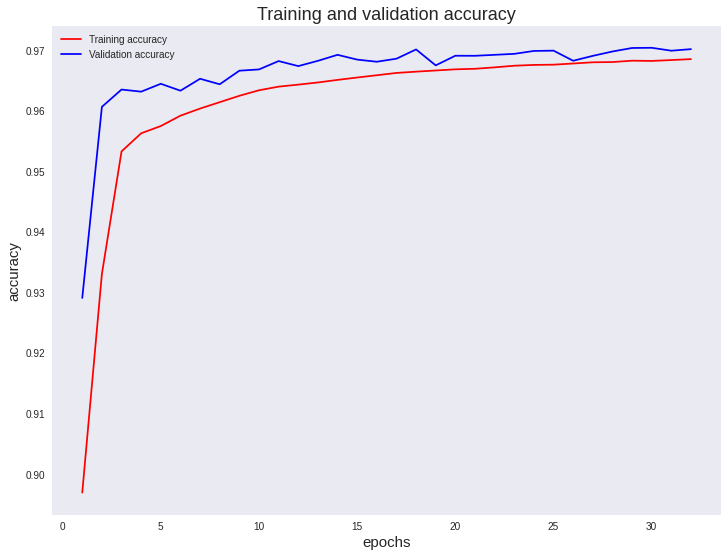

In [ ]:
  
#plotting validation and train accuracies and losses
accuracy = model.history.history['acc']
val_accuracy = model.history.history['val_acc']

loss = model.history.history['loss']
val_loss = model.history.history['val_loss']

epochs = range(1, len(accuracy) + 1)

plt.figure(figsize=(12,9))
plt.plot(epochs, accuracy, "r-", label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label="Validation accuracy")
plt.title('Training and validation accuracy', fontsize=18)
plt.xlabel("epochs", size=15)
plt.ylabel("accuracy", size=15)
plt.grid(False)
plt.legend()
plt.show()

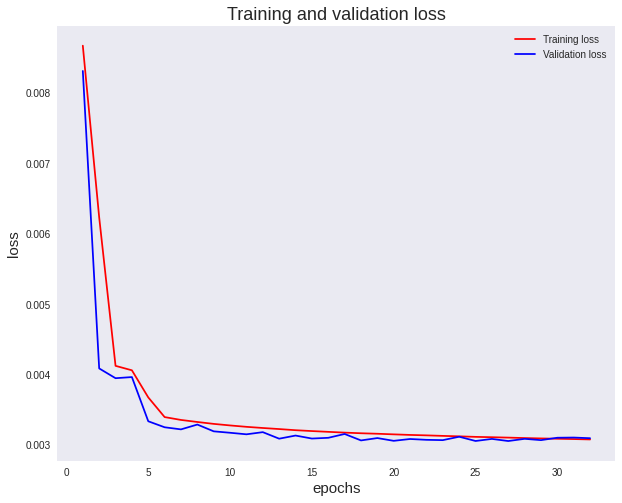

In [ ]:
plt.figure(figsize=(10,8))
plt.plot(epochs, loss, "r-", label='Training loss')
plt.plot(epochs, val_loss, 'b', label="Validation loss")
plt.title('Training and validation loss', fontsize=18)
plt.xlabel("epochs", size=15)
plt.ylabel("loss", size=15)
plt.grid(False)
plt.legend()
plt.show()

In [ ]:
# pred_df.columns

Index(['north_bnd Predictions', 'north_bnd Actuals',
       'north_bnd left Predictions', 'north_bnd left Actuals'],
      dtype='object')

In [ ]:
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(pred_df['north_bnd Predictions'], pred_df['north_bnd Actuals'])
sns.heatmap(conf_mat, square=True, annot=True, cmap='Blues', fmt='d', cbar=False)

In [ ]:
"""
'West bound thru_x', 'West bound left_x', 'North bound thru_x',
       'North bound left_x', 'East bound thru_x', 'East bound left_x',
       'South bound thru_x', 'South bound left_x'  -> predicting on the attack data
"""

def plot_predictions2(model, X, y, start=0, end=4970):  
  predictions = model.predict(X)  
  north_bound_preds, north_bndleft_preds = predictions[:, 2], predictions[:, 3]
  north_bound_actuals, north_bndleft_actuals = y[:, 2], y[:, 3]
  df = pd.DataFrame(data={'north_bnd Predictions': north_bound_preds,
                          'north_bnd Actuals':north_bound_actuals,
                          'north_bnd left Predictions': north_bndleft_preds,
                          'north_bnd left Actuals': north_bndleft_actuals
                          })
  plt.figure(figsize=(20,14))
  # plt.plot(df['north_bnd Predictions'][start:end], label='north predictions')
  # plt.plot(df['north_bnd Actuals'][start:end], label='north Actuals')
  plt.plot(df['north_bnd left Predictions'][start:end],  color='r', label='north left predictions')
  plt.plot(df['north_bnd left Actuals'][start:end], label='north left Actuals')
  plt.legend()
  
  return df[start:end]

In [ ]:
pred_free_df = plot_predictions2(train_testSplit_model__2, x_test, y_test)

In [ ]:
pred_df

,north_bnd Predictions,north_bnd Actuals,north_bnd left Predictions,north_bnd left Actuals
0,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...
4965,0.365483,0.365617,0.012067,0.008028
4966,0.362604,0.396186,0.009272,0.008028
4967,0.392100,0.371028,0.009514,0.008028
4968,0.370543,0.372617,0.009543,0.008028


In [ ]:
def plot_predictions(model, X, y, start=0, end=4970):
  predictions = model.predict(X)
  predictions_inverse = scaler.inverse_transform(predictions)
  actuals_y = scaler.inverse_transform(y)
 

  'East bound thru_x', 'East bound left_x',
  'South bound thru_x', 'South bound left_x'
  south_bound_preds,south_bound_left_preds = predictions_inverse[:, 6], predictions_inverse[:, 7]
  south_bound_actuals, south_bndleft_actuals = actuals_y[:, 6], actuals_y[:, 7]
  df = pd.DataFrame(data={'south_bound Predictions': south_bound_preds,
                            'south_bnd Actuals':south_bound_actuals,
                            'south_bound_left Predictions':south_bound_left_preds,
                            'south_bnd left Actuals': south_bndleft_actuals
                            })
  plt.figure(figsize=(20,10))
  plt.plot(df['south_bound Predictions'][start:end],  color="m" ,label='south bound through predictions')
  plt.plot(df['south_bnd Actuals'][start:end], "bo", label='south bound through Actuals')
  # plt.plot(df['south_bound_left Predictions'][start:end], label='south bound left predictions')
  # plt.plot(df['south_bnd left Actuals'][start:end], label='south bound left Actuals')
  plt.title("South bound through Actuals Vs South bound through predictions", fontsize=14)

  plt.legend()
  
  return df[start:end]


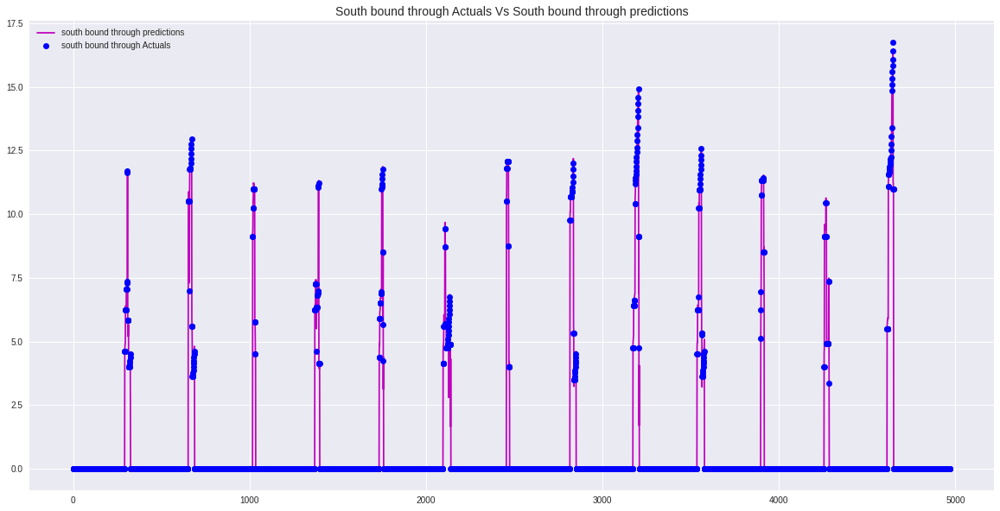

In [ ]:

pred_data = plot_predictions(train_testSplit_model__2, x_test, y_test)


In [ ]:
pred_data['south_bnd Actuals'].sample(30)

2171     0.00
1568     0.00
4214     0.00
4254     0.00
1201     0.00
2862     0.00
4636    12.75
2116     4.75
3680     0.00
175      0.00
1324     0.00
3224     0.00
2608     0.00
2023     0.00
468      0.00
4656     0.00
4326     0.00
1142     0.00
449      0.00
3813     0.00
1422     0.00
4879     0.00
936      0.00
4368     0.00
1924     0.00
397      0.00
4077     0.00
1622     0.00
1542     0.00
4829     0.00
Name: south_bnd Actuals, dtype: float64

In [ ]:
def plot_predictions(model, X, y, start=0, end=1500):  
  predictions = model.predict(X)  
  predictions_inverse = scaler.inverse_transform(predictions)
  actuals_y = scaler.inverse_transform(y)

  #north
  north_bound_preds, north_bndleft_preds = predictions_inverse[:, 2], predictions_inverse[:, 3]
  north_bound_actuals, north_bndleft_actuals = actuals_y[:, 2], actuals_y[:, 3]
  #west
  west_bound_preds, west_bndleft_preds = predictions_inverse[:, 0], predictions_inverse[:, 1]
  west_bound_actuals, west_bndleft_actuals = actuals_y[:, 0], actuals_y[:, 1]
  #east
  east_bound_preds,east_bndleft_preds = predictions_inverse[:, 4], predictions_inverse[:, 5]
  east_bound_actuals,east_bndleft_actuals = actuals_y[:, 4], actuals_y[:, 5]
  #south
  south_bound_preds, south_bndleft_preds = predictions_inverse[:, 6], predictions_inverse[:, 7]
  south_bound_actuals, south_bndleft_actuals = actuals_y[:, 6], actuals_y[:, 7]

  df = pd.DataFrame(data={'north_bnd Predictions': north_bound_preds,
                          'north_bnd Actuals':north_bound_actuals,
                          'north_bnd left Predictions': north_bndleft_preds,
                          'north_bnd left Actuals': north_bndleft_actuals,
                          #west
                          'west_bnd Predictions': west_bound_preds,
                          'west_bnd Actuals':west_bound_actuals,
                          'west_bnd left Predictions': west_bndleft_preds,
                          'west_bnd left Actuals': west_bndleft_actuals,
                          #east
                          'east_bnd Predictions': east_bound_preds,
                          'east_bnd Actuals':east_bound_actuals,
                          'east_bnd left Predictions': east_bndleft_preds,
                          'east_bnd left Actuals': east_bndleft_actuals,
                          #south
                          'south_bnd Predictions': south_bound_preds,
                          'south_bnd Actuals':south_bound_actuals,
                          'south_bnd left Predictions': south_bndleft_preds,
                          'south_bnd left Actuals': south_bndleft_actuals
                          })
   
  return df[start:end]

In [ ]:
free_pred = plot_predictions(train_testSplit_model__2, x_test, y_test)

In [ ]:
free_pred

,north_bnd Predictions,north_bnd Actuals,north_bnd left Predictions,north_bnd left Actuals,west_bnd Predictions,west_bnd Actuals,west_bnd left Predictions,west_bnd left Actuals,east_bnd Predictions,east_bnd Actuals,east_bnd left Predictions,east_bnd left Actuals,south_bnd Predictions,south_bnd Actuals,south_bnd left Predictions,south_bnd left Actuals
0,0.0,0.0,0.0,0.0,8.075287,8.250000,17.887089,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,8.260655,8.416667,17.794785,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,8.375861,8.583333,18.078300,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,8.485636,8.750000,18.206690,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,7.646821,6.750000,18.596241,18.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1496,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1497,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1498,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
free_pred.columns

Index(['north_bnd Predictions', 'north_bnd Actuals',
       'north_bnd left Predictions', 'north_bnd left Actuals',
       'west_bnd Predictions', 'west_bnd Actuals', 'west_bnd left Predictions',
       'west_bnd left Actuals', 'east_bnd Predictions', 'east_bnd Actuals',
       'east_bnd left Predictions', 'east_bnd left Actuals',
       'south_bnd Predictions', 'south_bnd Actuals',
       'south_bnd left Predictions', 'south_bnd left Actuals'],
      dtype='object')

In [ ]:
# absolute error value
north_bnd = np.max(np.abs(free_pred["north_bnd Predictions"] - free_pred['north_bnd Actuals']))
north_bnd

8943.006341530036

In [ ]:
def pred_plots(df, name):
  plt.figure(figsize=(15,8))
  plt.plot(df['{} Predictions'.format(name)], "bo", label='{} predictions'.format(name))
  plt.plot(df['{} Actuals'.format(name)], color="g", label='{} Actuals'.format(name))
  plt.title('{} prediction Vs Actual Values'.format(name), fontsize=16)
  plt.xlabel("Number of values forecast", size=15)
  plt.ylabel("{} (minutes)".format(name), size=15)
  plt.grid(False)
  plt.legend()
  return plt.show()

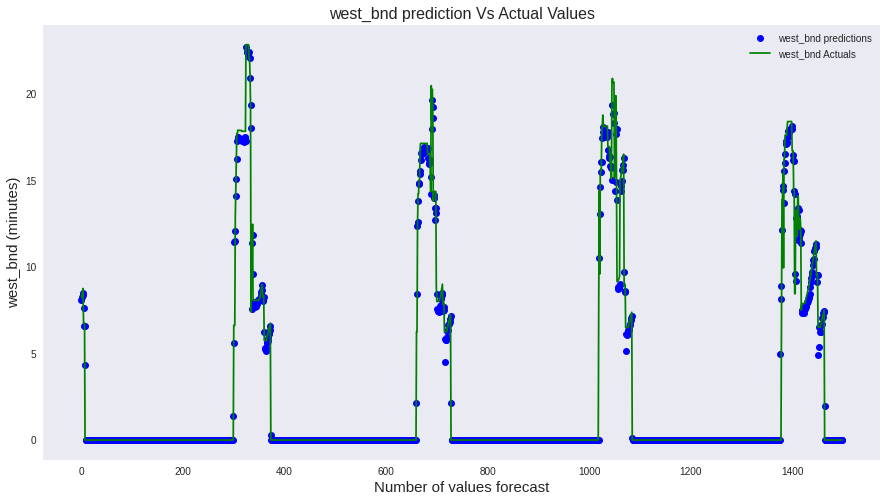

In [ ]:
pred_plots(free_pred, 'west_bnd')



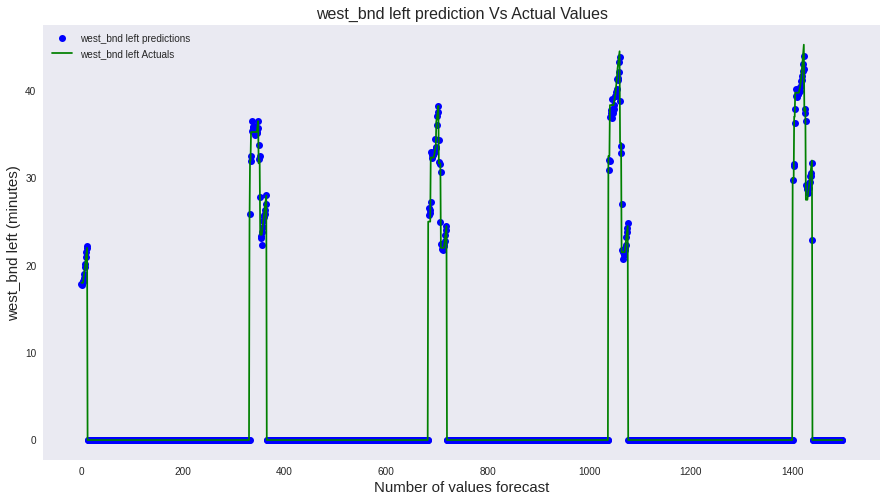

In [ ]:
pred_plots(free_pred, 'west_bnd left')


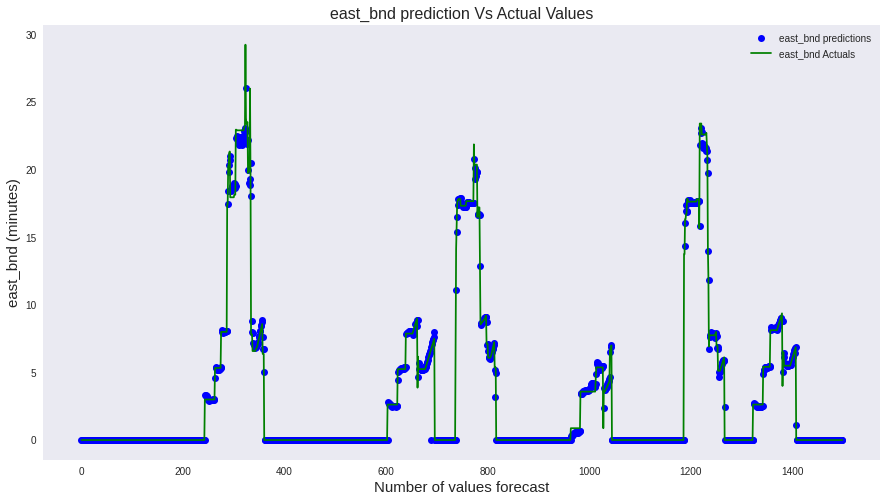

In [ ]:
pred_plots(free_pred, 'east_bnd')


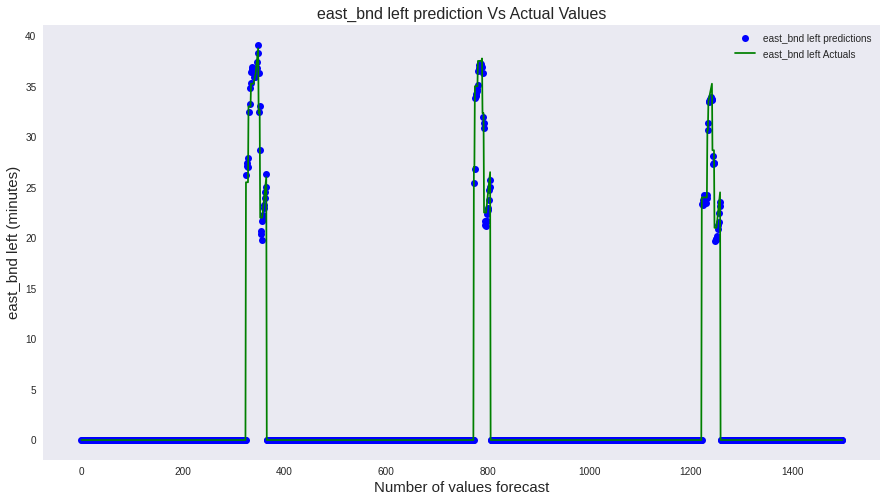

In [ ]:
pred_plots(free_pred, 'east_bnd left')


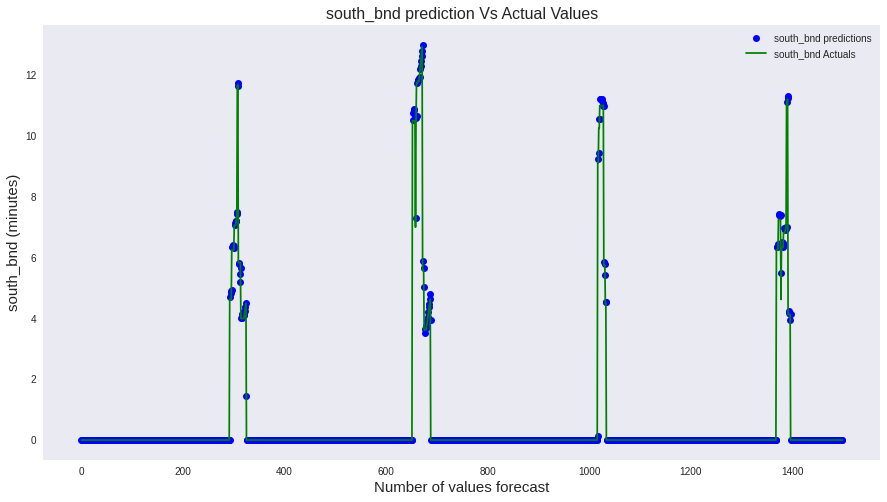

In [ ]:
pred_plots(free_pred, 'south_bnd')


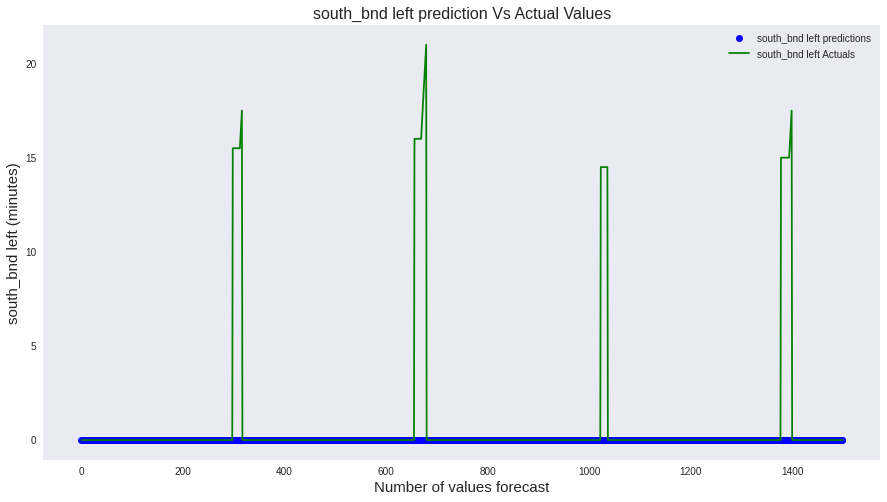

In [ ]:
pred_plots(free_pred, 'south_bnd left')



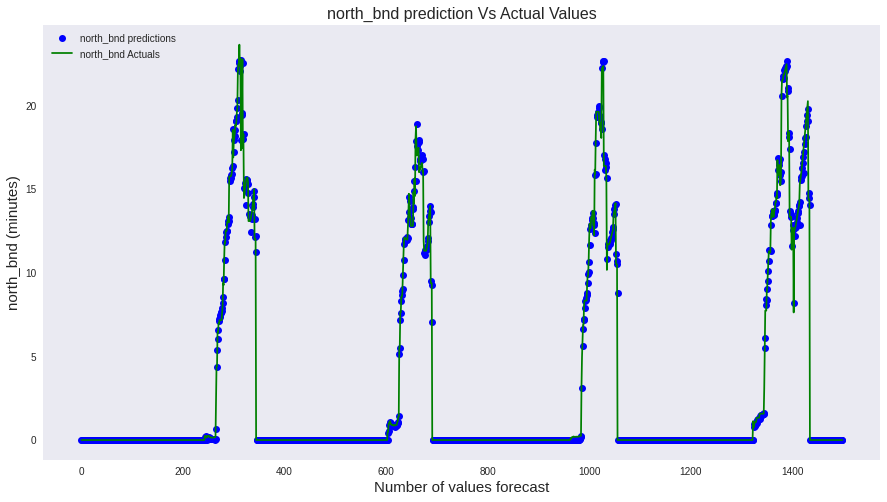

In [ ]:
pred_plots(free_pred, 'north_bnd')


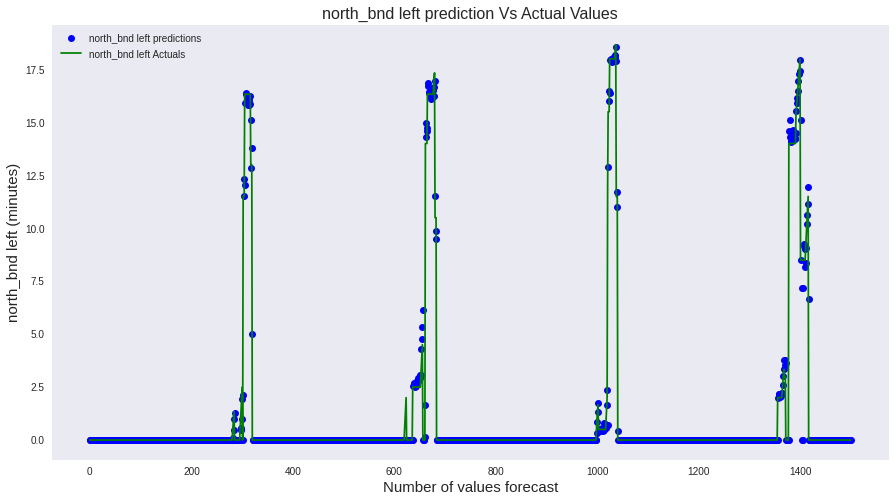

In [ ]:
pred_plots(free_pred, 'north_bnd left')

In [ ]:
plt.figure(figsize=(18,10))
# MAE for the West values only
southMAE = np.mean(np.abs(pred_data['south_bound Predictions'] - pred_data['south_bnd Actuals']))
plt.hist(southMAE, bins=40)
plt.show()

In [ ]:
southMAE.max()

0.06761517092335713

In [ ]:
check_anom = pred_data
# check_anom['testMAE'] = 0.0
check_anom['southMAE'] = southMAE
check_anom['max_MAE'] = max_MAE
check_anom['anom_value'] = check_anom['southMAE'] >= check_anom['max_MAE']
check_anom

In [ ]:
anomalies = check_anom.loc[check_anom['anom_value'] == True]
anomalies


In [ ]:
check_anom.iloc[:, 1]

In [ ]:

dt = attack_free_ds.values

last_145time = dt[train_size-window_len:, 0]
len(last_145time)



In [ ]:
#now last 131 considering window_len
last_131time = last_145time[window_len:]
len(last_131time)

In [ ]:
anomalies['time'] = last_131time
anomalies

In [ ]:
# anomalies['time']=anomalies['time'].dt.date
# anomalies.set_index('time')

In [ ]:
plt.rcParams["figure.figsize"] = [14, 8]
plt.rcParams["figure.autolayout"] = True
fig, ax1 = plt.subplots()
ax1 = sns.lineplot(x=check_anom.index, y=check_anom.iloc[:, 1])

ax2 = ax1.twinx()
ax2 = sns.scatterplot(x=anomalies.index, y=anomalies.iloc[:, 1], color='magenta')

plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
plt.rcParams["figure.figsize"] = [14, 8]
plt.rcParams["figure.autolayout"] = True
fig, ax1 = plt.subplots()
# ax1 = sns.lineplot(x=check_anom.index, y=check_anom.iloc[:, 1])
ax1 = sns.lineplot(x=df_downsample['time'], y=df_downsample['West bound thru_x'])

ax2 = ax1.twinx()
ax2 = sns.scatterplot(x=anomalies['time'], y=anomalies.iloc[:, 1], color='magenta')

plt.tight_layout()
plt.legend()
plt.show()

### Model predictions

In [ ]:


# lets predict with the model 
train_predict = model.predict(x_train)
test_predict = model.predict(x_test)

#invert predictions
train_predict = scaler.inverse_transform(train_predict)
y_train = scaler.inverse_transform([y_train])

test_predict = scaler.inverse_transform(test_predict)
y_test = scaler.inverse_transform([y_test])

In [ ]:
y_test[0]

In [ ]:
test_predict[:,0]

In [ ]:
def plotTwoCurves(x1,x2,y1,y2,xlable,ylabel,clabel1,clabel2):
    fig, ax = plt.subplots(figsize=(16, 14))
    fig.subplots_adjust(bottom=0.15, left=0.2)
    ax.plot(x1,y1,color='blue',label=clabel1)
    ax.plot(x2,y2,color='red',label=clabel2)
    ax.set_xlabel(xlable)
    ax.set_ylabel(ylabel)
    plt.legend()
    plt.show()

In [ ]:
mod_plot = range(0,len(model.history['loss']))
plotTwoCurves(mod_plot,mod_plot,model.history['loss'],model.history['val_loss'],'Epochs','Loss','Loss Series','Val_loss Series')

In [ ]:
val = {'West bound values': y_test[0],
       'predicted values': test_predict[:, 0]    
}

In [ ]:
pred_final = pd.DataFrame(val)
pred_final

In [ ]:
plt.figure(figsize=(16, 10))
plt.plot(pred_final['West bound values'], label='real values')
plt.plot(pred_final['predicted values'], label='predicted values')

plt.xlabel('forecast of 131 values', fontsize=14)
plt.ylabel("Value counts (real and predicted values)", fontsize=14)
plt.title('Real Vs Predicted \n West bound values', fontsize=16 )
plt.legend()

plt.show()

In [ ]:
x_train_ticks = west_df.head(train_size)['t']
y_train = west_df.head(train_size)['y']
x_test_ticks = west_df.tail(test_size)['t']

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(7)
f.set_figwidth(18)

sns.lineplot(x=x_train_ticks, y=y_train, ax=ax, label='Train Set') #navajowhite
sns.lineplot(x=x_test_ticks, y=test_predict[:,0], ax=ax, color='green', label='Prediction') #navajowhite
sns.lineplot(x=x_test_ticks, y=y_test[0], ax=ax, color='orange', label='Ground truth') #navajowhite

ax.set_title('Prediction Values for accumulated West bound thru', fontsize=16)
ax.set_xlabel(xlabel='time', fontsize=14)
ax.set_ylabel(ylabel='West bound thru_acc', fontsize=14)

plt.show()

### RL Attack predictions

In [ ]:
all_dfs.columns[1:9]


Index(['West bound thru_accTime', 'West bound left_accTime',
       'North bound thru_accTime', 'North bound left_accTime',
       'East bound thru_accTime', 'East bound left_accTime',
       'South bound thru_accTime', 'South bound left_accTime'],
      dtype='object')

In [ ]:
train_size = int(0.10 * len(all_dfs))
test_size = len(all_dfs) - train_size

accTime_df = all_dfs[['time', 'West bound thru_accTime', 'West bound left_accTime',
       'North bound thru_accTime', 'North bound left_accTime',
       'East bound thru_accTime', 'East bound left_accTime',
       'South bound thru_accTime', 'South bound left_accTime'
     ]].copy()



train = accTime_df.iloc[:train_size, :]

x_train, y_train = pd.DataFrame(accTime_df.iloc[:train_size, 0]), pd.DataFrame(accTime_df.iloc[:train_size, 1])
x_valid, y_valid = pd.DataFrame(accTime_df.iloc[train_size:, 0]), pd.DataFrame(accTime_df.iloc[train_size:, 1])

print(len(train), len(x_valid))


2599 23400


In [ ]:
train.head()

,time,West bound thru_accTime,West bound left_accTime,North bound thru_accTime,North bound left_accTime,East bound thru_accTime,East bound left_accTime,South bound thru_accTime,South bound left_accTime
0,601.0,58.0,98.4,23.5,148.666667,85.598214,92.8,23.875,123.5
1,603.0,59.0,100.4,24.0,150.666667,86.598214,94.8,24.375,125.5
2,605.0,60.0,102.4,24.5,152.666667,87.598214,96.8,24.875,127.5
3,607.0,61.0,104.4,25.0,154.666667,88.598214,98.8,25.375,129.5
4,609.0,62.0,106.4,25.5,156.666667,89.598214,84.0,25.875,131.5


In [ ]:
x_valid.head()

,time
2599,5799.0
2600,5801.0
2601,5803.0
2602,5805.0
2603,5807.0


In [ ]:
accTime_df

,time,West bound thru_accTime,West bound left_accTime,North bound thru_accTime,North bound left_accTime,East bound thru_accTime,East bound left_accTime,South bound thru_accTime,South bound left_accTime
0,601.0,58.0000,98.400000,23.500000,148.666667,85.598214,92.8,23.875000,123.5
1,603.0,59.0000,100.400000,24.000000,150.666667,86.598214,94.8,24.375000,125.5
2,605.0,60.0000,102.400000,24.500000,152.666667,87.598214,96.8,24.875000,127.5
3,607.0,61.0000,104.400000,25.000000,154.666667,88.598214,98.8,25.375000,129.5
4,609.0,62.0000,106.400000,25.500000,156.666667,89.598214,84.0,25.875000,131.5
...,...,...,...,...,...,...,...,...,...
25994,52589.0,113.0625,97.153846,102.822038,49.928571,65.967803,127.4,93.527185,46.0
25995,52591.0,114.0625,98.692308,100.439685,51.928571,66.967803,129.4,92.497378,48.0
25996,52593.0,115.0625,100.230769,99.454390,53.928571,67.967803,131.4,90.071993,50.0
25997,52595.0,116.0625,110.250000,95.694587,55.928571,68.967803,133.4,86.252570,52.0


In [ ]:
from sklearn.preprocessing import MinMaxScaler

data = accTime_df.filter(['West bound thru_accTime', 'West bound left_accTime',
       'North bound thru_accTime', 'North bound left_accTime',
       'East bound thru_accTime', 'East bound left_accTime',
       'South bound thru_accTime', 'South bound left_accTime'
       ])  #remain with y values


#convert the dataframe to a numpy array
dataset = data.values

scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)

scaled_data[:10]

array([[0.37323037, 0.3307563 , 0.02805183, 0.49555556, 0.43982276,
        0.31210762, 0.04275731, 0.41166667],
       [0.37966538, 0.33747899, 0.02864868, 0.50222222, 0.44496099,
        0.31883408, 0.04375019, 0.41833333],
       [0.38610039, 0.34420168, 0.02924553, 0.50888889, 0.45009921,
        0.32556054, 0.04474306, 0.425     ],
       [0.39253539, 0.35092437, 0.02984238, 0.51555556, 0.45523743,
        0.332287  , 0.04573594, 0.43166667],
       [0.3989704 , 0.35764706, 0.03043922, 0.52222222, 0.46037566,
        0.28251121, 0.04672882, 0.43833333],
       [0.40540541, 0.36436975, 0.03103607, 0.52888889, 0.46551388,
        0.24695708, 0.04772169, 0.445     ],
       [0.41184041, 0.3092437 , 0.03163292, 0.53555556, 0.4706521 ,
        0.25176169, 0.04871457, 0.45166667],
       [0.41827542, 0.31484594, 0.03222977, 0.54222222, 0.47579033,
        0.2565663 , 0.04970745, 0.45833333],
       [0.42471042, 0.32044818, 0.03282661, 0.54888889, 0.48092855,
        0.26137092, 0.050700

In [ ]:
scaled_data.shape

(25999, 8)

In [ ]:

# Defines the rolling window
window_len = 14

#split into train and test sets
                       #train values                  test values
train, test = scaled_data[:train_size-window_len, :], scaled_data[train_size-window_len:, :]


def create_dataset(df, window_size=7):
  df_as_np = df
  X = []
  y = []
  for i in range(len(df_as_np)-window_size):
    row = [r for r in df_as_np[i:i+window_size]]
    # print(row)
    X.append(row)
    label = df_as_np[i+window_size][0:9]          #, df_as_np[i+window_size][1]]
    # print(label)
    y.append(label)
  return np.array(X), np.array(y)


x_train, y_train = create_dataset(train, window_len)
x_test, y_test = create_dataset(test, window_len)

#reshape input to be [samples, time steps, features]
x_train = np.reshape(x_train, (x_train.shape[0], 8, x_train.shape[1]))
x_test = np.reshape(x_test, (x_test.shape[0], 8, x_test.shape[1]))

print(len(x_train), len(x_test))




2571 23400


In [ ]:
x_train.shape

(2571, 8, 14)

In [ ]:
x_test.shape

(23400, 8, 14)

In [ ]:
"""
         0                            1                    2        
'West bound thru_accTime', 'West bound left_accTime',
       'North bound thru_accTime', 'North bound left_accTime',
       'East bound thru_accTime', 'East bound left_accTime',
       'South bound thru_accTime', 'South bound left_accTime'  -> predicting on the attack data
"""

# Now predicting on the X values
def plot_predictions2(model, X, y, start=0, end=23400):  
  predictions = model.predict(X) 
  predictions = scaler.inverse_transform(predictions)    #inverse of the pred values
  y = scaler.inverse_transform(y)                        #inverse of the true values

#finding the inverse of the scaling
  # predictions_inverse = scaler.inverse_transform(predictions)
  # actuals_y = scaler.inverse_transform(y)

  #north
  north_bound_preds, north_bndleft_preds = predictions[:, 2], predictions[:, 3]
  north_bound_actuals, north_bndleft_actuals = y[:, 2], y[:, 3]
  #west
  west_bound_preds, west_bndleft_preds = predictions[:, 0], predictions[:, 1]
  west_bound_actuals, west_bndleft_actuals = y[:, 0], y[:, 1]
  #east
  east_bound_preds,east_bndleft_preds = predictions[:, 4], predictions[:, 5]
  east_bound_actuals,east_bndleft_actuals =y[:, 4],y[:, 5]
  #south
  south_bound_preds, south_bndleft_preds = predictions[:, 6], predictions[:, 7]
  south_bound_actuals, south_bndleft_actuals =y[:, 6],y[:, 7]

  df = pd.DataFrame(data={'north_bnd Predictions': north_bound_preds,
                          'north_bnd Actuals':north_bound_actuals,
                          'north_bnd left Predictions': north_bndleft_preds,
                          'north_bnd left Actuals': north_bndleft_actuals,
                          #west
                          'west_bnd Predictions': west_bound_preds,
                          'west_bnd Actuals':west_bound_actuals,
                          'west_bnd left Predictions': west_bndleft_preds,
                          'west_bnd left Actuals': west_bndleft_actuals,
                          #east
                          'east_bnd Predictions': east_bound_preds,
                          'east_bnd Actuals':east_bound_actuals,
                          'east_bnd left Predictions': east_bndleft_preds,
                          'east_bnd left Actuals': east_bndleft_actuals,
                          #south
                          'south_bnd Predictions': south_bound_preds,
                          'south_bnd Actuals':south_bound_actuals,
                          'south_bnd left Predictions': south_bndleft_preds,
                          'south_bnd left Actuals': south_bndleft_actuals
                          })
   
  return df[start:end]

In [ ]:
pred_df = plot_predictions2(train_testSplit_model, x_test, y_test)

732/732 [==============================] - 8s 9ms/step


In [ ]:
pred_df.head(15)

,north_bnd Predictions,north_bnd Actuals,north_bnd left Predictions,north_bnd left Actuals,west_bnd Predictions,west_bnd Actuals,west_bnd left Predictions,west_bnd left Actuals,east_bnd Predictions,east_bnd Actuals,east_bnd left Predictions,east_bnd left Actuals,south_bnd Predictions,south_bnd Actuals,south_bnd left Predictions,south_bnd left Actuals
0,184.981827,24.767175,20.611694,20.75,55.176823,112.250,58.288471,98.105263,31.361334,102.55,37.423447,101.000000,76.354477,26.703283,0.0,24.5
1,188.300797,26.513387,21.268652,22.75,55.266750,113.250,58.050415,100.105263,31.048538,103.55,37.514091,103.000000,79.411156,28.866162,0.0,26.5
2,189.692627,28.329404,21.905981,24.75,55.186001,99.875,58.068195,102.105263,30.876656,104.55,37.517101,105.000000,81.766556,30.775253,0.0,28.5
3,187.969986,30.238495,21.959805,26.75,51.651398,100.750,60.887306,104.105263,31.568361,105.55,38.707420,107.000000,76.040466,33.111616,0.0,30.5
4,181.232422,32.336439,23.561918,28.75,52.683712,101.625,60.806885,106.105263,34.034447,106.55,39.943535,109.000000,66.242889,35.061616,0.0,32.5
5,181.446716,34.312629,24.399738,30.75,52.630165,117.250,61.303371,108.105263,33.917179,107.55,40.100273,111.000000,66.818886,37.011616,0.0,34.5
6,179.746460,36.312629,26.456877,32.75,57.369526,118.250,60.064796,110.105263,35.496948,108.55,40.211391,113.000000,63.966812,38.961616,0.0,36.5
7,183.975235,38.312629,26.987234,34.75,56.979061,119.250,61.226250,112.105263,32.507027,109.55,39.276169,115.000000,78.160484,40.911616,0.0,38.5
8,190.574295,40.068041,26.046860,36.75,54.387962,120.250,61.694569,114.105263,28.658279,110.55,38.731186,117.000000,88.315346,42.861616,0.0,40.5
9,203.540771,42.045313,25.036686,38.75,51.436169,121.250,61.411339,116.105263,24.686159,111.55,37.300941,119.000000,96.265869,44.811616,0.0,42.5


In [ ]:
all_dfs['North bound left_accTime'][2599:23400]

2599     20.75
2600     22.75
2601     24.75
2602     26.75
2603     28.75
         ...  
23395    37.25
23396    39.25
23397    41.25
23398    43.25
23399    45.25
Name: North bound left_accTime, Length: 20801, dtype: float64

In [ ]:
def pred_plots2(df, name):
  plt.figure(figsize=(20,10))
  plt.plot(df['{} Predictions'.format(name)], label='{} predictions'.format(name))
  plt.plot(df['{} Actuals'.format(name)], label='{} Actuals'.format(name))
  plt.title('{} prediction Vs Actual Values'.format(name), fontsize=16)
  plt.xlabel("Number of values forecast", size=15)
  plt.ylabel("{} (minutes)".format(name), size=15)
  plt.grid(False)
  plt.legend()
  return plt.show()

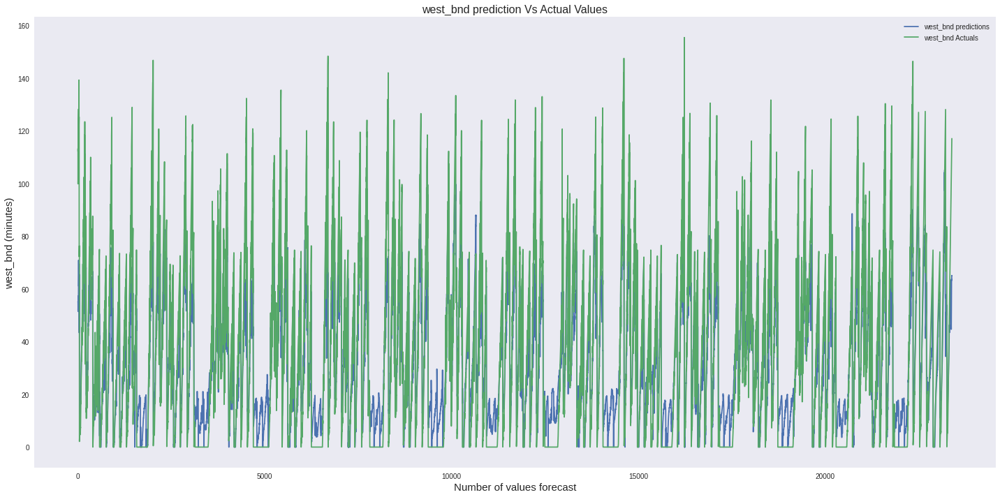

In [ ]:
pred_plots2(pred_df, 'west_bnd')

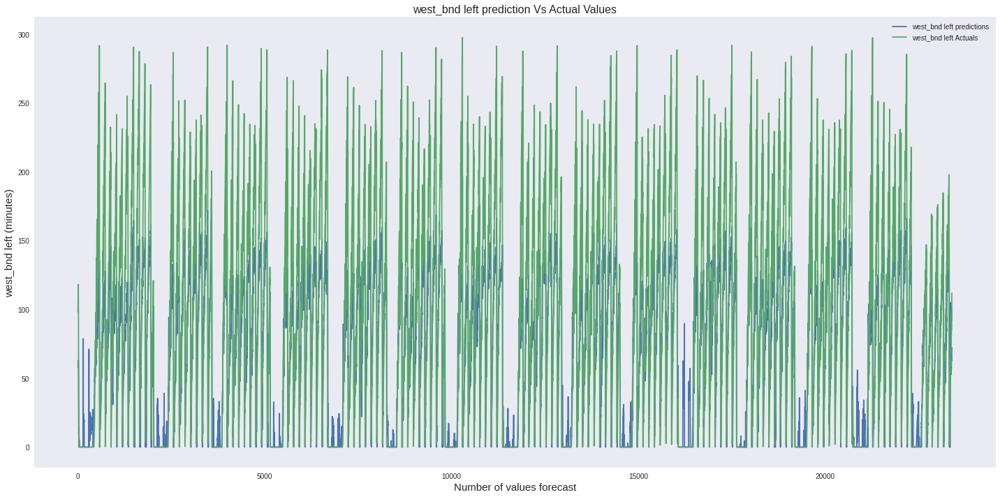

In [ ]:
pred_plots2(pred_df, 'west_bnd left')


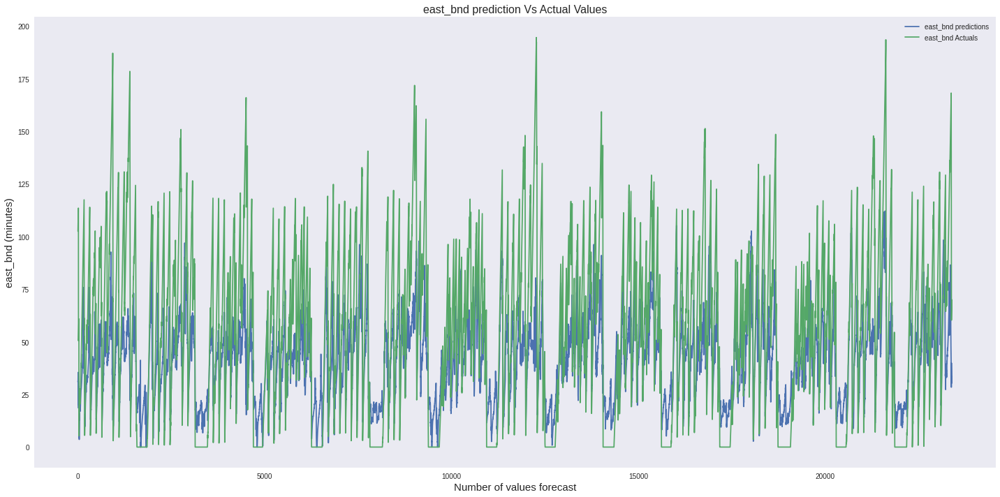

In [ ]:
pred_plots2(pred_df, 'east_bnd')


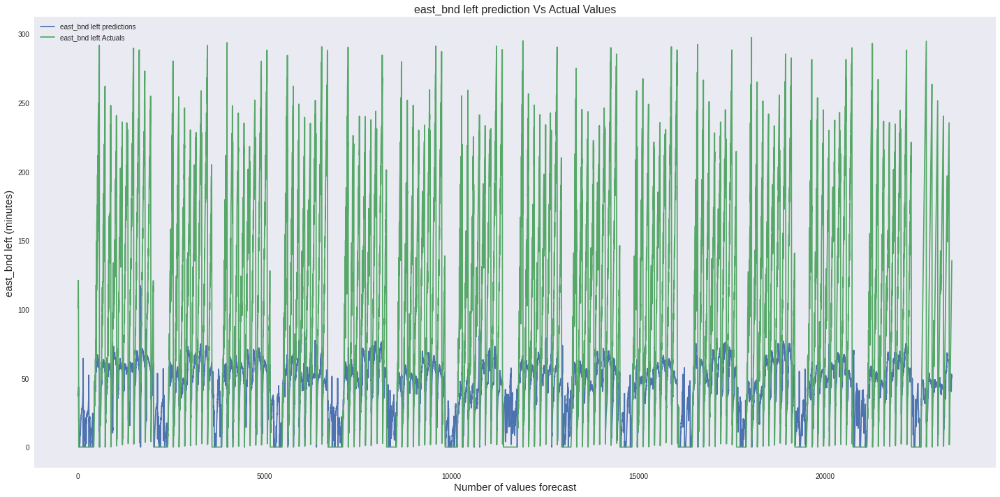

In [ ]:
pred_plots2(pred_df, 'east_bnd left')


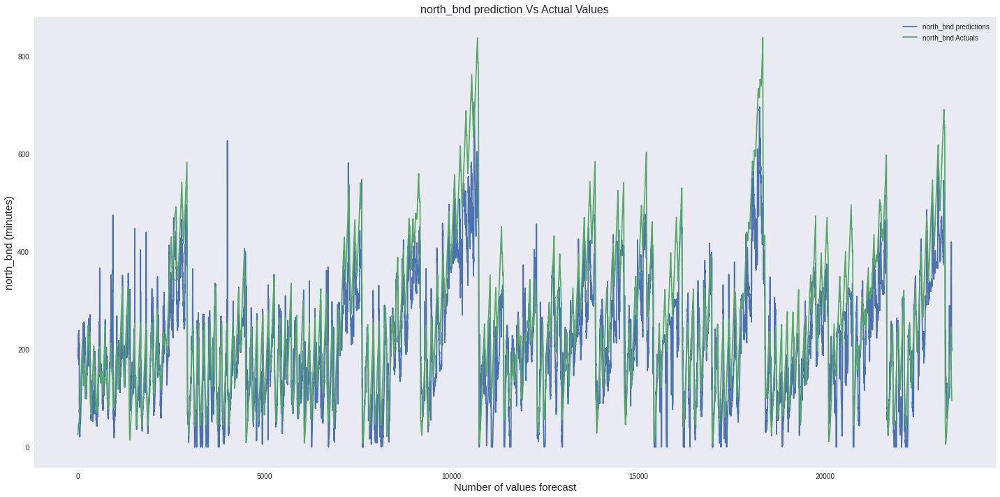

In [ ]:
pred_plots2(pred_df, 'north_bnd')


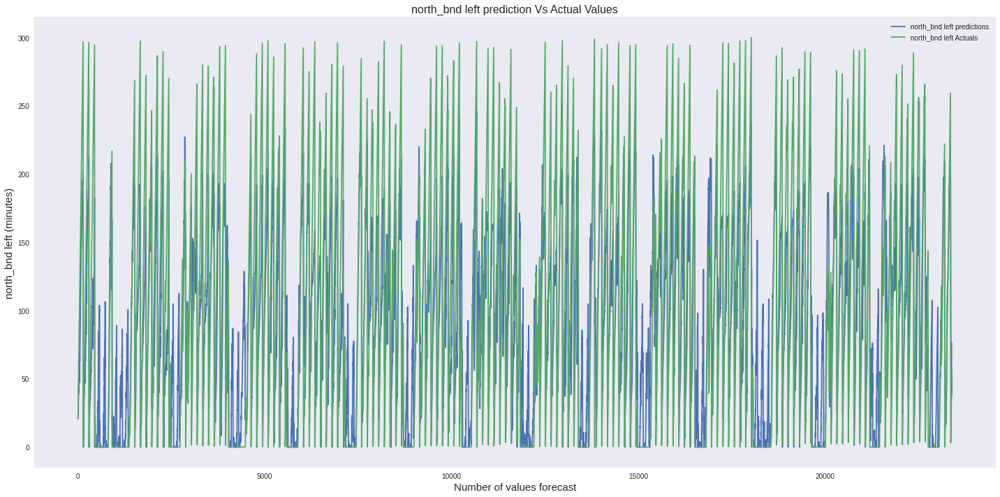

In [ ]:

pred_plots2(pred_df, 'north_bnd left')


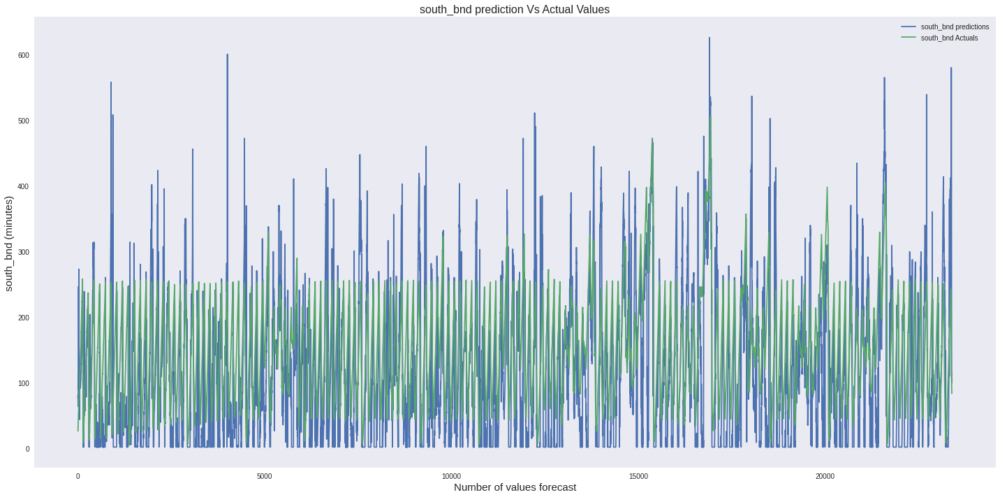

In [ ]:
pred_plots2(pred_df, 'south_bnd')


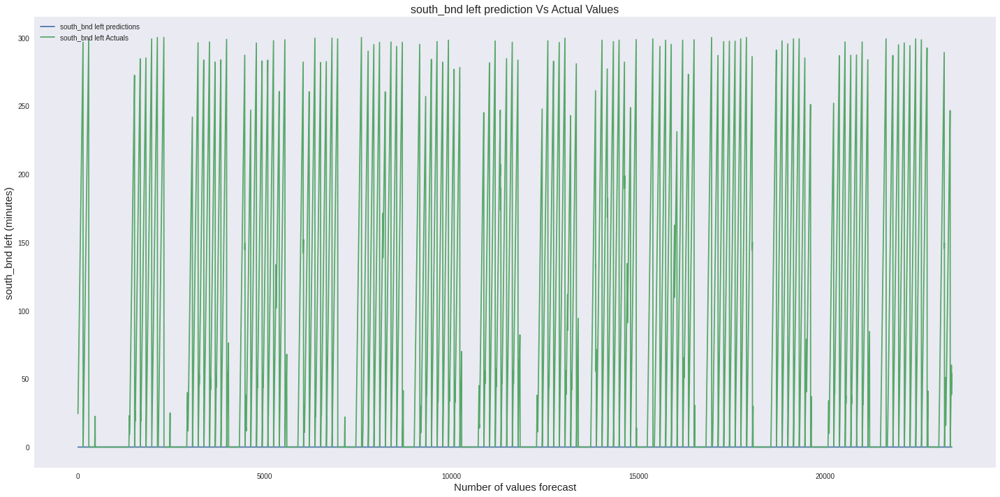

In [ ]:
pred_plots2(pred_df, 'south_bnd left')


In [ ]:
all_dfs['North bound thru_accTime'].tail(30)                          # 'South bound left_accTime'   'North bound thru_accTime'

25969    237.898829
25970    239.898829
25971    241.898829
25972    243.898829
25973    245.898829
25974    240.658217
25975    228.999126
25976    217.328671
25977    205.703671
25978    197.442308
25979    185.840035
25980    174.271853
25981    169.328671
25982    161.055944
25983    149.487762
25984    141.294580
25985    129.840035
25986    121.624126
25987    121.922640
25988    119.472028
25989    119.305086
25990    115.190750
25991    111.359335
25992    108.929241
25993    106.572038
25994    102.822038
25995    100.439685
25996     99.454390
25997     95.694587
25998     94.758312
Name: North bound thru_accTime, dtype: float64

#### Evaluation Metrics

In [ ]:
pred_df.head(1)

,north_bnd Predictions,north_bnd Actuals,north_bnd left Predictions,north_bnd left Actuals,west_bnd Predictions,west_bnd Actuals,west_bnd left Predictions,west_bnd left Actuals,east_bnd Predictions,east_bnd Actuals,east_bnd left Predictions,east_bnd left Actuals,south_bnd Predictions,south_bnd Actuals,south_bnd left Predictions,south_bnd left Actuals
0,184.981827,24.767175,20.611694,20.75,55.176823,112.25,58.288471,98.105263,31.361334,102.55,37.423447,101.0,76.354477,26.703283,0.0,24.5


In [ ]:
#prediction accuracy table and plots
# prediction accuracy table - change the indexing names

metrics_df = pd.DataFrame([np.mean(np.abs(pred_df['south_bnd Predictions'] - pred_df['south_bnd Actuals'])), np.mean(pred_df['south_bnd Actuals'] - pred_df['south_bnd Predictions']), np.max(pred_df['south_bnd Predictions'] - pred_df['south_bnd Actuals'])])
metrics_df['SB Left'] = pd.DataFrame([np.mean(np.abs(pred_df['south_bnd left Predictions'] - pred_df['south_bnd left Actuals'])), np.mean(pred_df['south_bnd left Actuals'] - pred_df['south_bnd left Predictions']), np.max(pred_df['south_bnd left Predictions'] - pred_df['south_bnd left Actuals'])])
metrics_df['WB Thru'] = pd.DataFrame([np.mean(np.abs(pred_df['west_bnd left Predictions'] - pred_df['west_bnd left Actuals'])), np.mean(pred_df['west_bnd left Actuals'] - pred_df['west_bnd left Predictions']), np.max(pred_df['west_bnd left Predictions'] - pred_df['west_bnd left Actuals'])])
metrics_df['WB Left'] = pd.DataFrame([np.mean(np.abs(pred_df['west_bnd Predictions'] - pred_df['west_bnd Actuals'])), np.mean(pred_df['west_bnd Actuals'] - pred_df['west_bnd Predictions' ]), np.mean(np.abs(pred_df['west_bnd Predictions'] - pred_df['west_bnd Actuals'])), np.max(pred_df['west_bnd Predictions'] - pred_df['west_bnd Actuals'])])
metrics_df['EB Thru'] = pd.DataFrame([np.mean(np.abs(pred_df['east_bnd Predictions'] - pred_df['east_bnd Actuals'])), np.mean(pred_df['east_bnd Actuals'] - pred_df['east_bnd Predictions']), np.mean(np.abs(pred_df['east_bnd Predictions'] - pred_df['east_bnd Actuals'])), np.max(pred_df['east_bnd Predictions'] - pred_df['east_bnd Actuals'])])
metrics_df['EB Left'] = pd.DataFrame([np.mean(np.abs(pred_df['east_bnd left Predictions'] - pred_df['east_bnd left Actuals'])), np.mean(pred_df['east_bnd left Actuals'] - pred_df['east_bnd left Predictions']), np.max(pred_df['east_bnd left Predictions'] - pred_df['east_bnd left Actuals'])])
metrics_df['NB Thru'] = pd.DataFrame([np.mean(np.abs(pred_df['north_bnd Predictions'] - pred_df['north_bnd Actuals'])), np.mean(pred_df['north_bnd Actuals'] - pred_df['north_bnd Predictions']), np.mean(np.abs(pred_df['north_bnd Predictions'] - pred_df['north_bnd Actuals'])), np.max(pred_df['north_bnd Predictions'] - pred_df['north_bnd Actuals'])])
metrics_df['NB Left'] = pd.DataFrame([np.mean(np.abs(pred_df['north_bnd left Predictions'] - pred_df['north_bnd left Actuals'])), np.mean(pred_df['north_bnd left Actuals'] - pred_df['north_bnd left Predictions']), np.max(pred_df['north_bnd left Predictions'] - pred_df['north_bnd left Actuals'])])



In [ ]:
metrics_df = metrics_df.rename(columns={0: "SB thru"})
metrics_df = metrics_df.rename(index={0: "Prediction Accuracy (MAE)",
                                      1: "Average Error (The simple average of the error)",
                                      2: "Maximum Error (highest difference observed between the actual value and predicted value)"})

In [ ]:
metrics_df.head()

,SB thru,SB Left,WB Thru,WB Left,EB Thru,EB Left,NB Thru,NB Left
Prediction Accuracy (MAE),62.669577,98.593081,28.214078,12.391872,22.737309,60.681267,62.599915,37.060412
Average Error (The simple average of the error),31.353297,98.593081,20.354731,3.690253,14.199470,49.443723,41.755033,9.766354
Maximum Error (highest difference observed between the actual value and predicted value),460.387912,0.000000,196.379288,12.391872,22.737309,82.689929,62.599915,234.067871


In [ ]:
metrics_df

,SB thru,SB Left,WB Thru,WB Left,EB Thru,EB Left,NB Thru,NB Left
Prediction Accuracy (MAE),62.669577,98.593081,28.214078,12.391872,22.737309,60.681267,62.599915,37.060412
Average Error (The simple average of the error),31.353297,98.593081,20.354731,3.690253,14.199470,49.443723,41.755033,9.766354
Maximum Error (highest difference observed between the actual value and predicted value),460.387912,0.000000,196.379288,12.391872,22.737309,82.689929,62.599915,234.067871


In [ ]:
pred_df.columns

Index(['north_bnd Predictions', 'north_bnd Actuals',
       'north_bnd left Predictions', 'north_bnd left Actuals',
       'west_bnd Predictions', 'west_bnd Actuals', 'west_bnd left Predictions',
       'west_bnd left Actuals', 'east_bnd Predictions', 'east_bnd Actuals',
       'east_bnd left Predictions', 'east_bnd left Actuals',
       'south_bnd Predictions', 'south_bnd Actuals',
       'south_bnd left Predictions', 'south_bnd left Actuals'],
      dtype='object')

In [ ]:
def abs_function(x):
  return abs(x[0] - x[1])

In [ ]:
pred_df.columns

Index(['north_bnd Predictions', 'north_bnd Actuals',
       'north_bnd left Predictions', 'north_bnd left Actuals',
       'west_bnd Predictions', 'west_bnd Actuals', 'west_bnd left Predictions',
       'west_bnd left Actuals', 'east_bnd Predictions', 'east_bnd Actuals',
       'east_bnd left Predictions', 'east_bnd left Actuals',
       'south_bnd Predictions', 'south_bnd Actuals',
       'south_bnd left Predictions', 'south_bnd left Actuals'],
      dtype='object')

In [ ]:
AE_df = pd.DataFrame(pred_df[['north_bnd Predictions', 'north_bnd Actuals']].apply(abs_function, axis=1))
AE_df["north_bnd left"] = pd.DataFrame(pred_df[['north_bnd left Predictions', 'north_bnd left Actuals']].apply(abs_function, axis=1))
AE_df["west_bnd"] = pd.DataFrame(pred_df[['west_bnd Predictions', 'west_bnd Actuals']].apply(abs_function, axis=1))
AE_df["west_bnd left"] = pd.DataFrame(pred_df[['west_bnd left Predictions', 'west_bnd left Actuals']].apply(abs_function, axis=1))
AE_df["east_bnd"] = pd.DataFrame(pred_df[['east_bnd Predictions', 'east_bnd Actuals']].apply(abs_function, axis=1))
AE_df["east_bnd left"] = pd.DataFrame(pred_df[['east_bnd left Predictions', 'east_bnd left Actuals']].apply(abs_function, axis=1))
AE_df["south_bnd"] = pd.DataFrame(pred_df[['south_bnd Predictions', 'south_bnd Actuals']].apply(abs_function, axis=1))
AE_df["south_bnd left"] = pd.DataFrame(pred_df[['south_bnd left Predictions', 'south_bnd left Actuals']].apply(abs_function, axis=1))


In [ ]:
AE_df = AE_df.rename(columns={0: "north bnd"})    #have our absolute values

In [ ]:
max_AE = 0.10

In [ ]:
AE_df['thresh_AE'] = max_AE

In [ ]:
AE_df['north bnd'].mean()

62.59991515564454

In [ ]:

AE_df[AE_df['north_bnd left'] > AE_df['north_bnd left'].mean()]

,north bnd,north_bnd left,west_bnd,west_bnd left,east_bnd,east_bnd left,south_bnd,south_bnd left,thresh_AE
34,160.147650,40.316689,29.400642,0.000000,9.263419,0.000000,5.019665,92.5,0.1
37,16.386934,38.572037,15.493126,0.000000,1.233390,0.000000,46.422627,98.5,0.1
38,20.929798,38.784523,14.095684,0.000000,1.793091,0.000000,28.550141,100.5,0.1
40,3.966171,49.245758,15.497160,0.000000,6.089412,0.000000,23.128124,104.5,0.1
41,6.958097,53.851807,12.844775,0.000000,7.185192,0.000000,24.528509,106.5,0.1
...,...,...,...,...,...,...,...,...,...
23375,119.365770,53.544020,43.606941,11.936877,113.335710,42.560160,142.697480,36.0,0.1
23376,132.528035,43.355574,45.356323,11.949620,115.689325,45.882548,166.371026,38.0,0.1
23377,138.914340,40.320082,45.795746,20.701157,115.714285,48.570036,160.943470,40.0,0.1
23387,227.112111,40.690707,52.917999,26.178090,38.395863,64.399004,373.257892,60.0,0.1


##### Bounds Plot

In [ ]:
#plotting using the threshold, we coud use 0.2
def AE_threshold_plot(AE, title, fin_data):
  plt.rcParams["figure.figsize"] = [14, 8]
  plt.rcParams["figure.autolayout"] = True

  plt.subplots()
  # fig, ax1 = plt.subplots()
  sns.lineplot(x=AE_df.index, y=AE_df[AE], label=title)
  # sns.scatterplot(x=anom[:, 0], y=anom[:, -1], color='magenta', ax=ax, label="anomalies")
  # ax2 = ax1.twinx()

  sns.scatterplot(x=AE_df.index, y=AE_df[fin_data], color='brown', label="PREDICTION ERROR THRESHOLD")


  plt.title('{} AND PREDICTION ERROR THRESHOLD'.format(title), fontsize=18)
  plt.xlabel("OBSERVATIONS", size=15)
  plt.ylabel("PREDICTION ERROR", size=15)
  plt.tight_layout()
  plt.legend()
  plt.grid(False)
  plt.show()


In [ ]:
pred_df.head()

,north_bnd Predictions,north_bnd Actuals,north_bnd left Predictions,north_bnd left Actuals,west_bnd Predictions,west_bnd Actuals,west_bnd left Predictions,west_bnd left Actuals,east_bnd Predictions,east_bnd Actuals,east_bnd left Predictions,east_bnd left Actuals,south_bnd Predictions,south_bnd Actuals,south_bnd left Predictions,south_bnd left Actuals
0,184.981827,24.767175,20.611694,20.75,55.176823,112.250,58.288471,98.105263,31.361334,102.55,37.423447,101.0,76.354477,26.703283,0.0,24.5
1,188.300797,26.513387,21.268652,22.75,55.266750,113.250,58.050415,100.105263,31.048538,103.55,37.514091,103.0,79.411156,28.866162,0.0,26.5
2,189.692627,28.329404,21.905981,24.75,55.186001,99.875,58.068195,102.105263,30.876656,104.55,37.517101,105.0,81.766556,30.775253,0.0,28.5
3,187.969986,30.238495,21.959805,26.75,51.651398,100.750,60.887306,104.105263,31.568361,105.55,38.707420,107.0,76.040466,33.111616,0.0,30.5
4,181.232422,32.336439,23.561918,28.75,52.683712,101.625,60.806885,106.105263,34.034447,106.55,39.943535,109.0,66.242889,35.061616,0.0,32.5


In [ ]:
AE_df.shape

(23400, 9)

In [ ]:
def thresh(bound, val):
  value = AE_df[bound].mean() + val

  return value

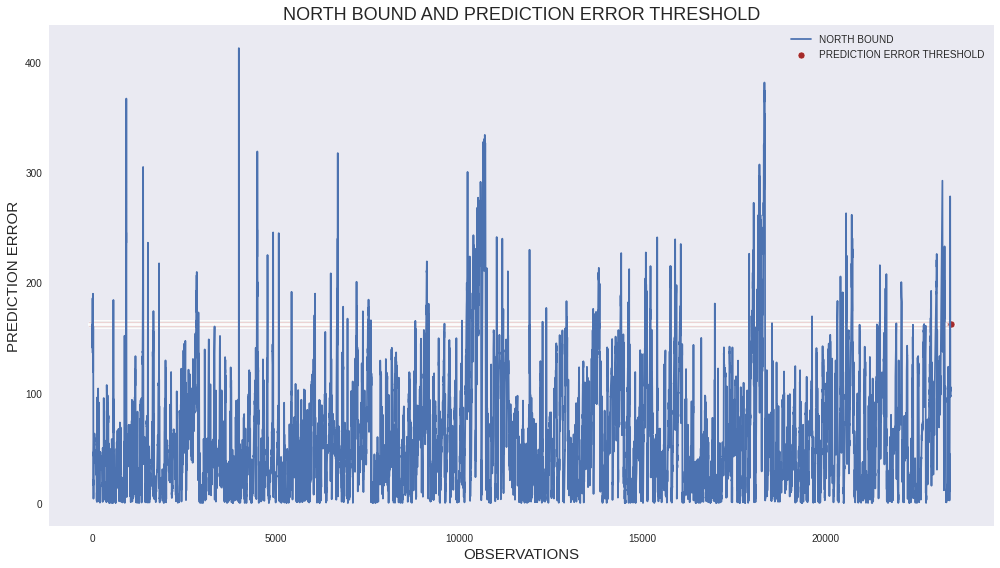

In [ ]:
AE_df['thresh_AE'] = thresh('north bnd', 100)
AE_threshold_plot('north bnd', "NORTH BOUND", 'thresh_AE')

In [ ]:

#create a dataframe for the same 
north_acc_df = AE_df[['north bnd', 'thresh_AE']]
north_acc_df['labels'] = north_acc_df['north bnd'] > north_acc_df['thresh_AE']

def thresh_label(row):
  if (row['labels'] != True): 
   
    val = 'Normal'
  else: 
    val = 'Anomaly'
  return val

#create a new column labels 
north_acc_df['labels'] =  north_acc_df.apply(lambda row: thresh_label(row), axis=1)



<ipython-input-191-aa7ba6ea59bd>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  north_acc_df['labels'] = north_acc_df['north bnd'] > north_acc_df['thresh_AE']
<ipython-input-191-aa7ba6ea59bd>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  north_acc_df['labels'] =  north_acc_df.apply(lambda row: thresh_label(row), axis=1)


In [ ]:
north_acc_df[north_acc_df['labels'] == "Anomaly"].nunique()

north bnd    1259
thresh_AE       1
labels          1
dtype: int64

In [ ]:
north_acc_df['north bnd'].mode()[0]

78.27837711069418

In [ ]:
north_acc_df[north_acc_df['north bnd'] > north_acc_df['north bnd'].mode()[0]] 

,north bnd,thresh_AE,labels
0,160.214652,162.599915,Normal
1,161.787410,162.599915,Normal
2,161.363223,162.599915,Normal
3,157.731491,162.599915,Normal
4,148.895983,162.599915,Normal
...,...,...,...
23395,101.262572,162.599915,Normal
23396,102.397321,162.599915,Normal
23397,102.103562,162.599915,Normal
23398,105.158441,162.599915,Normal


In [ ]:
northdf.columns

Index(['North bound thru_free', 'North bound thru_rl', 'labels'], dtype='object')

In [ ]:
# northdf[northdf['North bound thru_rl'] > northdf['North bound thru_rl'].mode()[0]]

In [ ]:
northdf[northdf['labels'] == "Anomaly"].nunique()

North bound thru_free     124
North bound thru_rl      2536
labels                      1
dtype: int64

In [ ]:
northdf.loc[:, ['labels']]

,labels
2599,Normal
2600,Normal
2601,Normal
2602,Normal
2603,Normal
...,...
25994,Normal
25995,Normal
25996,Normal
25997,Normal


In [ ]:

# confusion_matrix(y_test, predictions)
from sklearn.metrics import confusion_matrix, classification_report


print(classification_report(northdf.loc[:, ['labels']], north_acc_df['labels']))



              precision    recall  f1-score   support

     Anomaly       0.67      0.33      0.44      2538
      Normal       0.92      0.98      0.95     20862

    accuracy                           0.91     23400
   macro avg       0.79      0.66      0.70     23400
weighted avg       0.90      0.91      0.90     23400



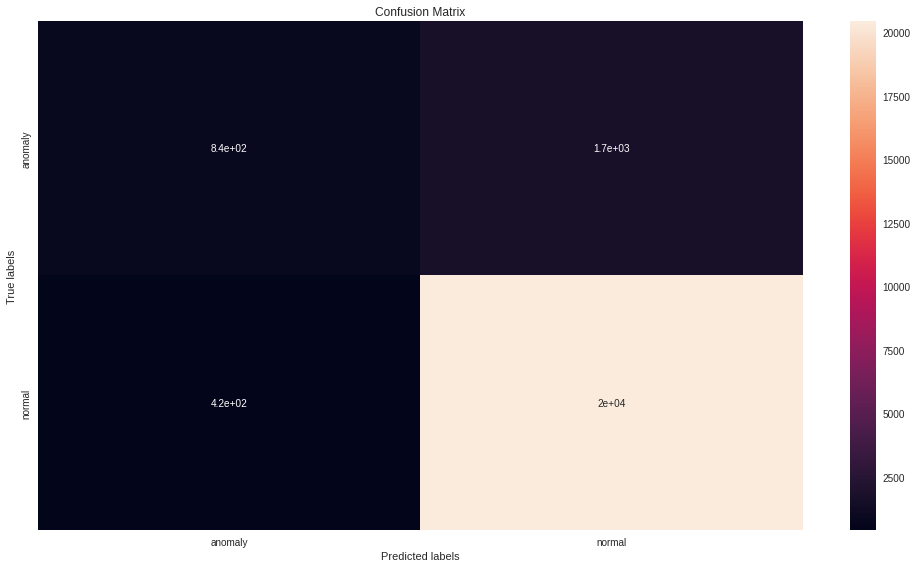

In [ ]:



ax= plt.subplot()


cm_nb = confusion_matrix(northdf.loc[:, ['labels']], north_acc_df['labels'])

sns.heatmap(cm_nb, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['anomaly', 'normal']); ax.yaxis.set_ticklabels(['anomaly', 'normal']);


In [ ]:
cm_nb

array([[  839,  1699],
       [  420, 20442]])

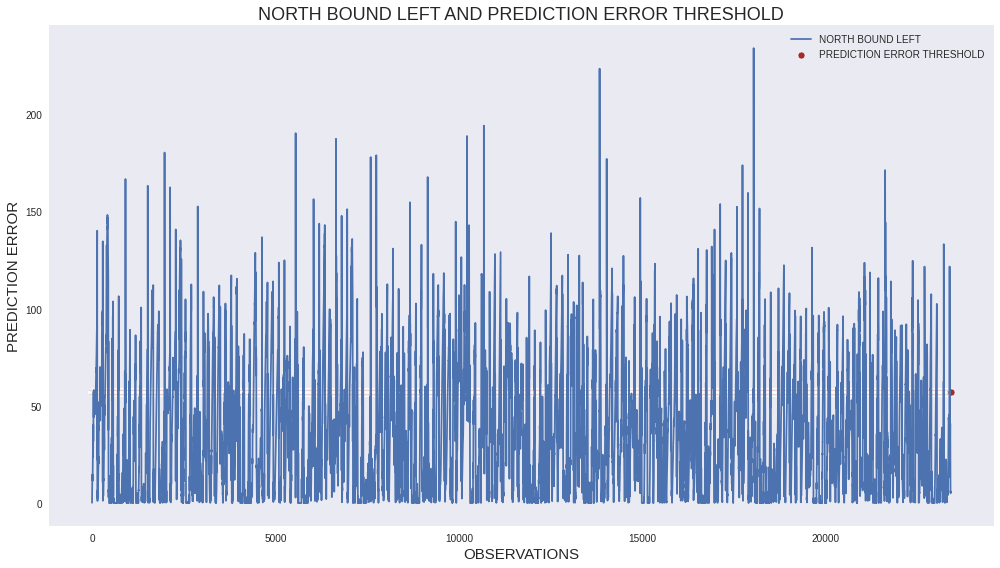

In [ ]:
AE_df['thresh_AE'] = thresh('north_bnd left', 20)
AE_threshold_plot('north_bnd left', "NORTH BOUND LEFT", 'thresh_AE')


In [ ]:
# 'north bnd', 
#create a dataframe for the same 
north_left_df = AE_df[['north_bnd left', 'thresh_AE']]
north_left_df['labels'] = north_left_df['north_bnd left'] > north_left_df['thresh_AE']


north_left_df['labels'] =  north_left_df.apply(lambda row: thresh_label(row), axis=1)




<ipython-input-203-eb4ff7ceeb07>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  north_left_df['labels'] = north_left_df['north_bnd left'] > north_left_df['thresh_AE']
<ipython-input-203-eb4ff7ceeb07>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  north_left_df['labels'] =  north_left_df.apply(lambda row: thresh_label(row), axis=1)


In [ ]:
# confusion_matrix(y_test, predictions)
from sklearn.metrics import confusion_matrix, classification_report


print(classification_report(north_leftdf.loc[:, ['labels']], north_left_df['labels']))



              precision    recall  f1-score   support

     Anomaly       0.42      0.71      0.53      3686
      Normal       0.94      0.81      0.87     19714

    accuracy                           0.80     23400
   macro avg       0.68      0.76      0.70     23400
weighted avg       0.86      0.80      0.82     23400



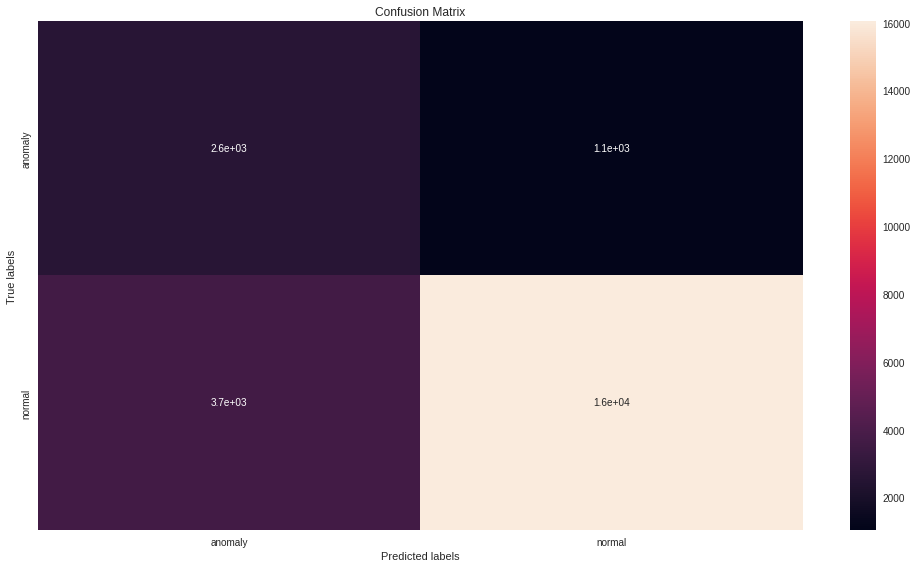

In [ ]:
ax= plt.subplot()


cm_nl = confusion_matrix(north_leftdf.loc[:, ['labels']], north_left_df['labels'])

sns.heatmap(cm_nl, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['anomaly', 'normal']); ax.yaxis.set_ticklabels(['anomaly', 'normal']);


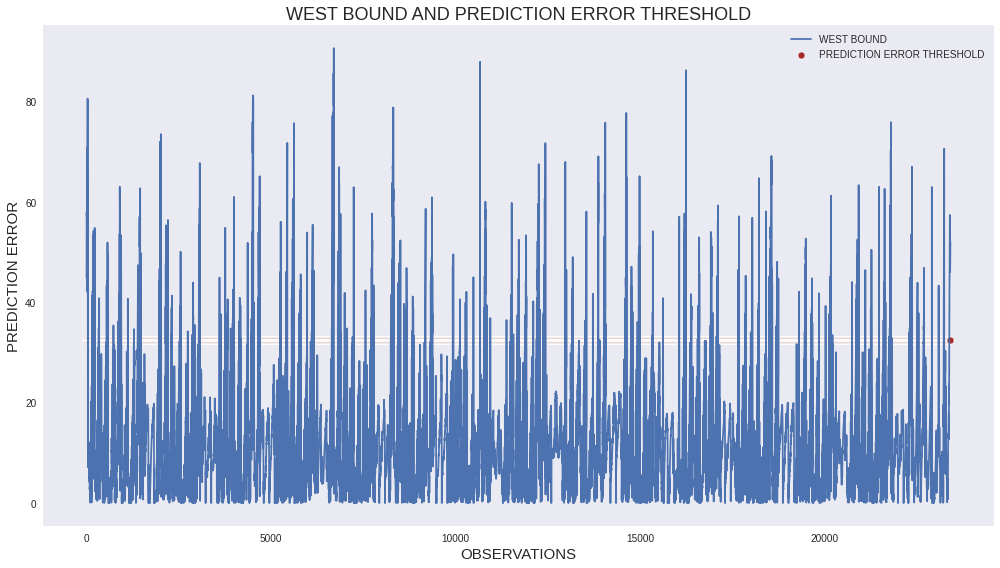

In [ ]:
AE_df['thresh_AE'] = thresh('west_bnd', 20)
AE_threshold_plot('west_bnd', "WEST BOUND", 'thresh_AE')

In [ ]:
AE_df.columns

Index(['north bnd', 'north_bnd left', 'west_bnd', 'west_bnd left', 'east_bnd',
       'east_bnd left', 'south_bnd', 'south_bnd left', 'thresh_AE'],
      dtype='object')

In [ ]:
#create a dataframe for the same 
west_acc_df = AE_df[['west_bnd', 'thresh_AE']]
west_acc_df['labels'] = west_acc_df['west_bnd'] > west_acc_df['thresh_AE']

<ipython-input-208-c69c69490f3a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  west_acc_df['labels'] = west_acc_df['west_bnd'] > west_acc_df['thresh_AE']


In [ ]:


#create a new column labels 
west_acc_df['labels'] =  west_acc_df.apply(lambda row: thresh_label(row), axis=1)

<ipython-input-209-47fcaa8e7731>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  west_acc_df['labels'] =  west_acc_df.apply(lambda row: thresh_label(row), axis=1)


In [ ]:
west_acc_df.groupby('labels').describe()

west_bnd                                                         \
           count       mean        std        min        25%        50%   
labels                                                                    
Anomaly   1495.0  45.494127  10.934313  32.408112  37.101611  42.619247   
Normal   21905.0  10.132667   7.467571   0.000000   4.011645   8.838627   

                              thresh_AE                                      \
               75%        max     count       mean           std        min   
labels                                                                        
Anomaly  51.259445  90.587587    1495.0  32.391872  7.107805e-15  32.391872   
Normal   14.999348  32.381123   21905.0  32.391872  7.105590e-15  32.391872   

                                                     
               25%        50%        75%        max  
labels                                               
Anomaly  32.391872  32.391872  32.391872  32.391872  
Normal   32.391872  32.391872  32.391872  32.391872

In [ ]:

# confusion_matrix(y_test, predictions)
from sklearn.metrics import confusion_matrix, classification_report


print(classification_report(westdf.loc[:, ['labels']], west_acc_df['labels']))



              precision    recall  f1-score   support

     Anomaly       0.86      0.40      0.54      3250
      Normal       0.91      0.99      0.95     20150

    accuracy                           0.91     23400
   macro avg       0.88      0.69      0.74     23400
weighted avg       0.90      0.91      0.89     23400



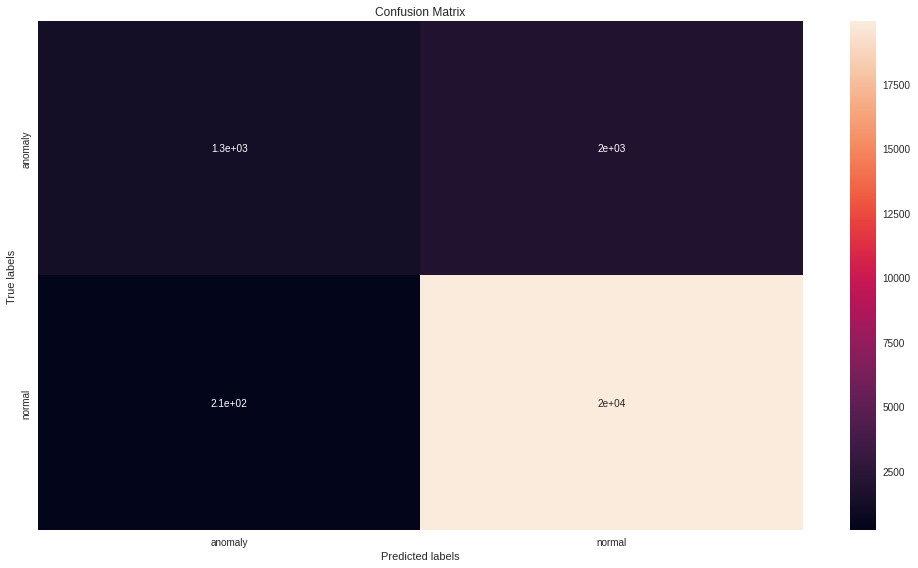

In [ ]:


ax= plt.subplot()


cm_wb = confusion_matrix(westdf.loc[:, ['labels']], west_acc_df['labels'])

sns.heatmap(cm_wb, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['anomaly', 'normal']); ax.yaxis.set_ticklabels(['anomaly', 'normal']);


###### West Bound Left

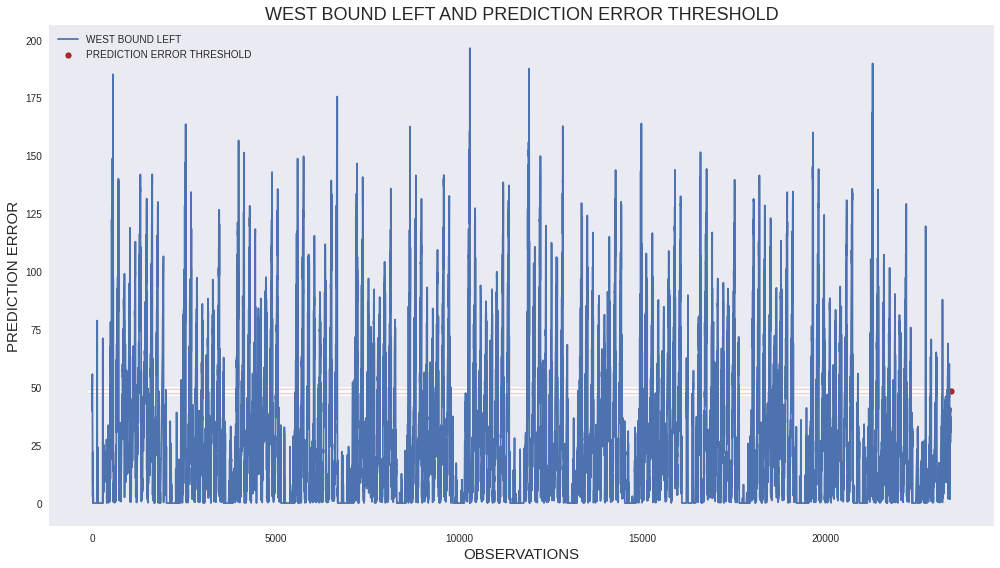

In [ ]:
AE_df['thresh_AE'] = thresh('west_bnd left', 20)
AE_threshold_plot('west_bnd left', "WEST BOUND LEFT", 'thresh_AE')

In [ ]:
#create a dataframe for the same 
west_left_df = AE_df[['west_bnd left', 'thresh_AE']]
west_left_df['labels'] = west_left_df['west_bnd left'] > west_left_df['thresh_AE']


#create a new column labels 
west_left_df['labels'] =  west_left_df.apply(lambda row: thresh_label(row), axis=1)



<ipython-input-214-7f61c7a9e693>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  west_left_df['labels'] = west_left_df['west_bnd left'] > west_left_df['thresh_AE']
<ipython-input-214-7f61c7a9e693>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  west_left_df['labels'] =  west_left_df.apply(lambda row: thresh_label(row), axis=1)


In [ ]:

# confusion_matrix(y_test, predictions)
from sklearn.metrics import confusion_matrix, classification_report


print(classification_report( west_leftdf.loc[:, ['labels']], west_left_df['labels']))




              precision    recall  f1-score   support

     Anomaly       0.49      1.00      0.66      2585
      Normal       1.00      0.87      0.93     20815

    accuracy                           0.89     23400
   macro avg       0.75      0.94      0.80     23400
weighted avg       0.94      0.89      0.90     23400



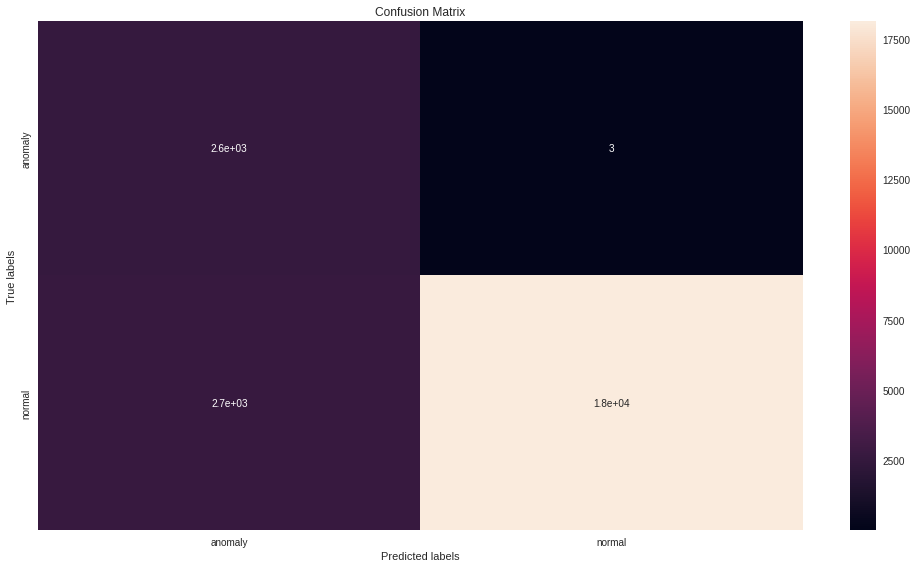

In [ ]:


ax= plt.subplot()


cm_wl = confusion_matrix( west_leftdf.loc[:, ['labels']], west_left_df['labels'])

sns.heatmap(cm_wl, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['anomaly', 'normal']); ax.yaxis.set_ticklabels(['anomaly', 'normal']);


###### East Bound

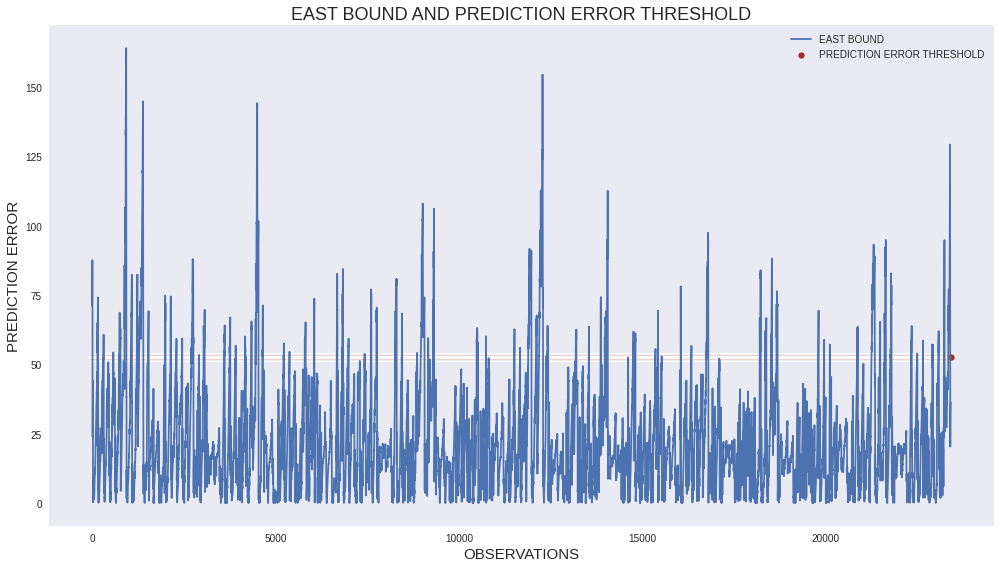

In [ ]:
AE_df['thresh_AE'] = thresh('east_bnd', 30)
AE_threshold_plot('east_bnd', "EAST BOUND", 'thresh_AE')

In [ ]:
#create a dataframe for the same 
east_acc_df = AE_df[['east_bnd', 'thresh_AE']]
east_acc_df['labels'] = east_acc_df['east_bnd'] > east_acc_df['thresh_AE']


#create a new column labels 
east_acc_df['labels'] =  east_acc_df.apply(lambda row: thresh_label(row), axis=1)



<ipython-input-218-81522959ce21>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  east_acc_df['labels'] = east_acc_df['east_bnd'] > east_acc_df['thresh_AE']
<ipython-input-218-81522959ce21>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  east_acc_df['labels'] =  east_acc_df.apply(lambda row: thresh_label(row), axis=1)


In [ ]:

# confusion_matrix(y_test, predictions)
from sklearn.metrics import confusion_matrix, classification_report


print(classification_report(eastdf.loc[:, ['labels']], east_acc_df['labels']))




              precision    recall  f1-score   support

     Anomaly       0.93      0.65      0.77      2698
      Normal       0.96      0.99      0.97     20702

    accuracy                           0.95     23400
   macro avg       0.94      0.82      0.87     23400
weighted avg       0.95      0.95      0.95     23400



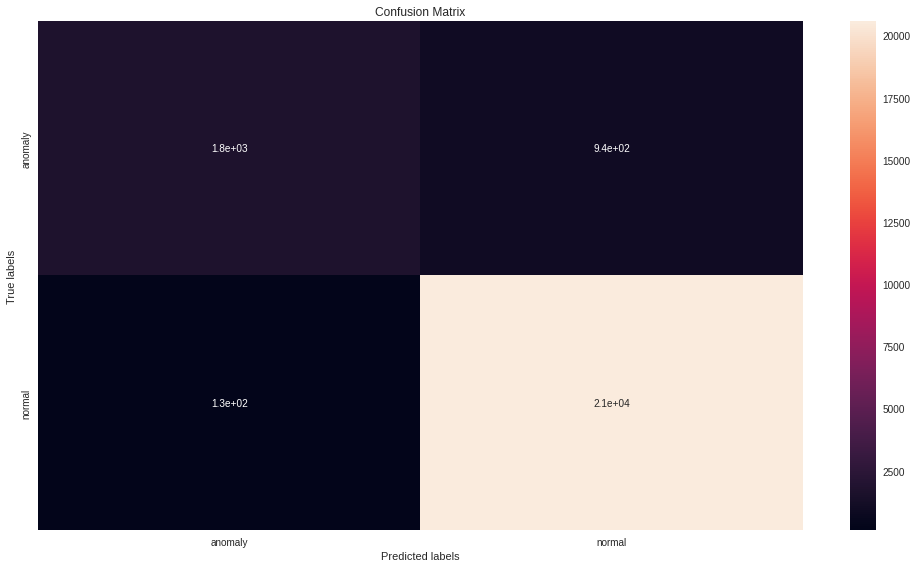

In [ ]:


ax= plt.subplot()


cm_eb = confusion_matrix(eastdf.loc[:, ['labels']], east_acc_df['labels'])

sns.heatmap(cm_eb, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['anomaly', 'normal']); ax.yaxis.set_ticklabels(['anomaly', 'normal']);


###### East Bound Left

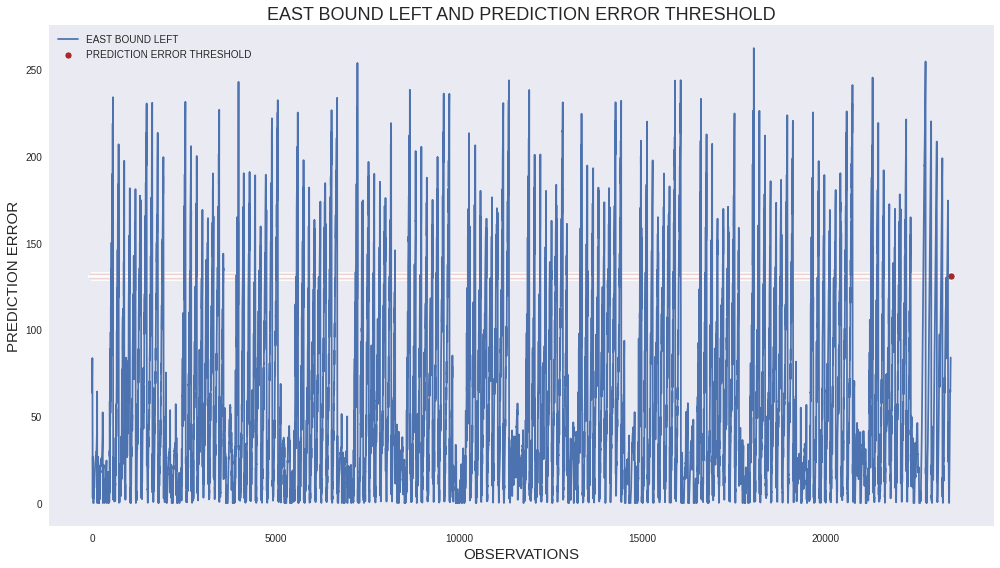

In [ ]:
AE_df['thresh_AE'] = thresh('east_bnd left', 70)
AE_threshold_plot('east_bnd left', "EAST BOUND LEFT", 'thresh_AE')

In [ ]:
#create a dataframe for the same 
east_left_df = AE_df[['east_bnd left', 'thresh_AE']]
east_left_df['labels'] = east_left_df['east_bnd left'] > east_left_df['thresh_AE']

# def thresh_label(row):
#   if (row['labels'] == True): 
   
#     val = 'Anomaly'
#   else: 
#     val = 'Normal'
#   return val

#create a new column labels 
east_left_df['labels'] =  east_left_df.apply(lambda row: thresh_label(row), axis=1)



<ipython-input-222-901290f44be1>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  east_left_df['labels'] = east_left_df['east_bnd left'] > east_left_df['thresh_AE']
<ipython-input-222-901290f44be1>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  east_left_df['labels'] =  east_left_df.apply(lambda row: thresh_label(row), axis=1)


In [ ]:

# confusion_matrix(y_test, predictions)
from sklearn.metrics import confusion_matrix, classification_report


print(classification_report(east_leftdf.loc[:, ['labels']], east_left_df['labels']))




              precision    recall  f1-score   support

     Anomaly       0.74      1.00      0.85      2568
      Normal       1.00      0.96      0.98     20832

    accuracy                           0.96     23400
   macro avg       0.87      0.98      0.91     23400
weighted avg       0.97      0.96      0.96     23400



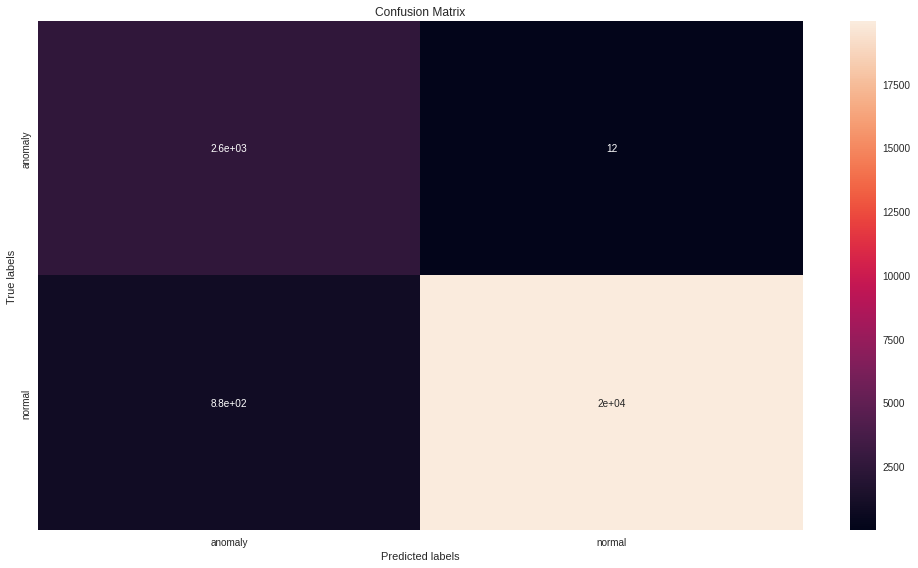

In [ ]:


ax= plt.subplot()


cm_el = confusion_matrix(east_leftdf.loc[:, ['labels']], east_left_df['labels'])

sns.heatmap(cm_el, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['anomaly', 'normal']); ax.yaxis.set_ticklabels(['anomaly', 'normal']);


###### South Bound

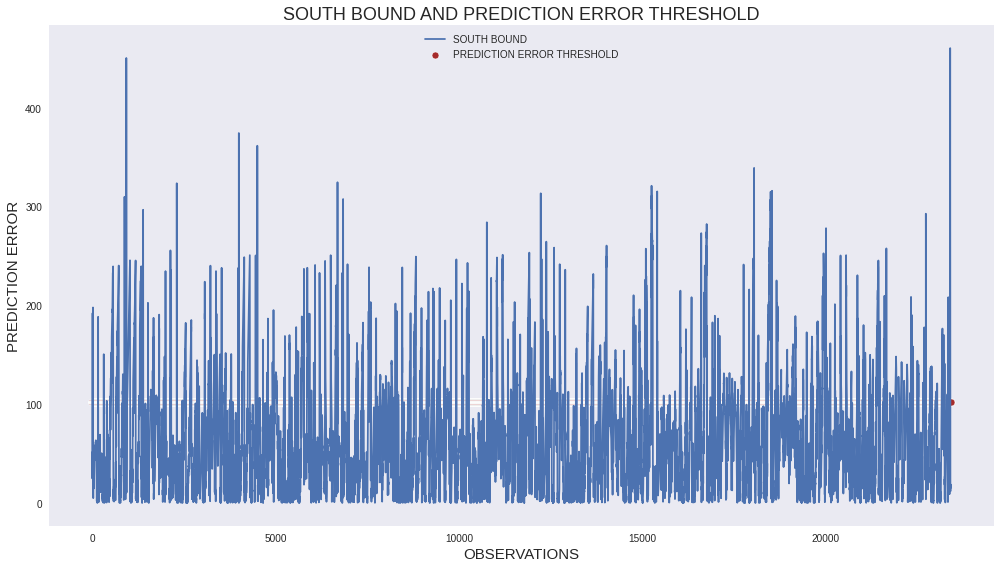

In [ ]:

AE_df['thresh_AE'] = thresh('south_bnd', 40)
AE_threshold_plot('south_bnd', "SOUTH BOUND", 'thresh_AE')

In [ ]:
#create a dataframe for the same 
south_acc_df = AE_df[['south_bnd', 'thresh_AE']]
south_acc_df['labels'] = south_acc_df['south_bnd'] > south_acc_df['thresh_AE']

# def thresh_label(row):
#   if (row['labels'] == True): 
   
#     val = 'Anomaly'
#   else: 
#     val = 'Normal'
#   return val

#create a new column labels 
south_acc_df['labels'] =  south_acc_df.apply(lambda row: thresh_label(row), axis=1)



<ipython-input-226-817de73e6fba>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  south_acc_df['labels'] = south_acc_df['south_bnd'] > south_acc_df['thresh_AE']
<ipython-input-226-817de73e6fba>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  south_acc_df['labels'] =  south_acc_df.apply(lambda row: thresh_label(row), axis=1)


In [ ]:

# confusion_matrix(y_test, predictions)
from sklearn.metrics import confusion_matrix, classification_report


print(classification_report(southdf.loc[:, ['labels']], south_acc_df['labels']))


              precision    recall  f1-score   support

     Anomaly       0.32      0.23      0.27      6006
      Normal       0.76      0.83      0.79     17394

    accuracy                           0.68     23400
   macro avg       0.54      0.53      0.53     23400
weighted avg       0.65      0.68      0.66     23400



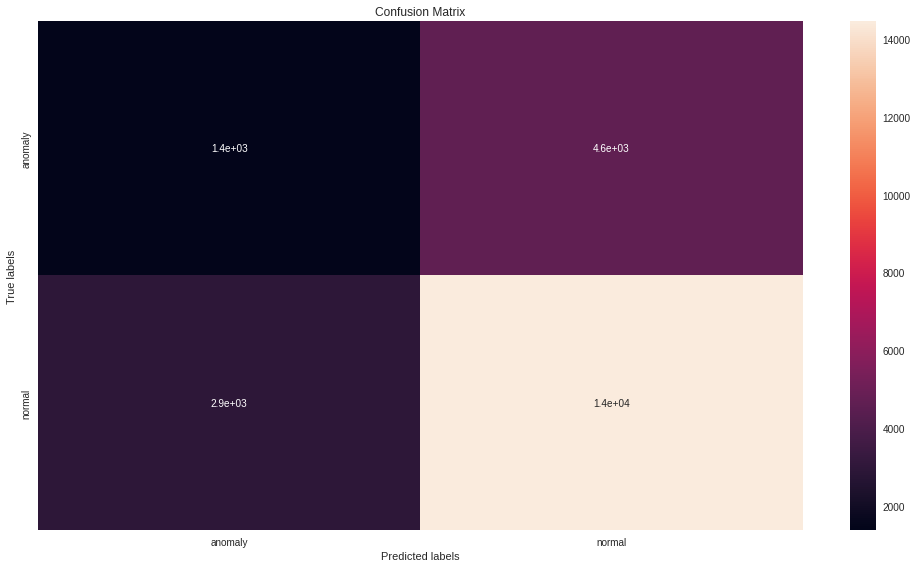

In [ ]:




ax= plt.subplot()


cm_sb = confusion_matrix(southdf.loc[:, ['labels']], south_acc_df['labels'])

sns.heatmap(cm_sb, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['anomaly', 'normal']); ax.yaxis.set_ticklabels(['anomaly', 'normal']);


###### South Bound Left

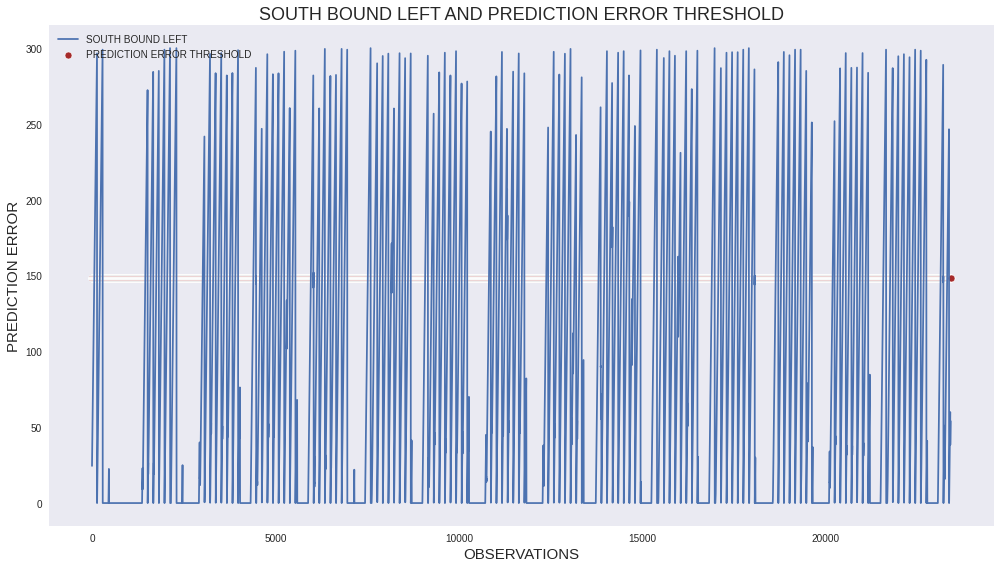

In [ ]:
AE_df['thresh_AE'] = thresh('south_bnd left', 50)
AE_threshold_plot('south_bnd left', "SOUTH BOUND LEFT", 'thresh_AE')

In [ ]:
#create a dataframe for the same 
south_left_df = AE_df[['south_bnd left', 'thresh_AE']]
south_left_df['labels'] = south_left_df['south_bnd left'] > south_left_df['thresh_AE']

# def thresh_label(row):
#   if (row['labels'] == True): 
   
#     val = 'Anomaly'
#   else: 
#     val = 'Normal'
#   return val

#create a new column labels 
south_left_df['labels'] =  south_left_df.apply(lambda row: thresh_label(row), axis=1)




<ipython-input-231-a25281ed9c48>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  south_left_df['labels'] = south_left_df['south_bnd left'] > south_left_df['thresh_AE']
<ipython-input-231-a25281ed9c48>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  south_left_df['labels'] =  south_left_df.apply(lambda row: thresh_label(row), axis=1)


In [ ]:

# confusion_matrix(y_test, predictions)
from sklearn.metrics import confusion_matrix, classification_report


print(classification_report(south_leftdf.loc[:, ['labels']], south_left_df['labels']))



              precision    recall  f1-score   support

     Anomaly       0.63      1.00      0.78      4825
      Normal       1.00      0.85      0.92     18575

    accuracy                           0.88     23400
   macro avg       0.82      0.93      0.85     23400
weighted avg       0.92      0.88      0.89     23400



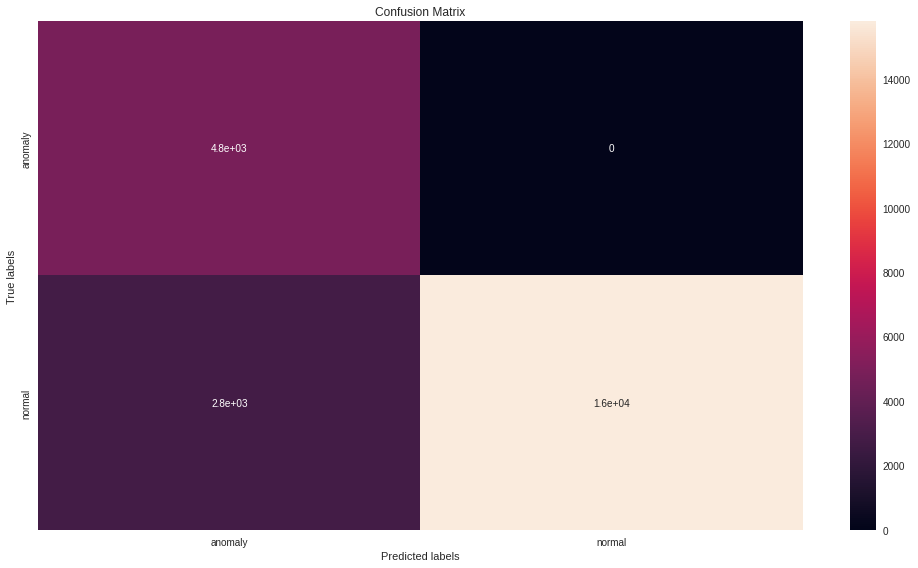

In [ ]:



ax= plt.subplot()


cm_sl = confusion_matrix(south_leftdf.loc[:, ['labels']], south_left_df['labels'])

sns.heatmap(cm_sl, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['anomaly', 'normal']); ax.yaxis.set_ticklabels(['anomaly', 'normal']);


In [ ]:
cm_nb


array([[ 1463,  1784],
       [ 8993, 11160]])

In [ ]:
cm_nb[0][0]

1463

In [ ]:
cm_nb[0][1]


1784

In [ ]:
cm_nb[1][0]


8993

In [ ]:
AE_df.shape

(23400, 9)

In [ ]:
# (np_poi / 2)*100

In [ ]:
# TP_np = (np.array(TP) / AE_df.shape[0]) * 100

In [ ]:
"""
TP FN
FP TN
"""

cm_sl      

array([[ 2901,     5],
       [  920, 19574]])

In [ ]:
cm_sl[0][0]   # -> TP

2901

In [ ]:
cm_sl[1][0]   # -> FP

920

In [ ]:
cm_sl[0][1]   # -> FN

5

In [ ]:
cm_sl[1][1]   # -> TN

19574

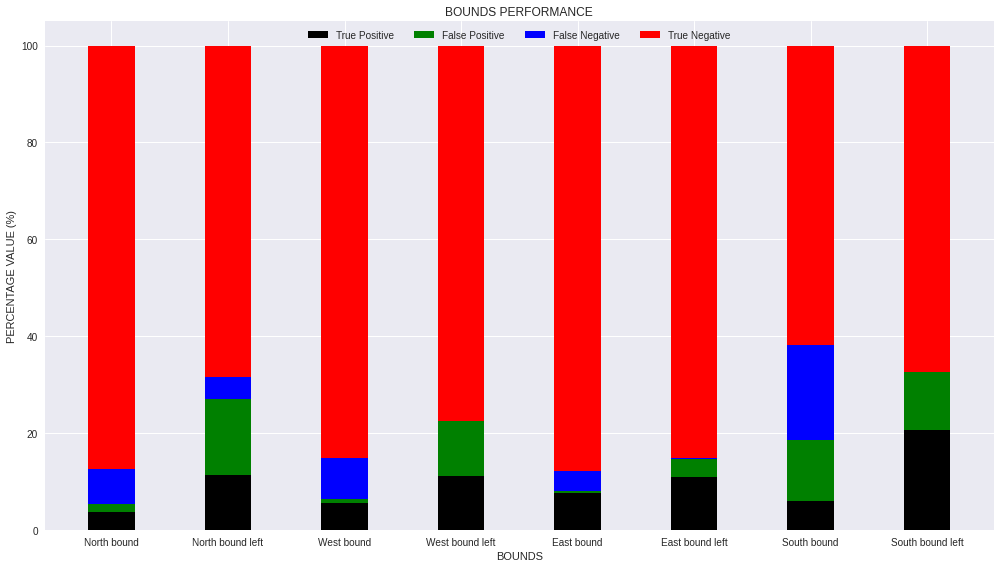

In [ ]:
bounds = ['North bound', 'North bound left', 'West bound', 'West bound left', 'East bound', 'East bound left', 'South bound', 'South bound left']


TP = [cm_nb[0][0],cm_nl[0][0], cm_wb[0][0], cm_wl[0][0], cm_eb[0][0], cm_el[0][0], cm_sb[0][0], cm_sl[0][0]] 
FP = [cm_nb[1][0],cm_nl[1][0], cm_wb[1][0], cm_wl[1][0], cm_eb[1][0], cm_el[1][0], cm_sb[1][0], cm_sl[1][0]] 
FN = [cm_nb[0][1],cm_nl[0][1], cm_wb[0][1], cm_wl[0][1], cm_eb[0][1], cm_el[0][1], cm_sb[0][1], cm_sl[0][1]]
TN = [cm_nb[1][1],cm_nl[1][1], cm_wb[1][1], cm_wl[1][1], cm_eb[1][1], cm_el[1][1], cm_sb[1][1], cm_sl[1][1]]

#changing into numpy array 
TP_np = (np.array(TP) / AE_df.shape[0]) * 100
FP_np = (np.array(FP) / AE_df.shape[0]) * 100
FN_np = (np.array(FN) / AE_df.shape[0]) * 100
TN_np = (np.array(TN) / AE_df.shape[0]) * 100

b_FN = list(np.add(TP_np, FP_np)) 
b_TN = list(np.add(b_FN, FN_np))


plt.bar(bounds, TP_np, 0.4, color='black', label="True Positive")
plt.bar(bounds, FP_np, 0.4, color='green', bottom=TP_np, label="False Positive")
plt.bar(bounds, FN_np, 0.4,bottom=b_FN, color='blue', label="False Negative")
plt.bar(bounds, TN_np, 0.4,bottom=b_TN, color='red', label="True Negative")

plt.xlabel("BOUNDS")
plt.ylabel("PERCENTAGE VALUE (%)")
plt.title("BOUNDS PERFORMANCE")
plt.legend(loc='upper center', ncol=4, fancybox=True, shadow=True)
plt.show()


#### MAE

##### North bound thru

In [ ]:
#these are scaled values including the train_predict_val


# #should be having a test data which is what we've tried to predict on
# # in terms of determining the maximum threshold error to evaluate on
# plt.figure(figsize=(18,10))
# trainMAE = np.mean(np.abs(pred_df['north_bnd Predictions'] - pred_df['north_bnd Actuals']), axis=1)
# plt.hist(trainMAE, bins=30)
# plt.show()

In [ ]:
#we'll adjust since we have underfitting
'''
Underfitting -> would mean that the validation data is 
                training better than the train data
In this respect then we have the MAE of the train data to be 
huge compared to the test ones
'''
max_trainMAE = 0.0034

In [ ]:
North_left = np.mean(np.abs(pred_df['north_bnd left Predictions'] - pred_df['north_bnd left Actuals']))
East_bnd = np.mean(np.abs(pred_df['east_bnd Predictions'] - pred_df['east_bnd Actuals']))
East_left = np.mean(np.abs(pred_df['east_bnd left Predictions'] - pred_df['east_bnd left Actuals']))
West_bnd = np.mean(np.abs(pred_df['west_bnd Predictions'] - pred_df['west_bnd Actuals']))
West_left = np.mean(np.abs(pred_df['west_bnd left Predictions'] - pred_df['west_bnd left Actuals']))
South_bnd = np.mean(np.abs(pred_df['south_bnd Predictions'] - pred_df['south_bnd Actuals']))
South_left = np.mean(np.abs(pred_df['south_bnd left Predictions'] - pred_df['south_bnd left Actuals']))


(array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]),
 array([0.05616221, 0.15616221, 0.25616221, 0.35616221, 0.45616221,
        0.55616221, 0.65616221, 0.75616221, 0.85616221, 0.95616221,
        1.05616221]),
 <a list of 10 Patch objects>)

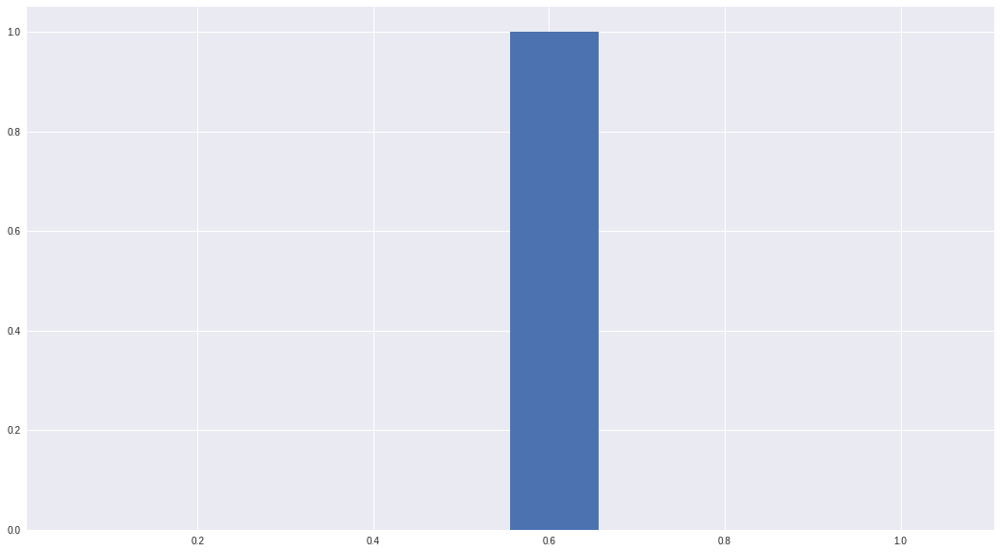

In [ ]:
#scaled test_predict_val
plt.figure(figsize=(18,10))
testMAE = np.mean(np.abs(pred_df['north_bnd Predictions'] - pred_df['north_bnd Actuals']))
plt.hist(testMAE)



In [ ]:
'''
Since we have our test data being the 257 torque values then 
we could go ahead and take the corresponding ang values for the 
same

# changing col names
trq_df.columns = ['t', 'y']
'''

dt = accTime_df.values
dt = dt.astype('float32')

test_t = dt[train_size-window_len:, :]

#Now as you'd imagine we are taking the col
all_bounds = test_t[:, 0]
all_bounds

array([49939., 49941., 49943., ..., 52593., 52595., 52597.], dtype=float32)

In [ ]:
all_bounds.shape

(1330,)

In [ ]:
len(all_bounds) #now at 1314 we will be reducing this using window_len

1330

In [ ]:
#inversing the test values to normal scaling
test_inv = scaler.inverse_transform(test) #taking the north actuals col and inversing the values


'''
we have: len(test_ang[window_len]:) ->257  - these are corresponding ang values
         len(test[window_len:]) -> 257
         len(test_predict_val)  -> 257

         len(testMAE)           -> 257

Since these lengths are conforming picking the very specific values
we can go ahead and create a dataframe for them. 
 
'''

test_invN = test_inv[:, 2] #particularly taking the north values after an inverse
test_invNL = test_inv[:, 3]
test_invE = test_inv[:, 4]
test_invEL = test_inv[:, 5]
test_invW = test_inv[:, 0]
test_invWL = test_inv[:, 1]
test_invS = test_inv[:, 6]
test_invSL = test_inv[:, 7]


anomaly_df = pd.DataFrame(all_bounds[window_len:])
# anomaly_df['testMAE'] = 0.0
# anomaly_df['testMAE'] = testMAE
anomaly_df['max_trainMAE'] = max_trainMAE
# anomaly_df['anom_value'] = anomaly_df['testMAE'] > anomaly_df['max_trainMAE']

anomaly_df['north bnd values'] = test_invN[window_len:]
anomaly_df['north bnd Left values'] = test_invNL[window_len:]

anomaly_df['East bnd values'] = test_invE[window_len:]
anomaly_df['East bnd Left values'] = test_invEL[window_len:]
anomaly_df['West bnd values'] = test_invW[window_len:]
anomaly_df['West bnd Left values'] = test_invWL[window_len:]
anomaly_df['South bnd values'] = test_invS[window_len:]
anomaly_df['South bnd Left values'] = test_invSL[window_len:]


anomaly_df

,0,max_trainMAE,north bnd values,north bnd Left values,East bnd values,East bnd Left values,West bnd values,West bnd Left values,South bnd values,South bnd Left values
0,49999.0,0.0034,8790.052340,7584.2,124.642857,595.125000,26.550000,557.272727,103.587500,98.000000
1,50001.0,0.0034,8790.160861,7584.2,124.642857,596.875000,21.937500,559.090909,104.262500,99.000000
2,50003.0,0.0034,8790.293058,7584.2,111.458333,598.625000,21.937500,560.909091,121.562500,100.000000
3,50005.0,0.0034,8790.453919,7584.2,94.000000,600.375000,21.625000,562.727273,122.312500,67.333333
4,50007.0,0.0034,8792.447327,7584.2,68.500000,602.125000,0.000000,564.545455,123.062500,68.000000
...,...,...,...,...,...,...,...,...,...,...
1295,52589.0,0.0034,8857.507862,4745.5,344.196581,411.285714,121.875000,374.142857,384.280556,144.000000
1296,52591.0,0.0034,8857.692308,4745.5,345.102564,413.000000,122.553571,375.857143,366.431818,145.000000
1297,52593.0,0.0034,8857.872037,4745.5,346.008547,414.714286,123.232143,377.571429,367.285354,146.000000
1298,52595.0,0.0034,8858.061200,4745.5,346.914530,416.428571,123.910714,379.285714,350.150000,147.000000


In [ ]:
# anomaly_df[[0, 'north bnd values']].head(30)

In [ ]:
# RL_Attack_AccWaiting[['time', 'North bound thru']][:1300] #-- compare with anomaly_df values

In [ ]:
#we are now changing the 0 col to time
anomaly_df = anomaly_df.rename(columns={
    0: 'time'
})

In [ ]:
#plotting the [time] against the max and test MAE
#it should be showing the values that have passed our max error threshold of 0.1
# plt.figure(figsize=(18,10))
# sns.lineplot(x=anomaly_df['time'], y=anomaly_df['testMAE'], label='test MAE')
# sns.lineplot(x=anomaly_df['time'], y=anomaly_df['max_trainMAE'], label='max MAE')
# plt.legend()
# plt.show()

In [ ]:
our_list = list[:1300]

In [ ]:
testMAE = our_list

In [ ]:
anomaly_df['testMAE'] = testMAE  
anomaly_df['North_left'] = North_left 
anomaly_df['East_bnd'] = East_bnd
anomaly_df['East_left'] = East_left
anomaly_df['West_bnd'] = West_bnd
anomaly_df['West_left'] = West_left
anomaly_df['South_bnd'] = South_bnd 
anomaly_df['South_left'] = South_left 

In [ ]:
anomaly_df['East bnd Left values']

0       595.125000
1       596.875000
2       598.625000
3       600.375000
4       602.125000
           ...    
1295    411.285714
1296    413.000000
1297    414.714286
1298    416.428571
1299    418.142857
Name: East bnd Left values, Length: 1300, dtype: float64

In [ ]:
north_df['anom_value'].value_counts()

False    1172
True      128
Name: anom_value, dtype: int64

In [ ]:
# anomaly_df['testMAE'] = 0.0
# anomaly_df['testMAE'] = testMAE
# anomaly_df['anom_value'] = anomaly_df['testMAE'] > anomaly_df['max_trainMAE']

north_df = anomaly_df[['max_trainMAE', 'testMAE', 'north bnd values']]
north_df['anom_value'] = north_df['testMAE'] > north_df['max_trainMAE']

northLeft_df = anomaly_df[['max_trainMAE', 'North_left', 'north bnd Left values']] 
northLeft_df['anom_value'] = northLeft_df['North_left'] > northLeft_df['max_trainMAE']


East_df = anomaly_df[['max_trainMAE','East_bnd', 'East bnd values']]
East_df['anom_value'] = East_df['East_bnd'] > East_df['max_trainMAE']


EastLeft_df = anomaly_df[['max_trainMAE', 'East_left', 'East bnd Left values']]
EastLeft_df['anom_value'] = EastLeft_df['East_left'] > EastLeft_df['max_trainMAE']

West_df = anomaly_df[['max_trainMAE', 'West_bnd', 'West bnd values']]
West_df['anom_value'] = West_df['West_bnd'] > West_df['max_trainMAE']

WestLeft_df = anomaly_df[['max_trainMAE', 'West_left', 'West bnd Left values']]
WestLeft_df['anom_value'] = WestLeft_df['West_left'] > WestLeft_df['max_trainMAE']

South_df = anomaly_df[['max_trainMAE', 'South_bnd', 'South bnd values']]
South_df['anom_value'] = South_df['South_bnd'] > South_df['max_trainMAE']

SouthLeft_df = anomaly_df[['max_trainMAE', 'South_left', 'South bnd Left values']]
SouthLeft_df['anom_value'] = SouthLeft_df['South_left'] > SouthLeft_df['max_trainMAE']


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

In [ ]:
all_dfs['East bound thru_accTime'].nunique()

19798

In [ ]:
len(all_dfs)

25999

In [ ]:
Free_AccWaiting['South bound left'].unique()

array([62.5, 63. , 63.5,  0. , 13. , 16. , 16.5, 17. , 17.5, 18. , 18.5,
       19. , 19.5, 20. , 20.5, 14.5, 15. , 15.5, 12. , 14. , 13.5, 12.5,
        9. ,  9.5, 10. , 10.5, 11. , 11.5, 21. ,  7.5,  8. ,  8.5, 21.5,
        7. , 22. ,  6. ,  6.5, 22.5,  5. ,  5.5])

In [ ]:
Free_AccWaiting.columns

Index(['time', 'West bound thru', 'West bound left', 'North bound thru',
       'North bound left', 'East bound thru', 'East bound left',
       'South bound thru', 'South bound left', 'current phase', 'set phase'],
      dtype='object')

In [ ]:
East_df['anom_value'].unique()

array([ True])

In [ ]:
#creating a dataframe where the MAE exceeds the max MAE -> getting our anomaly points
def anomalies(data, col):
  anomalies = data.loc[data['anom_value'] == True]
  trial_df = data.applymap(lambda x: 1 if x else np.nan)
  trial_df[col] =  data[col]
  return trial_df

In [ ]:
# trial_df = north_df.applymap(lambda x: 1 if x else np.nan)
# len(trial_df)

1300

In [ ]:

# trial_df['north bnd values'] =  north_df['north bnd values']


In [ ]:
# trial_df.loc[trial_df['anom_value'] == True]

In [ ]:
# valz = trial_df['north bnd values']

# trial_df['north bnd values'] = trial_df.apply(
#     # lambda row: row['north bnd values']  if bool(row['anom_value']) == True else np.nan,

#     '''
#     lambda row should be nan (np.nan) if there is no anomaly value in the same row but else 
#     it should return the particular values if there is an anomaly value in the same row
#     '''

#     lambda row: np.nan if np.isnan(row['anom_value']) else row['north bnd values'], 
#     axis=1
#     )
# # values = 0
# # trial_df['north bnd values'] = values.where(trial_df['anom_value'] == np.nan, others=trial_df['north bnd values'])
# # trial_df

In [ ]:
# trial_df
# trial_df.loc[trial_df['anom_value'] == True]


In [ ]:
#just checking the no. of anomalies we might have
len(anomalies)

1300

scaling values before plot

In [ ]:
anomaly_df.columns

Index(['time', 'testMAE', 'max_trainMAE', 'anom_value', 'north bnd values'], dtype='object')

In [ ]:
trial_df.columns

Index(['time', 'testMAE', 'max_trainMAE', 'anom_value', 'north bnd values'], dtype='object')

In [ ]:
plot_acc = Free_AccWaiting.index[len(anomaly_df)]

plot_accNorth = Free_AccWaiting.loc[-1:1299,: ]

In [ ]:
# from sklearn.preprocessing import MinMaxScaler

# data_rl = anomaly_df.filter(['north bnd values'])  
# data_free = plot_accNorth.filter(['North bound thru'])  
# data_trial = trial_df.filter(['north bnd values'])


# #convert the dataframe to a numpy array
# rl_values = data_rl.values
# free_values = data_free.values
# tl_values = data_trial.values

# #rl 
# scaler = MinMaxScaler(feature_range=(0,1))
# scaled_rl = scaler.fit_transform(rl_values)

# #free
# scaled_free = scaler.fit_transform(free_values)

# #tl
# scaled_tl = scaler.fit_transform(tl_values)





In [ ]:
len(scaled_tl[:,0])

1300

In [ ]:
# plt.rcParams["figure.figsize"] = [14, 8]
# plt.rcParams["figure.autolayout"] = True

# # f, ax = plt.subplots(1)
# # f.set_figheight(6)
# # f.set_figwidth(15)

# plt.subplots()
# # fig, ax1 = plt.subplots()
# sns.lineplot(x=anomaly_df.index, y=scaled_rl[:, 0], label="north bnd values")
# # sns.scatterplot(x=anom[:, 0], y=anom[:, -1], color='magenta', ax=ax, label="anomalies")
# # ax2 = ax1.twinx()



# # sns.lineplot(x=plot_accNorth.index, 
# #                y=scaled_free[:,0],
# #                color='dodgerblue', 
# #                label='Attack free')

# sns.scatterplot(x=trial_df.index, y=scaled_tl[:,0], color='magenta', label="anomalies")


# plt.title('North bound thru values and anomaly detection', fontsize=18)
# plt.xlabel("Values forecast", size=15)
# plt.ylabel("North bound thru", size=15)
# plt.tight_layout()
# plt.legend()
# plt.show()


In [ ]:
def anom_feature_plot(bound, title, fin_data):
  plt.rcParams["figure.figsize"] = [14, 8]
  plt.rcParams["figure.autolayout"] = True

  # f, ax = plt.subplots(1)
  # f.set_figheight(6)
  # f.set_figwidth(15)

  plt.subplots()
  # fig, ax1 = plt.subplots()
  sns.lineplot(x=anomaly_df.index, y=anomaly_df[bound], label=bound)
  # sns.scatterplot(x=anom[:, 0], y=anom[:, -1], color='magenta', ax=ax, label="anomalies")
  # ax2 = ax1.twinx()

  sns.scatterplot(x=fin_data.index, y=fin_data[bound], color='magenta', label="anomalies")


  plt.title('{} and anomaly detection'.format(title), fontsize=18)
  plt.xlabel("Values forecast", size=15)
  plt.ylabel("{} (minutes)".format(title), size=15)
  plt.tight_layout()
  plt.legend()
  plt.grid(False)
  plt.show()


In [ ]:
anomaly_df.columns         

Index(['time', 'max_trainMAE', 'north bnd values', 'north bnd Left values',
       'East bnd values', 'East bnd Left values', 'West bnd values',
       'West bnd Left values', 'South bnd values', 'South bnd Left values',
       'testMAE ', 'North_left', 'East_bnd', 'East_left', 'West_bnd',
       'West_left', 'South_bnd', 'South_left', 'testMAE'],
      dtype='object')

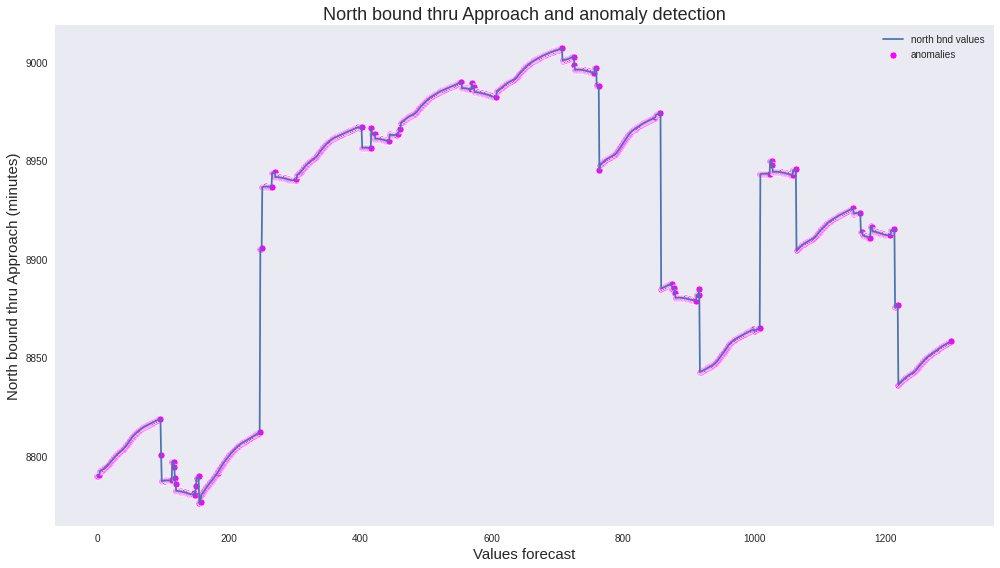

In [ ]:
anom_feature_plot('north bnd values', "North bound thru Approach", anomalies(north_df, 'north bnd values'))

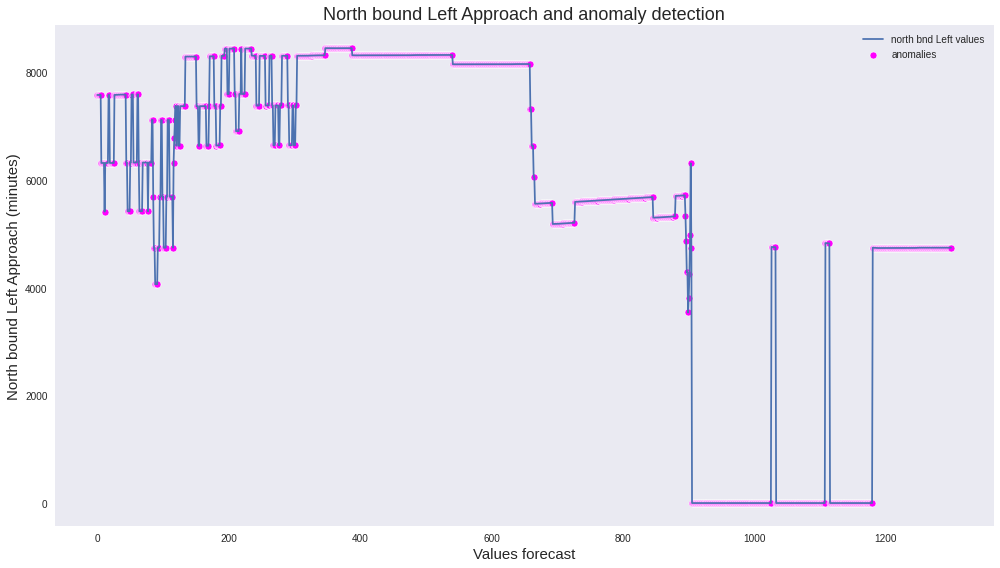

In [ ]:

anom_feature_plot('north bnd Left values', "North bound Left Approach", anomalies(northLeft_df, 'north bnd Left values'))


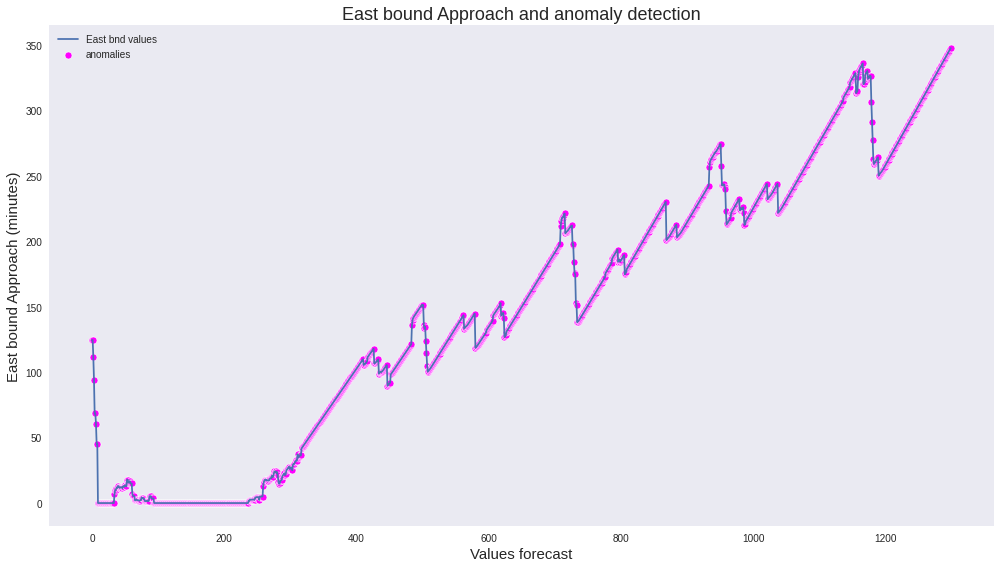

In [ ]:
anom_feature_plot('East bnd values', "East bound Approach", anomalies(East_df, 'East bnd values'))


In [ ]:
# anom_feature_plot('East bnd values', "East bound thru", )


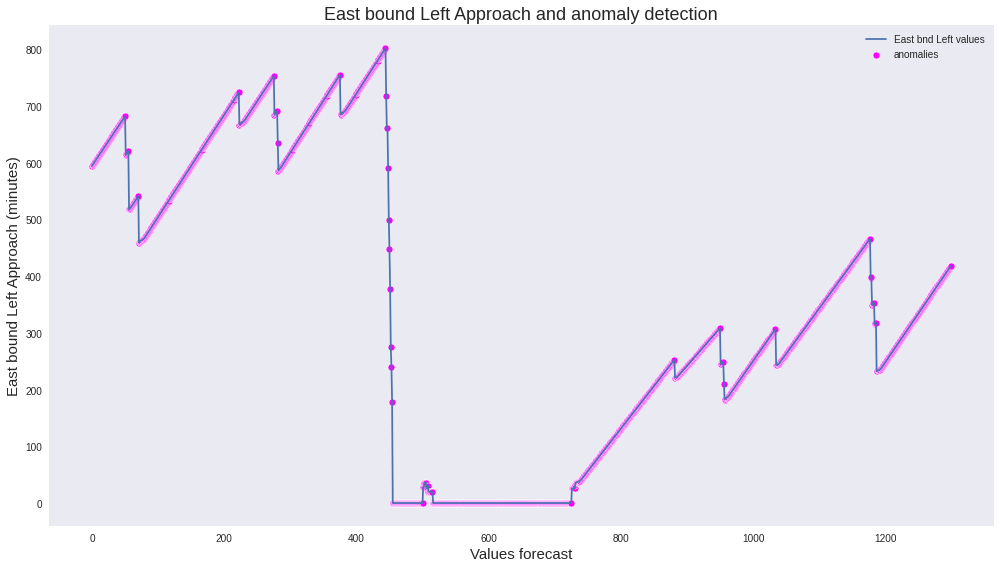

In [ ]:
anom_feature_plot('East bnd Left values', "East bound Left Approach", anomalies(EastLeft_df, 'East bnd Left values'))


In [ ]:
anomaly_df.columns

Index(['time', 'max_trainMAE', 'north bnd values', 'north bnd Left values',
       'East bnd values', 'East bnd Left values', 'West bnd values',
       'West bnd Left values', 'South bnd values', 'South bnd Left values',
       'testMAE', 'North_left', 'East_bnd', 'East_left', 'West_bnd',
       'West_left', 'South_bnd', 'South_left'],
      dtype='object')

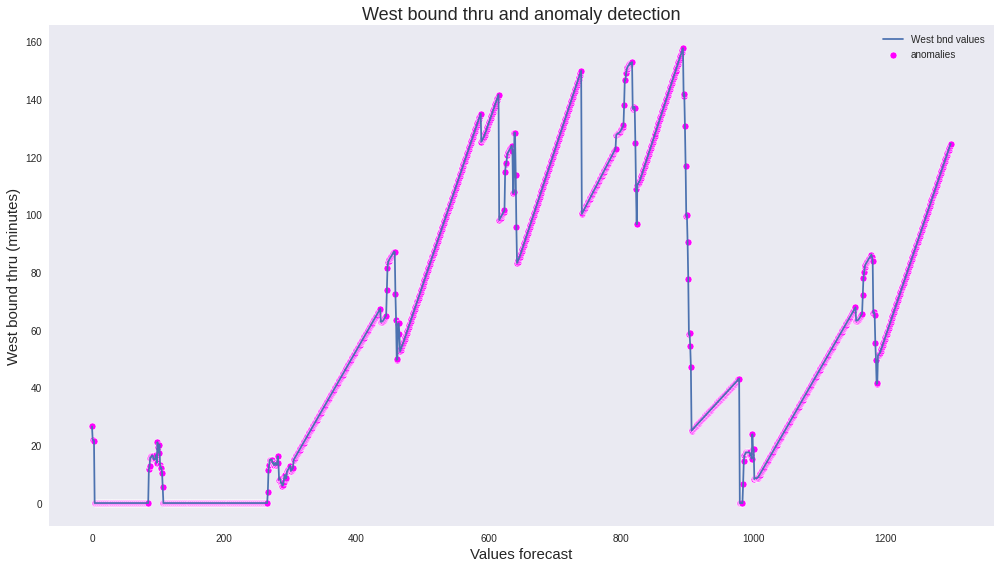

In [ ]:
anom_feature_plot('West bnd values', "West bound thru", anomalies(West_df, 'West bnd values' ) )


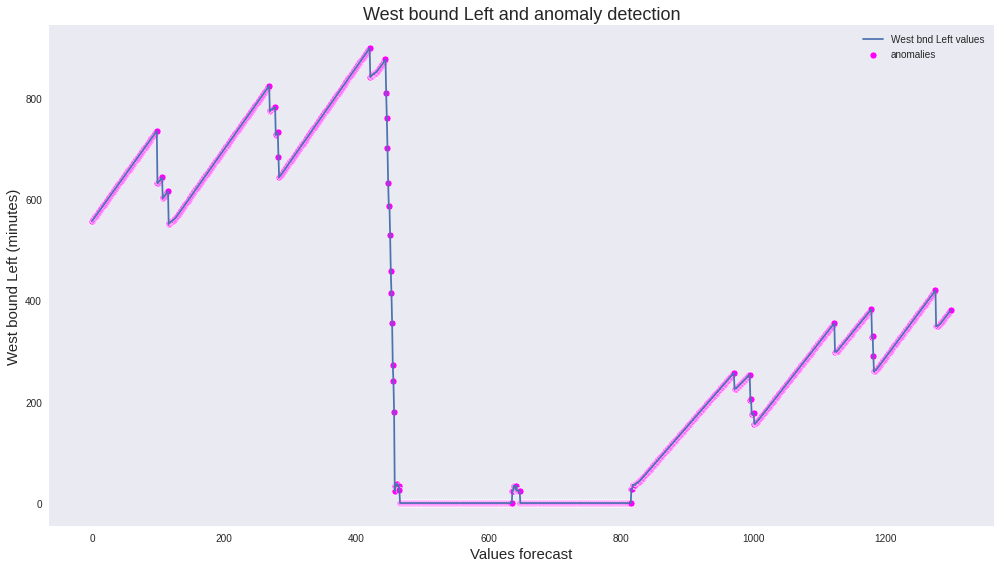

In [ ]:
anom_feature_plot('West bnd Left values', "West bound Left", anomalies(WestLeft_df, 'West bnd Left values' ) )


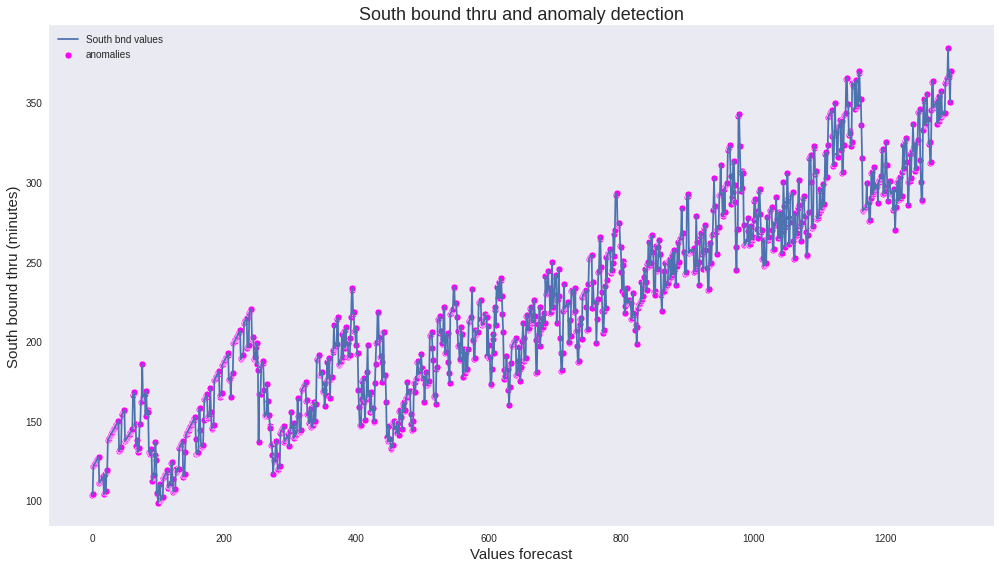

In [ ]:
anom_feature_plot('South bnd values', "South bound thru", anomalies(South_df, 'South bnd values' ) )

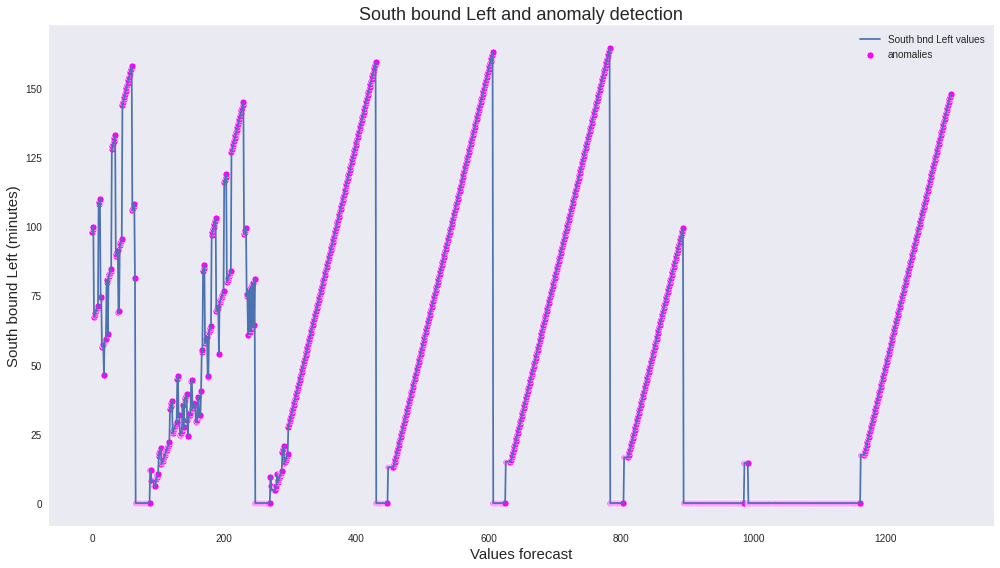

In [ ]:
anom_feature_plot('South bnd Left values', "South bound Left", anomalies(SouthLeft_df, 'South bnd Left values' )  )


In [ ]:
plot_accNorth['North bound thru']

0       36.416667
1       36.708333
2       37.000000
3       37.291667
4       37.583333
          ...    
1295     4.687500
1296     6.300000
1297     7.350000
1298     7.350000
1299     8.553571
Name: North bound thru, Length: 1300, dtype: float64

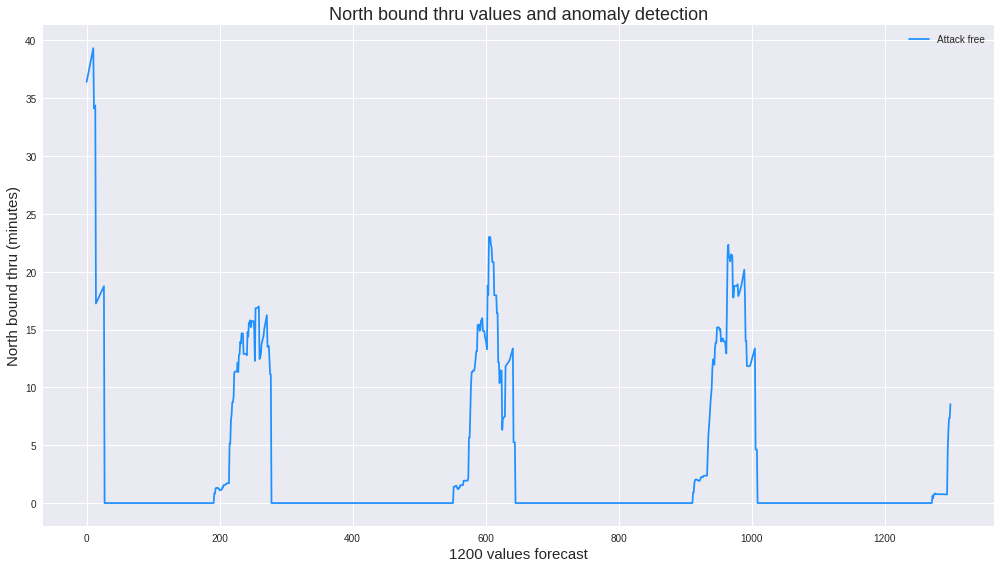

In [ ]:

sns.lineplot(x=plot_accNorth.index, 
               y=plot_accNorth['North bound thru'],
               color='dodgerblue', 
               label='Attack free')

plt.title('North bound thru values and anomaly detection', fontsize=18)
plt.xlabel("1200 values forecast", size=15)
plt.ylabel("North bound thru (minutes)", size=15)
plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
Free_AccWaiting['North bound thru'].nunique()

11751

##### North bound left